# Proyecto 03 - Series de Tiempo

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

#### Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### 1. Preparación del Dataset

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

#Librerias
# exploración de datos
import matplotlib.pyplot as plt
#exploración de datos
import seaborn as sns
# Mejorar el estilo de los gráficos
sns.set()
# fechas
import datetime #Para manipular fechas

import matplotlib.mlab as mlab
import math
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.arima_model import ARIMA

In [5]:
data_2019 = pd.read_csv('../Proyecto 3/flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('../Proyecto 3/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('../Proyecto 3/flujo-vehicular-2017.csv', sep =',')

In [6]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [7]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [8]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [9]:
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [10]:
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [11]:
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [12]:
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

## Exploración de datos

In [13]:
dataset2 = pd.concat([data_2019, data_2018, data_2017])



In [14]:
dataset2.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [15]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset2['fecha2'] = pd.to_datetime(dataset2.fecha) + pd.to_timedelta(dataset2.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset2.drop(columns=['fecha','hora_fin'], inplace = True)

dataset2.head()

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha2
0,2019,0,Martes,Alberti,Centro,Liviano,NO COBRADO,22,2019-01-01 01:00:00
1,2019,0,Martes,Alberti,Centro,Liviano,TELEPASE,6,2019-01-01 01:00:00
2,2019,0,Martes,Alberti,Provincia,Liviano,NO COBRADO,53,2019-01-01 01:00:00
3,2019,0,Martes,Alberti,Provincia,Liviano,TELEPASE,18,2019-01-01 01:00:00
4,2019,0,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16,2019-01-01 01:00:00


In [16]:
#Corregimos el nombre de fecha2 a fecha
dataset2.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset2.head()

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2019,0,Martes,Alberti,Centro,Liviano,NO COBRADO,22,2019-01-01 01:00:00
1,2019,0,Martes,Alberti,Centro,Liviano,TELEPASE,6,2019-01-01 01:00:00
2,2019,0,Martes,Alberti,Provincia,Liviano,NO COBRADO,53,2019-01-01 01:00:00
3,2019,0,Martes,Alberti,Provincia,Liviano,TELEPASE,18,2019-01-01 01:00:00
4,2019,0,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16,2019-01-01 01:00:00


In [17]:
#Reordenamos el dataset por fecha
dataset2.sort_values('fecha', inplace = True)
dataset2.reset_index(drop=True, inplace = True)
dataset2

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2017,23,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01 00:00:00
1,2017,23,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01 00:00:00
2,2017,23,Domingo,Illia,Provincia,Liviano,NO COBRADO,3,2017-01-01 00:00:00
3,2017,23,Domingo,Dellepiane Liniers,Provincia,Liviano,INFRACCION,3,2017-01-01 00:00:00
4,2017,23,Domingo,Avellaneda,Centro,Liviano,NO COBRADO,36,2017-01-01 00:00:00
...,...,...,...,...,...,...,...,...,...
3560701,2019,22,Martes,Dellepiane,Provincia,Pesado,TELEPASE,13,2019-12-31 23:00:00
3560702,2019,22,Martes,Dellepiane,Provincia,Pesado,NO COBRADO,1,2019-12-31 23:00:00
3560703,2019,22,Martes,Dellepiane,Provincia,Pesado,EXENTO,2,2019-12-31 23:00:00
3560704,2019,22,Martes,Dellepiane,Provincia,Liviano,TELEPASE,150,2019-12-31 23:00:00


In [18]:
dataset2.drop(columns = ['periodo','hora_inicio'], inplace = True)

In [19]:
dataset2.head()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01
1,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01
2,Domingo,Illia,Provincia,Liviano,NO COBRADO,3,2017-01-01
3,Domingo,Dellepiane Liniers,Provincia,Liviano,INFRACCION,3,2017-01-01
4,Domingo,Avellaneda,Centro,Liviano,NO COBRADO,36,2017-01-01


In [20]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3560706 entries, 0 to 3560705
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   dia             object        
 1   estacion        object        
 2   sentido         object        
 3   tipo_vehiculo   object        
 4   forma_pago      object        
 5   cantidad_pasos  int64         
 6   fecha           datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 190.2+ MB


In [21]:
#dataset3 = pd.DataFrame(dataset2)

In [22]:
#dataset3.head()

In [23]:
#dataset3.info() #¿porqué no aparece la cantidad?

In [24]:
dataset2.count()

dia               3560706
estacion          3560706
sentido           3560706
tipo_vehiculo     3560706
forma_pago        3560706
cantidad_pasos    3560706
fecha             3560706
dtype: int64

In [25]:
dataset2.sample()
valores_faltantes = dataset2.isnull().sum() #na
valores_faltantes[0:19]
print(valores_faltantes)

dia               0
estacion          0
sentido           0
tipo_vehiculo     0
forma_pago        0
cantidad_pasos    0
fecha             0
dtype: int64


In [26]:
dataset2.shape

(3560706, 7)

In [27]:
dataset2.head(2)

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01
1,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01


**Exploración de cada Feature**

Datos en Día

<AxesSubplot:xlabel='count', ylabel='dia'>

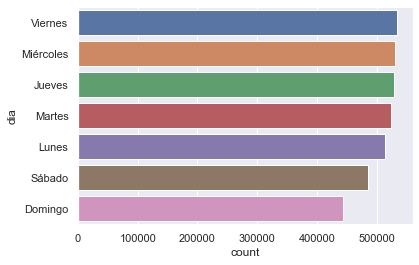

In [28]:

sns.countplot(data = dataset2, y = "dia", order=dataset2['dia'].value_counts().index)

In [29]:
dataset2.dia.value_counts()

Viernes      533516
Miércoles    530814
Jueves       529499
Martes       524142
Lunes        513441
Sábado       485495
Domingo      443799
Name: dia, dtype: int64

Datos en estación

<AxesSubplot:xlabel='count', ylabel='estacion'>

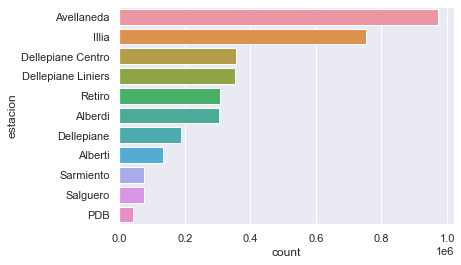

In [30]:
sns.countplot(data = dataset2, y = "estacion", order=dataset2['estacion'].value_counts().index)

In [31]:
# mirar tipo de pago de las dos primeras.

In [32]:
dataset2.estacion.value_counts()

Avellaneda            972656
Illia                 752552
Dellepiane Centro     356885
Dellepiane Liniers    353680
Retiro                307528
Alberdi               303620
Dellepiane            187600
Alberti               132279
Sarmiento              76634
Salguero               76308
PDB                    40964
Name: estacion, dtype: int64

Datos en tipo_vehiculo

<AxesSubplot:xlabel='count', ylabel='tipo_vehiculo'>

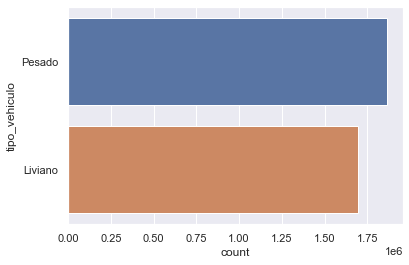

In [33]:
sns.countplot(data = dataset2, y = "tipo_vehiculo", order=dataset2['tipo_vehiculo'].value_counts().index)

In [34]:
dataset2.tipo_vehiculo.value_counts()

Pesado     1864314
Liviano    1696392
Name: tipo_vehiculo, dtype: int64

Datos en forma_pago

<AxesSubplot:xlabel='count', ylabel='forma_pago'>

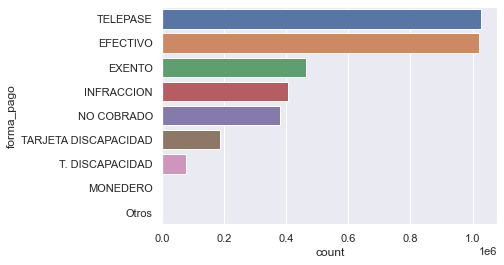

In [35]:

sns.countplot(data = dataset2, y = "forma_pago", order=dataset2['forma_pago'].value_counts().index)

Se visualiza que la modalidad de pago de Telepase tiene una gran cantidad de frecuencia como el efectivo, por lo cual, es un dato importante para tener encuenta según el comportamieto de la Serie.

In [36]:
dataset2.forma_pago.value_counts()

TELEPASE                1027861
EFECTIVO                1020176
EXENTO                   464708
INFRACCION               405034
NO COBRADO               380450
TARJETA DISCAPACIDAD     186454
T. DISCAPACIDAD           76001
MONEDERO                     14
Otros                         8
Name: forma_pago, dtype: int64

In [37]:
dataset2.head(2)

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01
1,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01


In [38]:
mask =(dataset2.forma_pago == 'TELEPASE')
datasetX = dataset2[mask]

In [39]:
datasetX.head()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
11,Domingo,Avellaneda,Centro,Liviano,TELEPASE,767,2017-01-01
13,Domingo,Avellaneda,Centro,Pesado,TELEPASE,17,2017-01-01
15,Domingo,Avellaneda,Centro,Pesado,TELEPASE,9,2017-01-01
17,Domingo,Avellaneda,Centro,Pesado,TELEPASE,1,2017-01-01
19,Domingo,Avellaneda,Centro,Pesado,TELEPASE,10,2017-01-01


Graficando formas de pago

In [40]:
!pip install plotnine

In [385]:
import matplotlib.pyplot as plt
%matplotlib inline
import plotnine as p9

In [386]:
diario_counts = datasetX.groupby(['fecha', 'forma_pago'])['cantidad_pasos'].sum()
diario_counts

fecha                forma_pago
2017-01-01 00:00:00  TELEPASE      2975
2017-01-01 01:00:00  TELEPASE       608
2017-01-01 02:00:00  TELEPASE      3032
2017-01-01 03:00:00  TELEPASE      3304
2017-01-01 04:00:00  TELEPASE      1926
                                   ... 
2019-12-31 19:00:00  TELEPASE      5197
2019-12-31 20:00:00  TELEPASE      6355
2019-12-31 21:00:00  TELEPASE      8171
2019-12-31 22:00:00  TELEPASE      5653
2019-12-31 23:00:00  TELEPASE      1095
Name: cantidad_pasos, Length: 26203, dtype: int64

In [387]:
diario_counts = diario_counts.reset_index(name='counts')
diario_counts

,fecha,forma_pago,counts
0,2017-01-01 00:00:00,TELEPASE,2975
1,2017-01-01 01:00:00,TELEPASE,608
2,2017-01-01 02:00:00,TELEPASE,3032
3,2017-01-01 03:00:00,TELEPASE,3304
4,2017-01-01 04:00:00,TELEPASE,1926
...,...,...,...
26198,2019-12-31 19:00:00,TELEPASE,5197
26199,2019-12-31 20:00:00,TELEPASE,6355
26200,2019-12-31 21:00:00,TELEPASE,8171
26201,2019-12-31 22:00:00,TELEPASE,5653


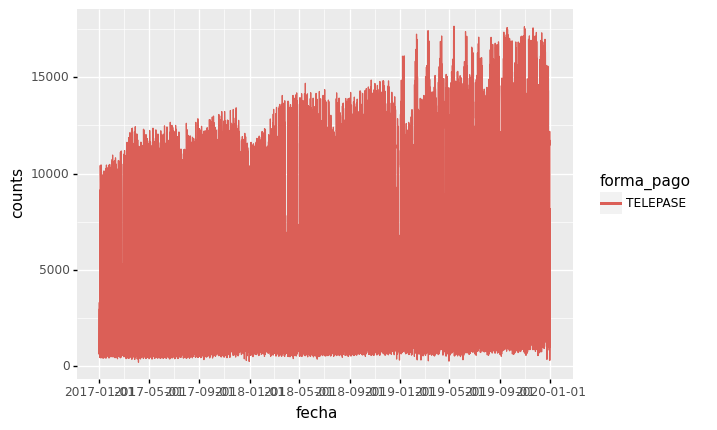

<ggplot: (88619740004)>

In [388]:
(p9.ggplot(data=diario_counts,
           mapping=p9.aes(x='fecha',
                          y='counts',
                          color='forma_pago'))
    + p9.geom_line()
)


In [381]:
maskY =(dataset2.forma_pago == 'EFECTIVO')
datasetY = dataset2[maskY]

In [382]:
diario_counts = datasetY.groupby(['fecha', 'forma_pago'])['cantidad_pasos'].sum()
diario_counts

fecha                forma_pago
2017-01-01 00:00:00  EFECTIVO      7790
2017-01-01 01:00:00  EFECTIVO        11
2017-01-01 02:00:00  EFECTIVO      7992
2017-01-01 03:00:00  EFECTIVO      9182
2017-01-01 04:00:00  EFECTIVO      6168
                                   ... 
2019-12-31 19:00:00  EFECTIVO      6328
2019-12-31 20:00:00  EFECTIVO      7017
2019-12-31 21:00:00  EFECTIVO      8407
2019-12-31 22:00:00  EFECTIVO      6596
2019-12-31 23:00:00  EFECTIVO      2300
Name: cantidad_pasos, Length: 26166, dtype: int64

In [383]:
diario_counts = diario_counts.reset_index(name='counts')
diario_counts

,fecha,forma_pago,counts
0,2017-01-01 00:00:00,EFECTIVO,7790
1,2017-01-01 01:00:00,EFECTIVO,11
2,2017-01-01 02:00:00,EFECTIVO,7992
3,2017-01-01 03:00:00,EFECTIVO,9182
4,2017-01-01 04:00:00,EFECTIVO,6168
...,...,...,...
26161,2019-12-31 19:00:00,EFECTIVO,6328
26162,2019-12-31 20:00:00,EFECTIVO,7017
26163,2019-12-31 21:00:00,EFECTIVO,8407
26164,2019-12-31 22:00:00,EFECTIVO,6596


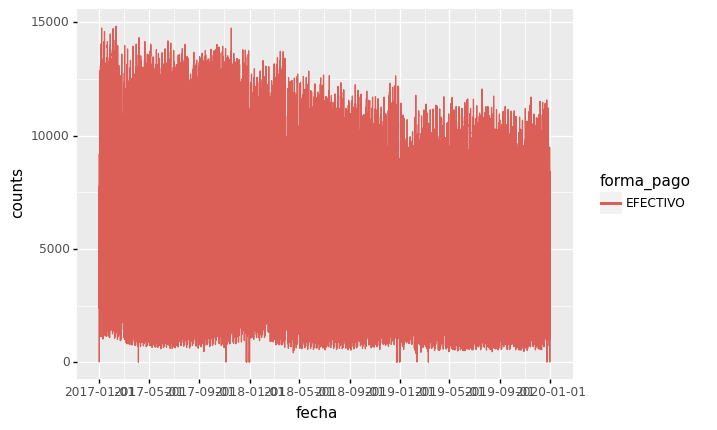

<ggplot: (88663559903)>

In [384]:
(p9.ggplot(data=diario_counts,
           mapping=p9.aes(x='fecha',
                          y='counts',
                          color='forma_pago'))
    + p9.geom_line()
)


Se puede observar de antemano, que la modealidad de EFECTIVO a medida que pasan los años (del 2017 al 2019) tiende hacia abajo, tiene una tendencia bajista, contrario a lo que pasa en la gráfica de más arriba con la modalidad de TELEPASE, tiende hacia arriba. Por lo cual, es de esperar que la serie de tiempo que vamos a estudiar enfocada a la modalidad de efectivo, tenga pendiente negativa.

Datos en sentido

<AxesSubplot:xlabel='count', ylabel='sentido'>

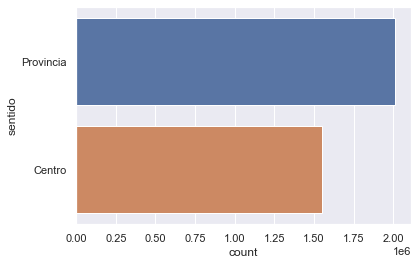

In [49]:

sns.countplot(data = dataset2, y = "sentido", order=dataset2['sentido'].value_counts().index)

In [50]:
dataset2.sentido.value_counts()

Provincia    2010855
Centro       1549851
Name: sentido, dtype: int64

Como esta la cantidad de pasos

<AxesSubplot:xlabel='cantidad_pasos'>

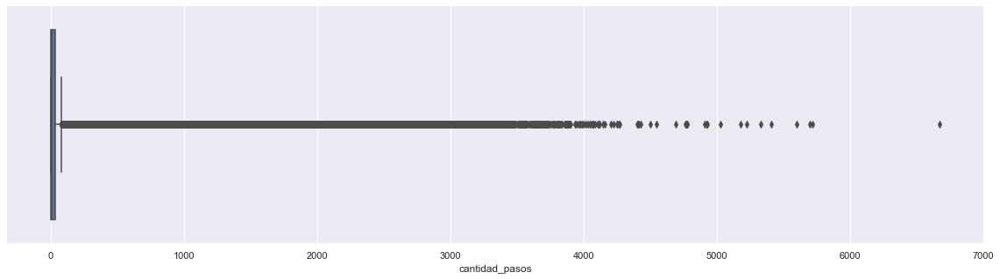

In [51]:
#Encontrando valores atípicos en la columna cantidad de pasos
plt.figure(figsize=(20,5))
sns.boxplot(data = dataset2, x = "cantidad_pasos")

C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


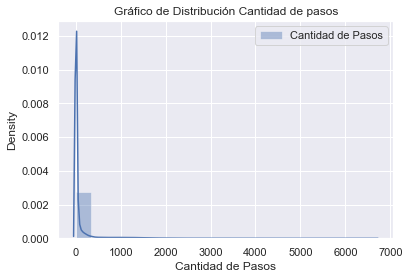

In [52]:
#Distribución de los pasos en todo el dataset

sns.distplot(dataset2.cantidad_pasos, bins = 20, label = 'Cantidad de Pasos')
plt.title('Gráfico de Distribución Cantidad de pasos')
plt.xlabel('Cantidad de Pasos')
plt.legend()

In [53]:
#plt.title('Exploración Inicial')
#sns.pairplot(dataset2, hue = 'tipo_vehiculo', vars= ['cantidad_pasos', 'fecha'])                                                    
#plt.show()

In [54]:
dataset2.head(2)

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01
1,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01


## Exploración de datos enfocado

Vamos a estar trabajando con la estación **Illia** y la forma de pago **Efectivo**


In [55]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])

#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
80,2019-01-01,2,Martes,Centro,Liviano,537
86,2019-01-01,2,Martes,Centro,Pesado,1
88,2019-01-01,2,Martes,Provincia,Liviano,443
94,2019-01-01,2,Martes,Provincia,Pesado,1
149,2019-01-01,3,Martes,Centro,Liviano,769


In [56]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [57]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [58]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238865,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


Datos en día

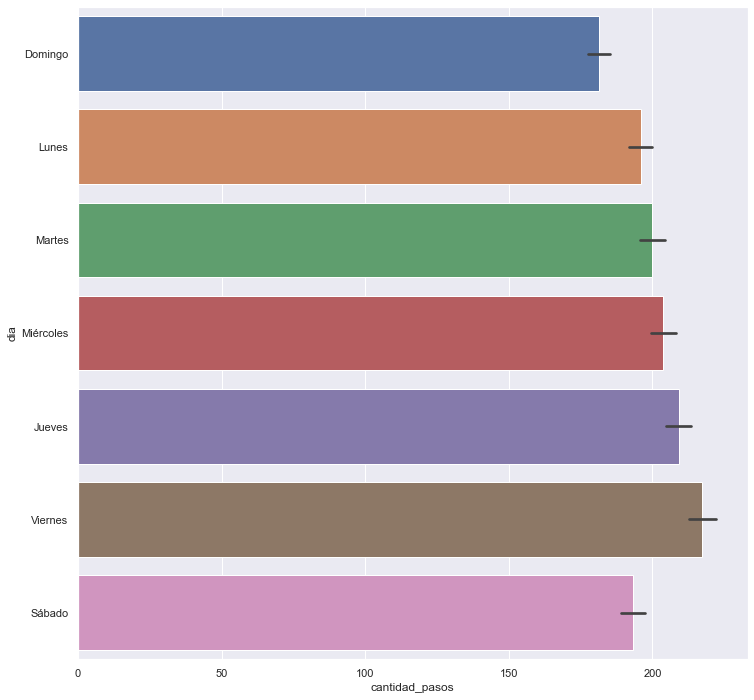

In [376]:


sns.barplot(data = dataset, x = "cantidad_pasos", y = 'dia')# ,order=dataset['dia'].value_counts().index) 
plt.savefig('FrecuenciaDías.png')

#sumar la cantidad de vehiculos( OJO!!!) CORREGIRLO...! Groupby

Se observa que hay más cantidad de pasos los viernes que cualquier otro día, pero no se ve ua diferencia considerable para resaltar.

In [60]:
dataset.dia.value_counts()

Viernes      35196
Miércoles    35005
Jueves       34914
Martes       34335
Lunes        34144
Sábado       33351
Domingo      31924
Name: dia, dtype: int64

Datos en sentido

<AxesSubplot:xlabel='count', ylabel='sentido'>

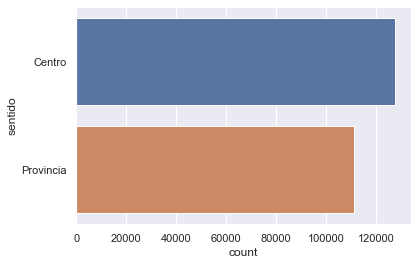

In [61]:
sns.countplot(data = dataset, y = "sentido", order=dataset['sentido'].value_counts().index)

<AxesSubplot:xlabel='sentido', ylabel='cantidad_pasos'>

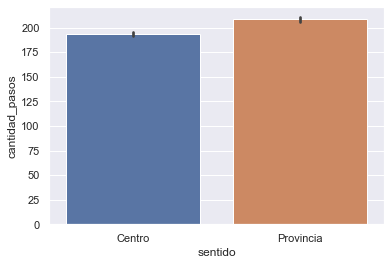

In [62]:
sns.barplot(data = dataset, y = "cantidad_pasos", x = 'sentido' ,order=dataset['sentido'].value_counts().index) 

Salen más automoviles hacia la provincia que hacia el centro en la estación Ilia.

In [63]:
dataset.sentido.value_counts()

Centro       127696
Provincia    111173
Name: sentido, dtype: int64

Datos en tipo_vehiculo

<AxesSubplot:xlabel='count', ylabel='tipo_vehiculo'>

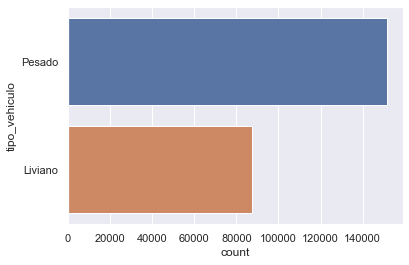

In [64]:
sns.countplot(data = dataset, y = "tipo_vehiculo", order=dataset['tipo_vehiculo'].value_counts().index)
#la media de pesado y la media de liviano por día

In [65]:
dataset.tipo_vehiculo.value_counts()

Pesado     151521
Liviano     87348
Name: tipo_vehiculo, dtype: int64

<AxesSubplot:xlabel='cantidad_pasos', ylabel='tipo_vehiculo'>

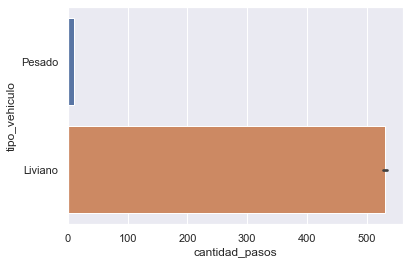

In [66]:
sns.barplot(data = dataset, x = "cantidad_pasos", y = "tipo_vehiculo", order=dataset['tipo_vehiculo'].value_counts().index)

En la estación Ilia pasan en un día, más vehiculos livianos que pesados. En este caso, pasaro más de 500 vehiculos pesados en un día.

C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


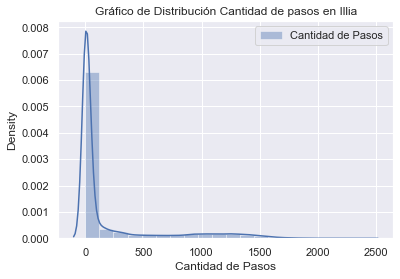

In [67]:
#Distribución de los pasos en la estación Illia

sns.distplot(dataset.cantidad_pasos, bins = 20, label = 'Cantidad de Pasos')
plt.title('Gráfico de Distribución Cantidad de pasos en Illia')
plt.xlabel('Cantidad de Pasos')
plt.legend()

Se notan valores atípicos, por lo que puede perjudicar cualquier intento de modelo. Por lo cual, más adelante se procederá a encontrar dichos valores y a polarizarlos para tener un mejor rendimiento en as predicciones de los modelos a proponer.

<AxesSubplot:xlabel='cantidad_pasos'>

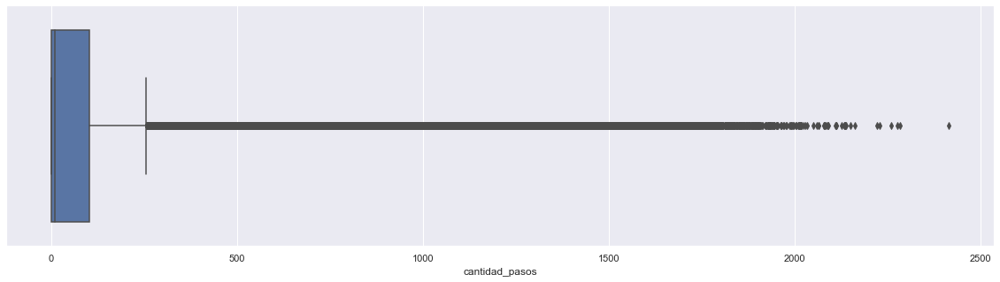

In [68]:
#Encontrando valores atípicos en la columna cantidad de pasos
plt.figure(figsize=(20,5))
sns.boxplot(data = dataset, x = "cantidad_pasos")

Se observan claramente los valores atípicos.

In [69]:
dataset.describe()

,cantidad_pasos
count,238869.000000
mean,200.384232
std,403.246904
min,1.000000
25%,2.000000
50%,11.000000
75%,104.000000
max,2416.000000


Se puede observar que la desviación estandar esta al doble de la media, una mala señal para corregir eliminando los valores atípicos.

In [70]:
dataset.shape

(238869, 5)

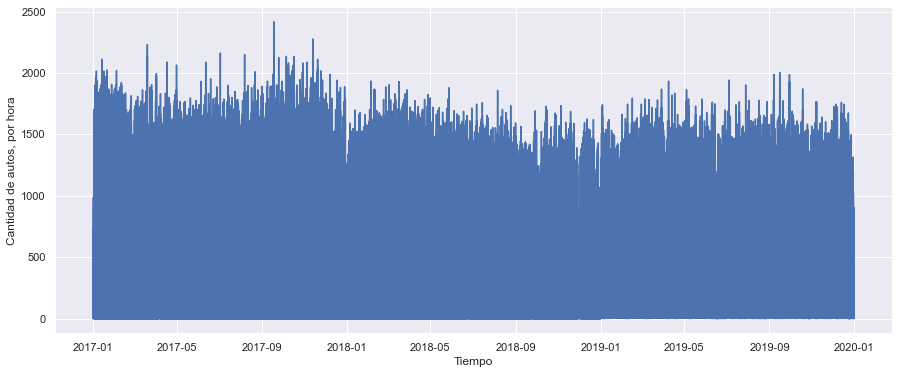

In [71]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset.fecha, dataset.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

No se evidencia un patrón en los datos para poder hayar un modelo a implementar y una autocorrelación.

In [72]:
dataset.describe()

,cantidad_pasos
count,238869.000000
mean,200.384232
std,403.246904
min,1.000000
25%,2.000000
50%,11.000000
75%,104.000000
max,2416.000000


In [73]:
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01
2,Domingo,Provincia,Liviano,644,2017-01-01
3,Domingo,Provincia,Pesado,6,2017-01-01
4,Domingo,Provincia,Pesado,1,2017-01-01


C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


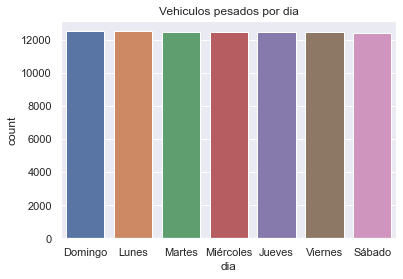

In [74]:
P1 = dataset[dataset.tipo_vehiculo == 'Liviano']
sns.countplot(P1.dia)
plt.title('Vehiculos pesados por dia')
plt.show()

## Resampleo

**¿Sumamos (.sum()) la cantidad de pasos o hacemos el promedio(.mean()), mediana?**

RESAMPLEO DIARIO

In [75]:
#Resampleamos SUMA nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


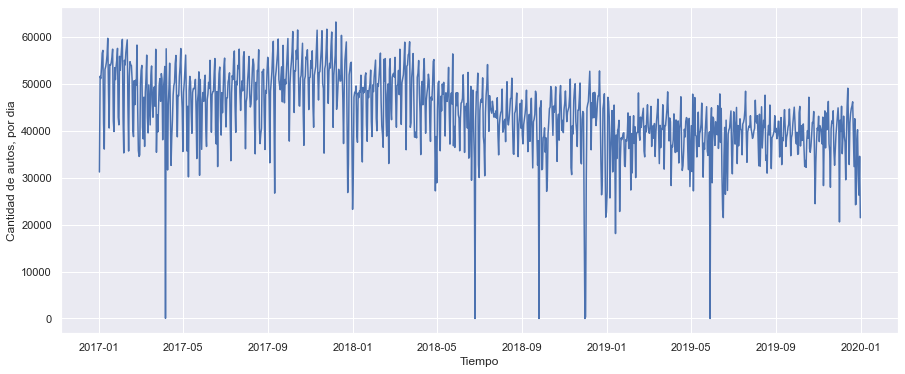

In [76]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

Se puede evidenciar que hay valores atípicos alrededor de los meses de mayo en el año 2017, 2018 y 2019; además de los valores atípicos de cerca a septiembre del 2018 y enero de 2019

In [77]:
#Resampleamos promedio nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diariom = dataset.resample('D', on = 'fecha').mean()
print(diariom.shape)
diariom.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,134.991342
2017-01-02,163.189873
2017-01-03,166.426710
2017-01-04,166.143302
2017-01-05,177.628931


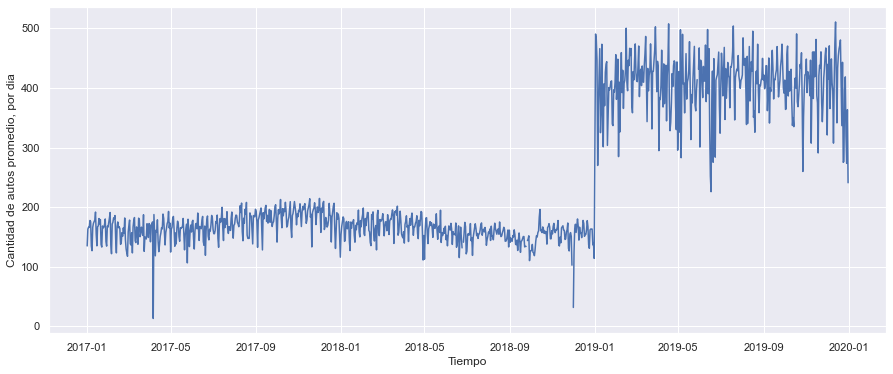

In [78]:
plt.figure(figsize = (15,6))
plt.plot(diariom.index, diariom.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos promedio, por dia')
plt.show()

Quería saber de manera ilustrativa cómo se comportaba el promedio de la cantidad de pasos cada día, se evidencia un salto abrupto en enero de 2019, sin embargo, creo que la interpretabilidad de los datos cambiarían considerablemente si trabajo con este tipo de promedio diario, por lo tanto, está gráfica solo es ilustrativa.

In [79]:
diariom.isna().sum()

cantidad_pasos    4
dtype: int64

RESAMPLEO SEMANAL

In [80]:
#Resampleamos SUMA nuestros datos para agrupar por semana, y asi tal vez lograr una visualización mas amigable
semana = dataset.resample('W', on = 'fecha').sum()
print(semana.shape)
semana.head()

(158, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-08,347212
2017-01-15,366413
2017-01-22,357215
2017-01-29,354581


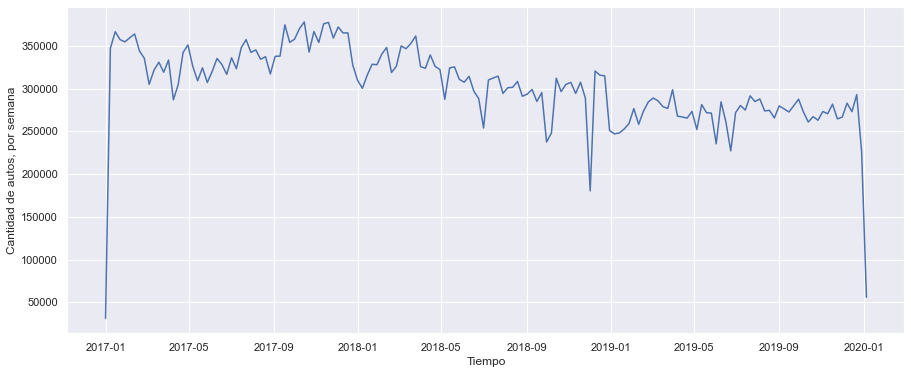

In [81]:
plt.figure(figsize = (15,6))
plt.plot(semana.index, semana.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por semana')
plt.show()

Podemos observar que los datos de manera semanal no tiene un patrón definido para implementar un modelo.

In [82]:
# No utilizar la última semana y primera semana si vamos a utilizar este horizonte de tiempo.

In [83]:
#Resampleamos PROMEDIO nuestros datos para agrupar por semana, y asi tal vez lograr una visualización mas amigable
semanam = dataset.resample('W', on = 'fecha').mean()
print(semanam.shape)
semanam.head()

(158, 1)


,cantidad_pasos
fecha,
2017-01-01,134.991342
2017-01-08,159.344654
2017-01-15,168.002293
2017-01-22,162.963047
2017-01-29,161.540319


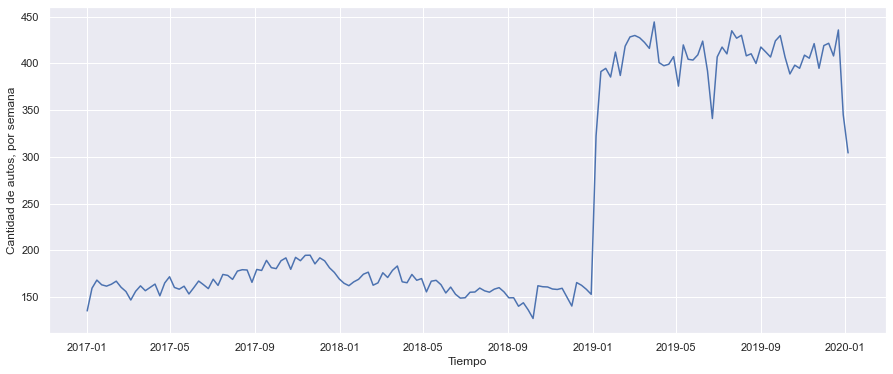

In [84]:
plt.figure(figsize = (15,6))
plt.plot(semanam.index, semanam.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por semana')
plt.show()

RESAMPLO POR MES

In [85]:
#Resampleamos SUMA nuestros datos para agrupar por mes, y asi tal vez lograr una visualización mas amigable
mes = dataset.resample('M', on = 'fecha').sum()
print(mes.shape)
mes.head()

(36, 1)


,cantidad_pasos
fecha,
2017-01-31,1565260
2017-02-28,1363113
2017-03-31,1451214
2017-04-30,1373985
2017-05-31,1407136


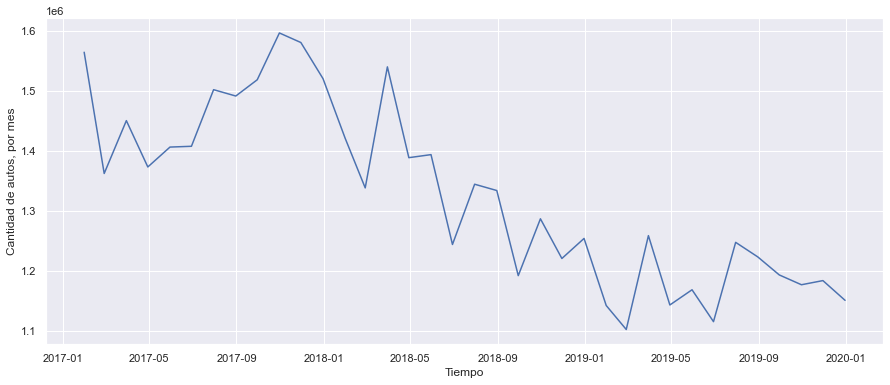

In [86]:
plt.figure(figsize = (15,6))
plt.plot(mes.index, mes.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por mes')
plt.show()

Pasa lo mismo con el resampleo por mes, los datos no cuentan con un patrón y con mucho ruido para implementar un modelo, además solo contaríamos con 36 datos, muy pocos para proponer algún tipo de trabajo.

In [87]:
#Resampleamos PROMEDIO nuestros datos para agrupar por mes, y asi tal vez lograr una visualización mas amigable
mesm = dataset.resample('M', on = 'fecha').mean()
print(mesm.shape)
mesm.head()

(36, 1)


,cantidad_pasos
fecha,
2017-01-31,162.590631
2017-02-28,158.464659
2017-03-31,158.481380
2017-04-30,162.467187
2017-05-31,158.675688


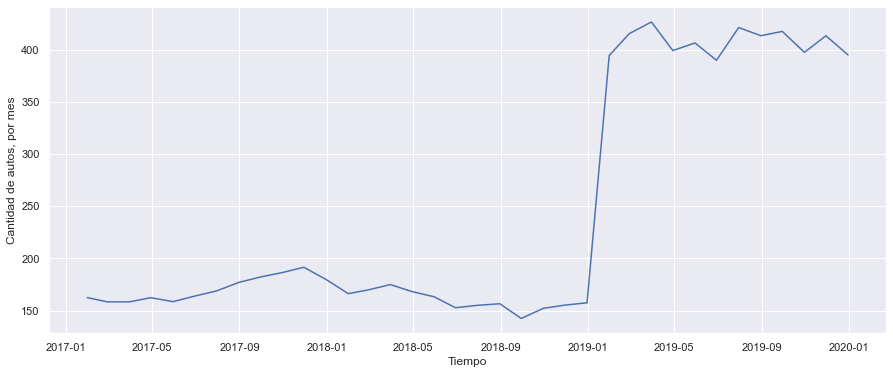

In [88]:
plt.figure(figsize = (15,6))
plt.plot(mesm.index, mesm.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por mes')
plt.show()

RESAMPLEO POR MES

In [89]:
#Resampleamos SUMA nuestros datos para agrupar por hora, y asi tal vez lograr una visualización mas amigable
hora = dataset.resample('h', on = 'fecha').sum()
print(hora.shape)
hora.head()

(26280, 1)


,cantidad_pasos
fecha,
2017-01-01 00:00:00,1576
2017-01-01 01:00:00,1
2017-01-01 02:00:00,1374
2017-01-01 03:00:00,1734
2017-01-01 04:00:00,1247


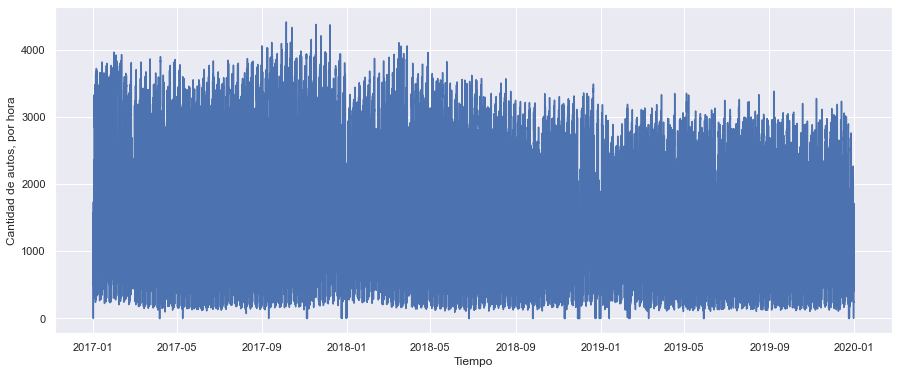

In [90]:
#Hay que partir el dataset para ver mejor la hora
plt.figure(figsize = (15,6))
plt.plot(hora.index, hora.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

Por horas, no muestra una forma para poder trabajar y proponer un modelo.

In [91]:
#Resampleamos PROMEDIO nuestros datos para agrupar por hora, y asi tal vez lograr una visualización mas amigable
horam = dataset.resample('h', on = 'fecha').sum()
print(horam.shape)
horam.head()

(26280, 1)


,cantidad_pasos
fecha,
2017-01-01 00:00:00,1576
2017-01-01 01:00:00,1
2017-01-01 02:00:00,1374
2017-01-01 03:00:00,1734
2017-01-01 04:00:00,1247


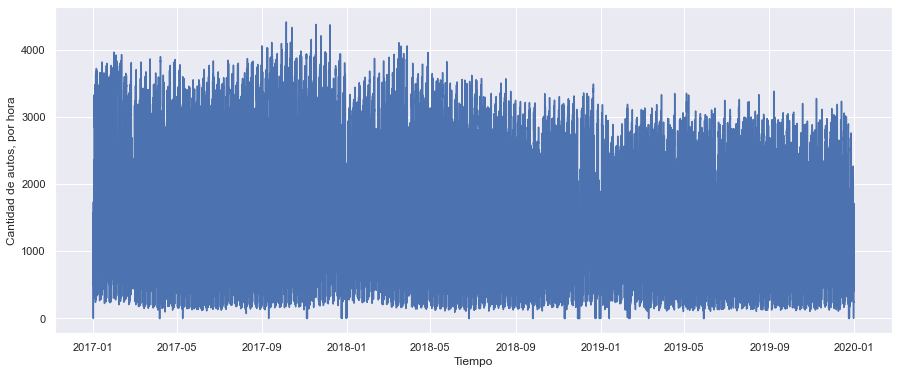

In [92]:
#Hay que partir el dataset para ver mejor la hora
plt.figure(figsize = (15,6))
plt.plot(horam.index, horam.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [93]:
#Resampleamos nuestros datos para agrupar por hora, y asi tal vez lograr una visualización mas amigable
sem = dataset.resample('6M', on = 'fecha').sum()
print(sem.shape)
sem.head()

(7, 1)


,cantidad_pasos
fecha,
2017-01-31,1565260
2017-07-31,8506732
2018-01-31,9133187
2018-07-31,8253924
2019-01-31,7434376


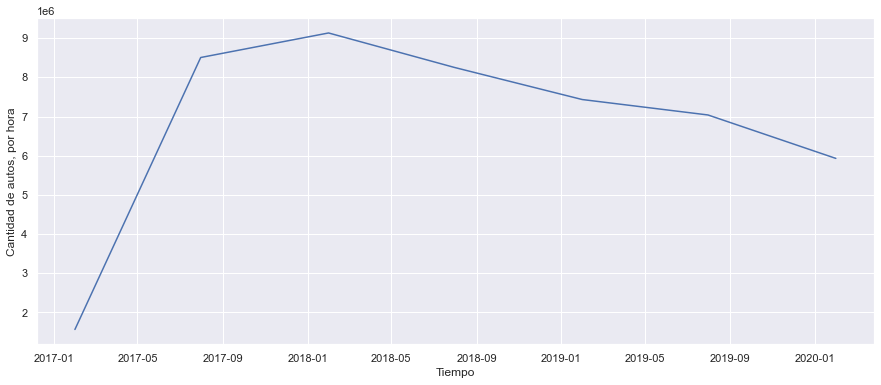

In [94]:
#Hay que partir el dataset para ver mejor la hora
plt.figure(figsize = (15,6))
plt.plot(sem.index, sem.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [95]:
#Resampleamos SUMA nuestros datos para agrupar por mes, y asi tal vez lograr una visualización mas amigable
trim = dataset.resample('3M', on = 'fecha').sum()
print(trim.shape)
trim.head()

(13, 1)


,cantidad_pasos
fecha,
2017-01-31,1565260
2017-04-30,4188312
2017-07-31,4318420
2017-10-31,4608915
2018-01-31,4524272


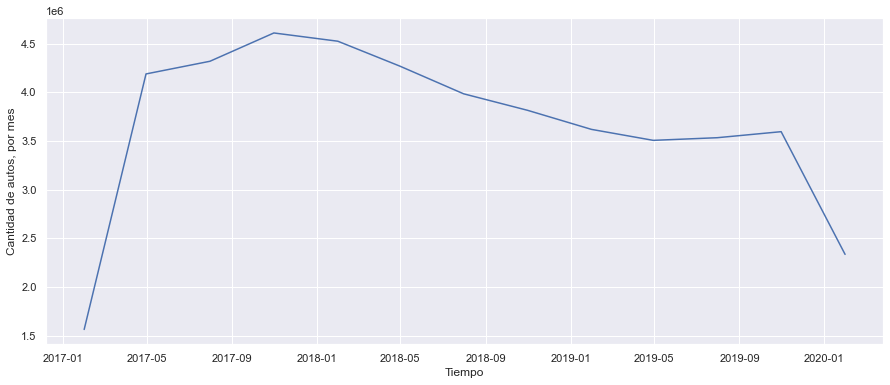

In [96]:
plt.figure(figsize = (15,6))
plt.plot(trim.index, trim.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por mes')
plt.show()

**Conclusión:**
Se propone entonces trabajar con el resampleo diario, tiene una buena cantidad de datos para trabajar, y aunque tenga valores atípicos se pueden eliminar y reemplazar según el comportamiento de la serie para un mejor desempeño y proponer modelos con mejores predicciones.

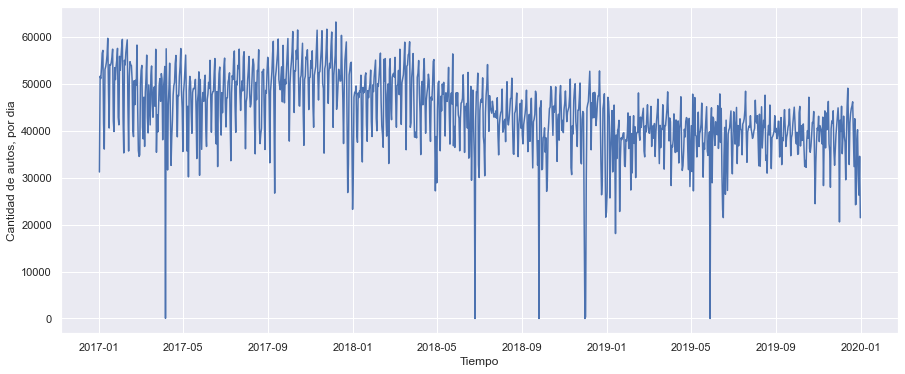

In [97]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [98]:
diario.cantidad_pasos[diario.cantidad_pasos < 20000] = np.nan

In [99]:
diario.isna().sum()

cantidad_pasos    8
dtype: int64

In [100]:
print(diario.isna().sum())
diario = diario.interpolate()
print(diario.isna().sum())

cantidad_pasos    8
dtype: int64
cantidad_pasos    0
dtype: int64


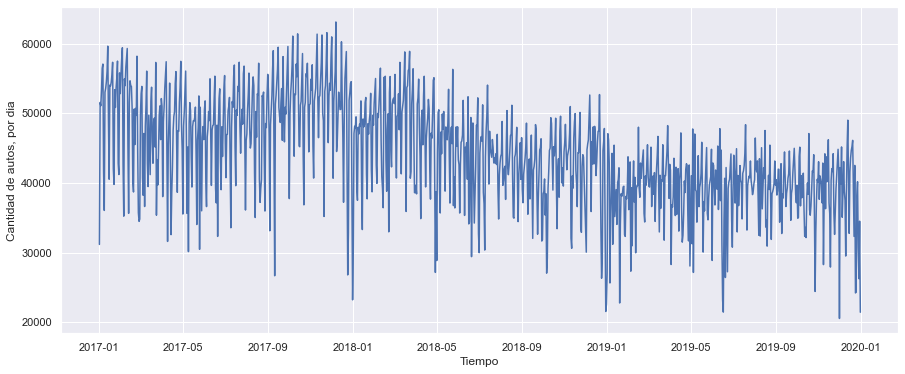

In [101]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


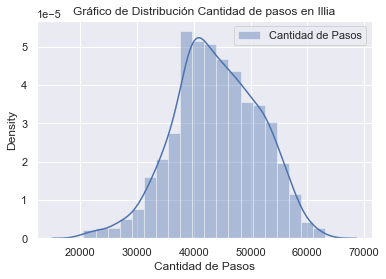

In [102]:
#Distribución de los pasos en la estación Illia

sns.distplot(diario.cantidad_pasos, bins = 20, label = 'Cantidad de Pasos')
plt.title('Gráfico de Distribución Cantidad de pasos en Illia')
plt.xlabel('Cantidad de Pasos')
plt.legend()

**VENTANA DE TIEMPO**

In [103]:
ventana = int(365*1/7) #Esto es una ventana 
#ventana= 7
diario_promedio_tendencia = diario.cantidad_pasos.rolling(window=ventana, center = False).mean()


In [104]:
diario_promedio_tendencia.isna().sum()

51

¿Por qué aparecen tanto valores faltantes?¿Cuántos son?¿A qué corresponde?

Grafiquemos

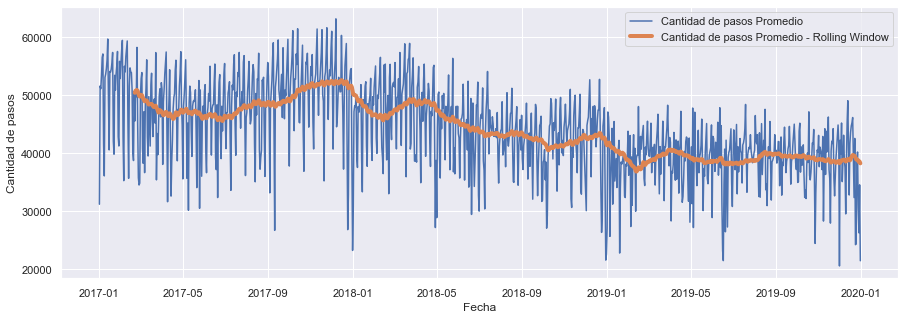

In [105]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Cantidad de pasos Promedio')
plt.plot(diario_promedio_tendencia, lw = 4, label = 'Cantidad de pasos Promedio - Rolling Window')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Se evidencia que la tendiencia va disminuyendo a traves del tiempo, esto puede sugerir que hay otros pasos habilidatos o estaciones, también como lo veíamos en la exploración de datos general, TELEPASE tiene una gran cantidad de registros. Lo que sugiere que también puede ser un factor de disminución de resgistros en este caso de estudio, ya que aquí solo se estudia la forma de pago en EFECTIVO.

Regresión Lineal para la linea de tendencia

In [106]:
diario['fecha_numeros']=diario.index.map(datetime.datetime.toordinal)
diario.head()

,cantidad_pasos,fecha_numeros
fecha,,
2017-01-01,31183.0,736330
2017-01-02,51568.0,736331
2017-01-03,51093.0,736332
2017-01-04,53332.0,736333
2017-01-05,56486.0,736334


In [107]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

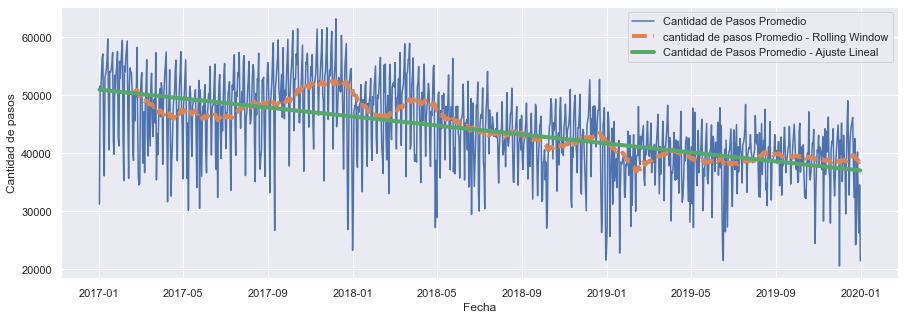

In [108]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Cantidad de Pasos Promedio')
plt.plot(diario_promedio_tendencia, ls = '--', lw = 4, label = 'cantidad de pasos Promedio - Rolling Window')
plt.plot(diario.index, lr.predict(diario.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de Pasos Promedio - Ajuste Lineal')
# plt.xlim(datetime.date(1985,1,1), datetime.date(2018,1,1))
# plt.ylim([0,30])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Como se observo anteriormente, la tendencia es a la baja a medida que se avanza en el tiempo.

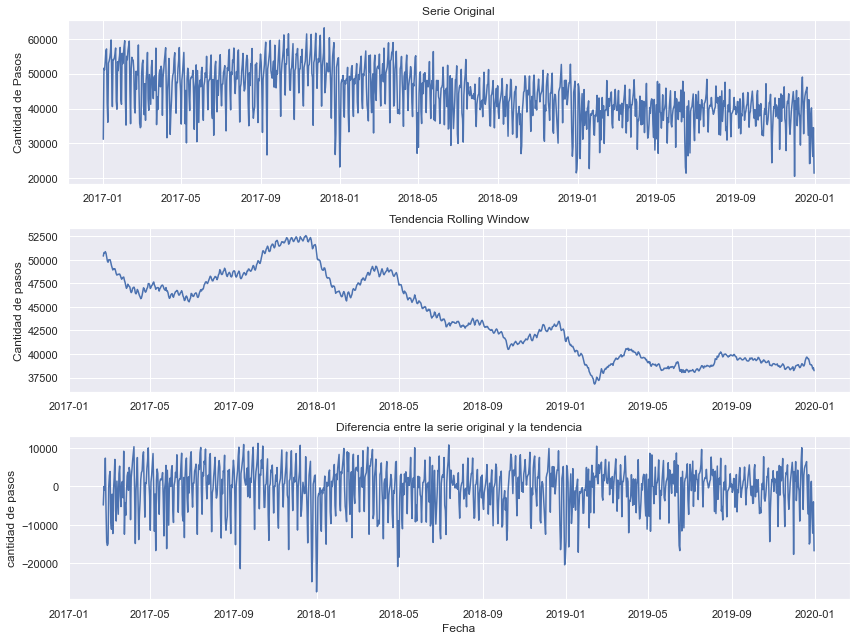

In [109]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diario.index, diario.cantidad_pasos)
plt.ylabel('Cantidad de Pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(diario_promedio_tendencia)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(diario.index, diario.cantidad_pasos - diario_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('cantidad de pasos')

plt.tight_layout()
plt.show()


En este gráfico, en donde vemos 3 gráficas, la primera es la serie original, la segunda es como se comporta la tendencia y la tercer como el título lo dice, es la diferencia entre la serie original y la tendencia lo que nos da como resultado el Ruido. Esta última gráfica tiene indicios de Ruido Blanco, ya que parece tener media cero y varianza constante, dos de varias condiciones para que el Ruido no tenga patrón.

**DESCOMPOSICÓN ESTACIONAL**

In [110]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(diario.cantidad_pasos, model='additive')
#result.plot()
#plt.show()

In [111]:
result.trend

fecha
2017-01-01             NaN
2017-01-02             NaN
2017-01-03             NaN
2017-01-04    48904.285714
2017-01-05    49601.714286
                  ...     
2019-12-27    31197.428571
2019-12-28    30801.285714
2019-12-29             NaN
2019-12-30             NaN
2019-12-31             NaN
Freq: D, Name: trend, Length: 1095, dtype: float64

In [112]:
result.seasonal

fecha
2017-01-01   -6913.633825
2017-01-02   -1154.534747
2017-01-03      91.375852
2017-01-04    1912.707109
2017-01-05    3278.564023
                 ...     
2019-12-27    5255.209856
2019-12-28   -2469.688267
2019-12-29   -6913.633825
2019-12-30   -1154.534747
2019-12-31      91.375852
Freq: D, Name: seasonal, Length: 1095, dtype: float64

Grafiquemos.

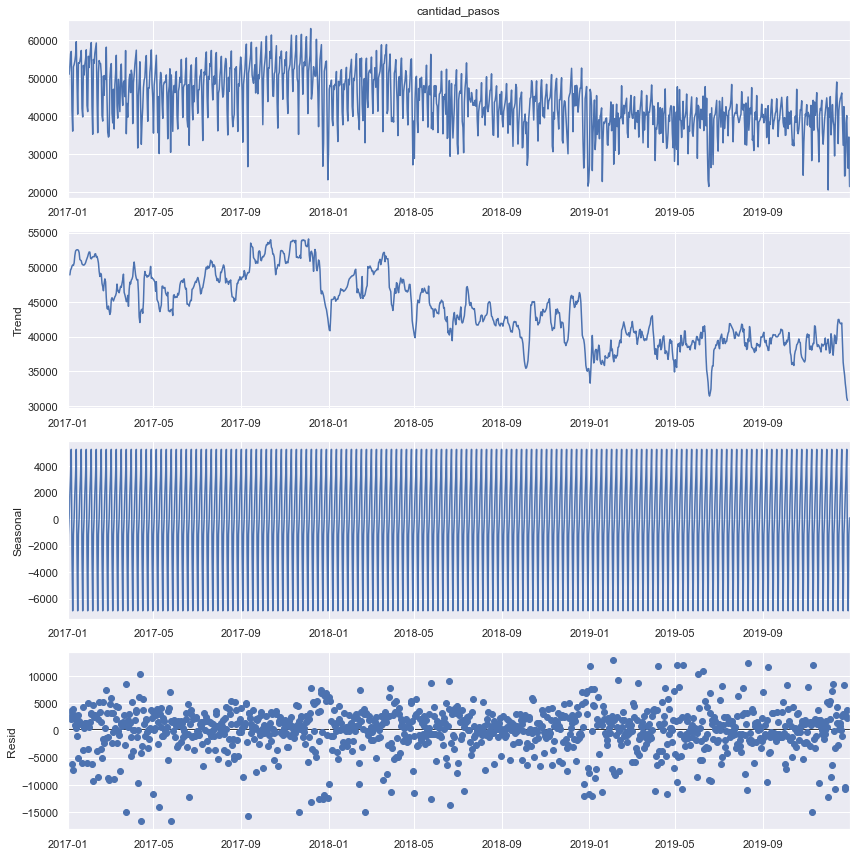

In [113]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = [12,12]
result.plot()
plt.show()

Este gráfico, nos confirma las afirmaciones que hemos venido haciendo: 

La **tendencia** aunque bolatil tiende a la baja, hay **estacionalidad** en la serie y los **residuos** están alrededor de 0, lo cual es una buena señal para el modelo a proponer.

# Metodología de Box - Jenkins

RESAMPLEO DIARIO

**RESAMPLEO DIARIO CON LA SUMA**

In [114]:
#Resampleamos SUMA nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


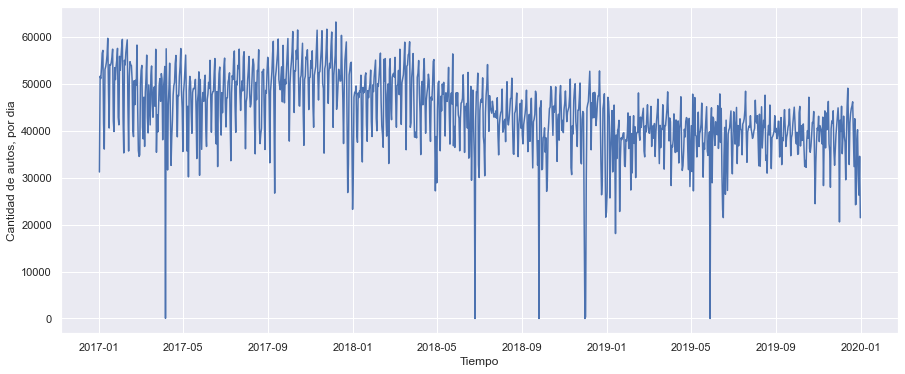

In [115]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


<AxesSubplot:xlabel='cantidad_pasos'>

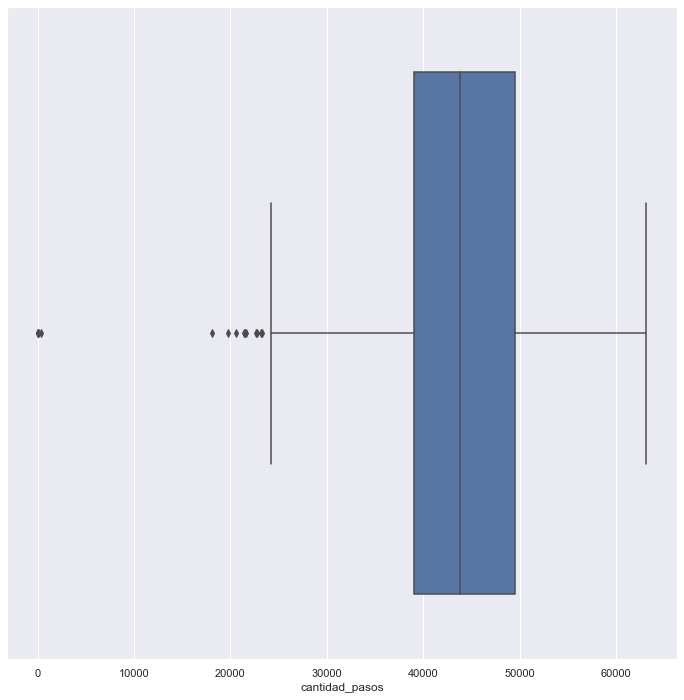

In [116]:
sns.boxplot(diario.cantidad_pasos)

In [117]:
diario.describe()

,cantidad_pasos
count,1095.000000
mean,43712.859361
std,8192.736927
min,0.000000
25%,39061.500000
50%,43761.000000
75%,49498.000000
max,63127.000000


In [118]:
diario.isna().sum()

cantidad_pasos    0
dtype: int64

In [119]:
diario.cantidad_pasos[diario.cantidad_pasos < 20000] = np.nan


In [120]:
print(diario.isna().sum())
diario = diario.interpolate()
print(diario.isna().sum())

cantidad_pasos    8
dtype: int64
cantidad_pasos    0
dtype: int64


C:\Users\Camilo\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


<AxesSubplot:xlabel='cantidad_pasos'>

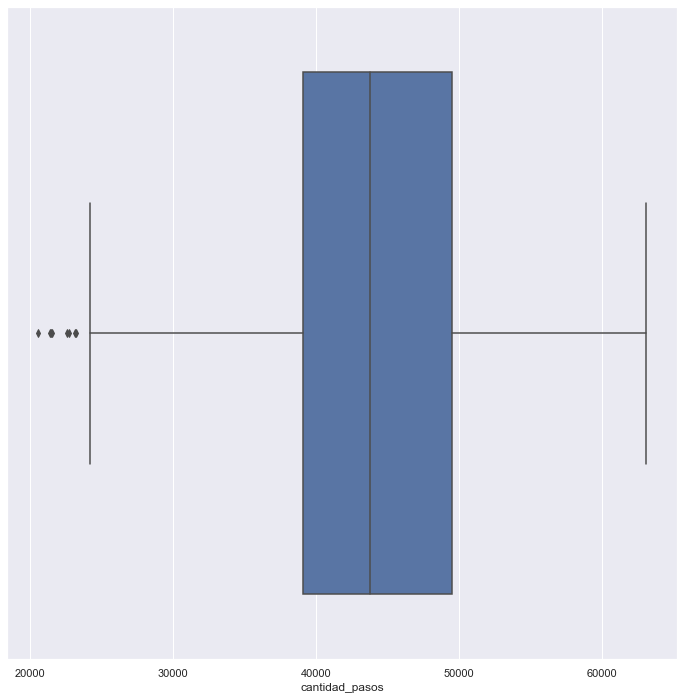

In [121]:
sns.boxplot(diario.cantidad_pasos)

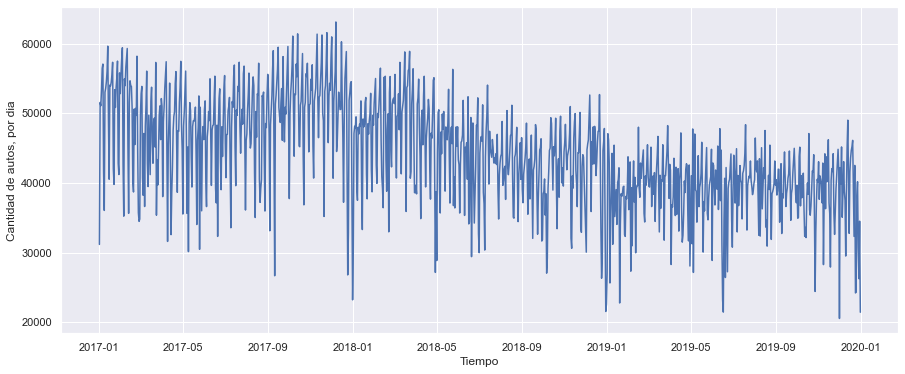

In [122]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [123]:
import statsmodels

from statsmodels.tsa.stattools import coint, adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

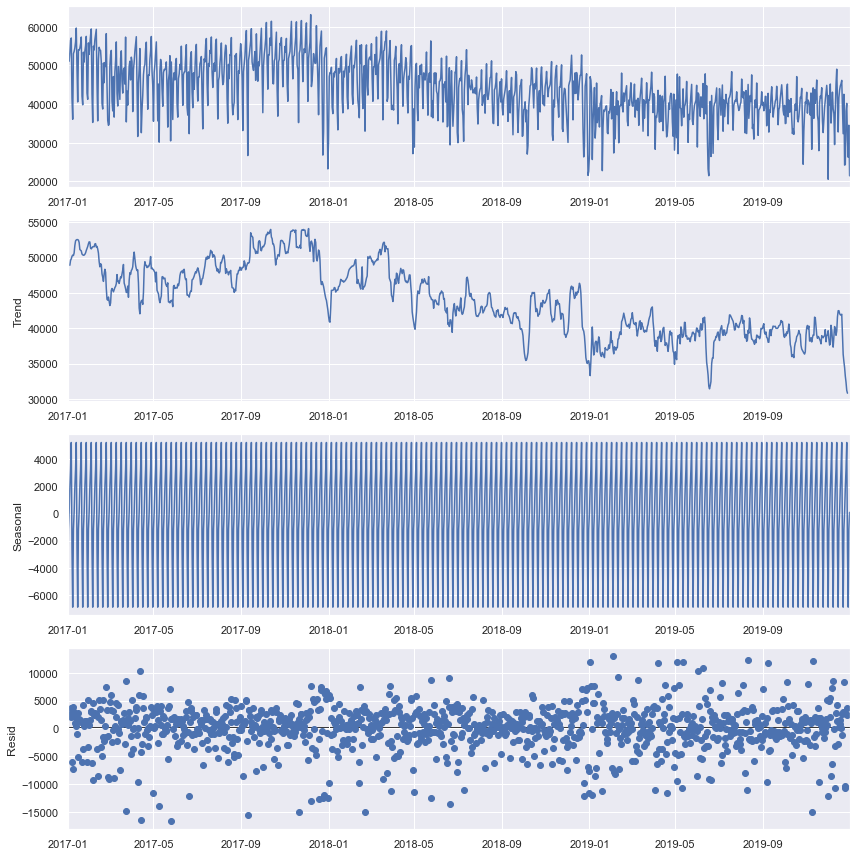

In [124]:
result = seasonal_decompose(diario, model = "additive") 
fig = result.plot()
plt.savefig('seasonal_decompose.png')
plt.show()

Probar la estacionariedad

In [125]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(diario.cantidad_pasos)
print('Augmented Dickey-Fuller Test:')
labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

for value,label in zip(result,labels):
    print(label+' : '+str(value) )
    
if result[1] <= 0.05:
    print("Fuerte evidencia contra la hipótesis nula, rechazar la hipótesis nula. Los datos no tienen raíz unitaria y son estacionarios")
else:
    print("evidencia débil contra hipótesis nula, la serie temporal tiene una raíz unitaria, lo que indica que no es estacionaria  ")

Augmented Dickey-Fuller Test:
ADF Test Statistic : -1.6433053805807025
p-value : 0.4605341622128796
#Lags Used : 20
Number of Observations Used : 1074
evidencia débil contra hipótesis nula, la serie temporal tiene una raíz unitaria, lo que indica que no es estacionaria  


La serie temporal no es estacionaria, por lo tanto, es necesario trasformar la serie a estacionaria, se hace entonces algunas transformaciones individuales y combinadas de diferencias y logaritmo para sacar la estacionariedad.

In [126]:
diario.head()

,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0
2017-01-03,51093.0
2017-01-04,53332.0
2017-01-05,56486.0


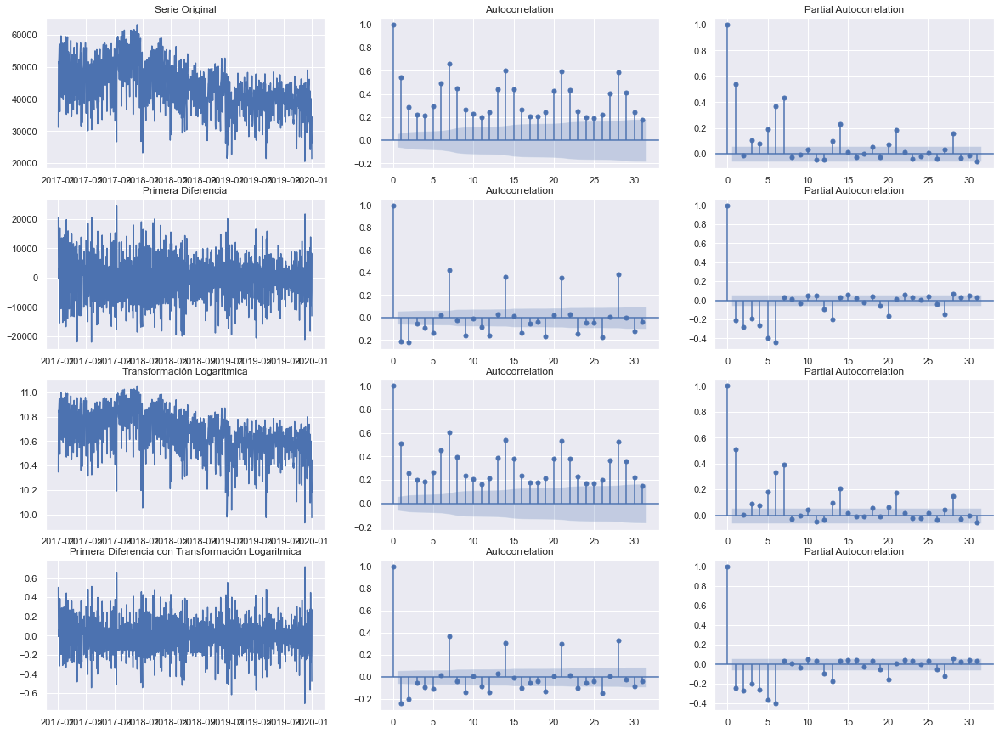

In [128]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, axes = plt.subplots(4,3, figsize=(20,15))
#fig, axes = plt.subplots(3,2, sharex=True)
axes[0, 0].plot(diario); axes[0, 0].set_title('Serie Original')
plot_acf(diario, ax=axes[0, 1])
plot_pacf(diario, ax=axes[0, 2])

axes[1, 0].plot(diario.diff()); axes[1, 0].set_title('Primera Diferencia')
plot_acf(diario.diff().dropna(), ax=axes[1, 1])
plot_pacf(diario.diff().dropna(), ax=axes[1, 2])

axes[2, 0].plot(np.log(diario)); axes[2, 0].set_title('Transformación Logaritmica')
plot_acf(np.log(diario).dropna(), ax=axes[2, 1])
plot_pacf(np.log(diario).dropna(), ax=axes[2, 2])

axes[3, 0].plot(np.log(diario).diff()); axes[3, 0].set_title('Primera Diferencia con Transformación Logaritmica')
plot_acf(np.log(diario).diff().dropna(), ax=axes[3, 1])
plot_pacf(np.log(diario).diff().dropna(), ax=axes[3, 2])

plt.show()


In [129]:
from pmdarima.arima.utils import ndiffs
print(ndiffs(diario, test='adf')) #diferencia

0


In [130]:
#diffdiariom = diariom.diff()
#print(ndiffs(diariom[1:], test='adf'))

In [131]:
logdiario = np.log(diario)
print(ndiffs(logdiario[1:], test='adf'))#logaritmo

0


## Estimar los parametros

In [132]:
!pip install pmdarima
#import lightgbm as lgb
import numpy as np
import pandas as pd

from fbprophet import Prophet
from matplotlib import pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error

import matplotlib.style as style
import zipfile
import json

myfavouritenumber = 13
seed = myfavouritenumber
np.random.seed(seed)

In [133]:
diario.head(2)

,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0


In [134]:
#AUTOARIMA INVESTIGAR
#pm.arima.auto_arima(y=diario, m = 7)

model = auto_arima(diario.cantidad_pasos, trace=True, error_action="ignore", suppress_warnings=True)
model.fit(diario.cantidad_pasos)

forecast = model.predict(n_periods=len(diario.cantidad_pasos))
diario.cantidad_pasos["Forecast_ARIMAX"] = forecast

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=22051.531, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=22513.815, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=22471.302, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=22227.289, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=22511.817, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=22092.048, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=22099.600, Time=0.32 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=21894.537, Time=0.96 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=22092.587, Time=0.49 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=22066.383, Time=0.83 sec
 ARIMA(3,1,4)(0,0,0)[0] intercept   : AIC=21876.089, Time=1.04 sec
 ARIMA(4,1,4)(0,0,0)[0] intercept   :

In [135]:
#ARIMA(p,d,q)

from statsmodels.tsa.arima.model import ARIMA
modeld = ARIMA(diario, order=(6,1,7))
model_fitd = modeld.fit()

C:\Users\Camilo\miniconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals


In [136]:
print(model_fitd.summary())

                               SARIMAX Results                                
Dep. Variable:         cantidad_pasos   No. Observations:                 1095
Model:                 ARIMA(6, 1, 7)   Log Likelihood              -10819.342
Date:                Wed, 23 Jun 2021   AIC                          21666.684
Time:                        14:08:33   BIC                          21736.651
Sample:                    01-01-2017   HQIC                         21693.160
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9841      0.026    -37.290      0.000      -1.036      -0.932
ar.L2         -0.9652      0.013    -75.948      0.000      -0.990      -0.940
ar.L3         -1.0005      0.023    -42.933      0.0

**TODOS LOS PARAMETROS SON SIGNIFICATIVOS!** En el modelo con p=5, d=1, q=5

En el modelo con p=6, d=1 y q=7 hay dos parametros que no son significativos, que son el ma.L2 y ma.L6; lo cual debilita al modelo como el posible candidato a ser el mejor.

## Residuos y Ruido Blanco

CARACTERISTICAS DE RUIDO BLANCO: 

1.RESIDUO CON MEDIA CERO Y VARIANZA CONSTANTE, 2. EL HISTOGRAMA DEBE SER NORMAL QUE LOS ERRORES SE DISTRIBUYA NORMAL, 4. QUE NINGUN RETARDO SEA SIGNIFICATIVO, 3. LOS PUNTOS DEBEN AJUSTARSE A LA RECTA, para que se ajuste a una distribución normal. 

Yo quiero Ruido Blanco para los residuos, para que no sean pronosticables.
Si los residuos no son Ruido blanco, significa que los residuos tienen un patrón que permite estimarlo, es malo.

#No quiero Ruido Blanco para la serie de tiempo que quiero pronosticas y que el error sea aleatorio.

Aún así los parametros sea significativo y las metricas sea el mejor, si los residuos no son ruido blanco, el modelo no va a ser bueno.

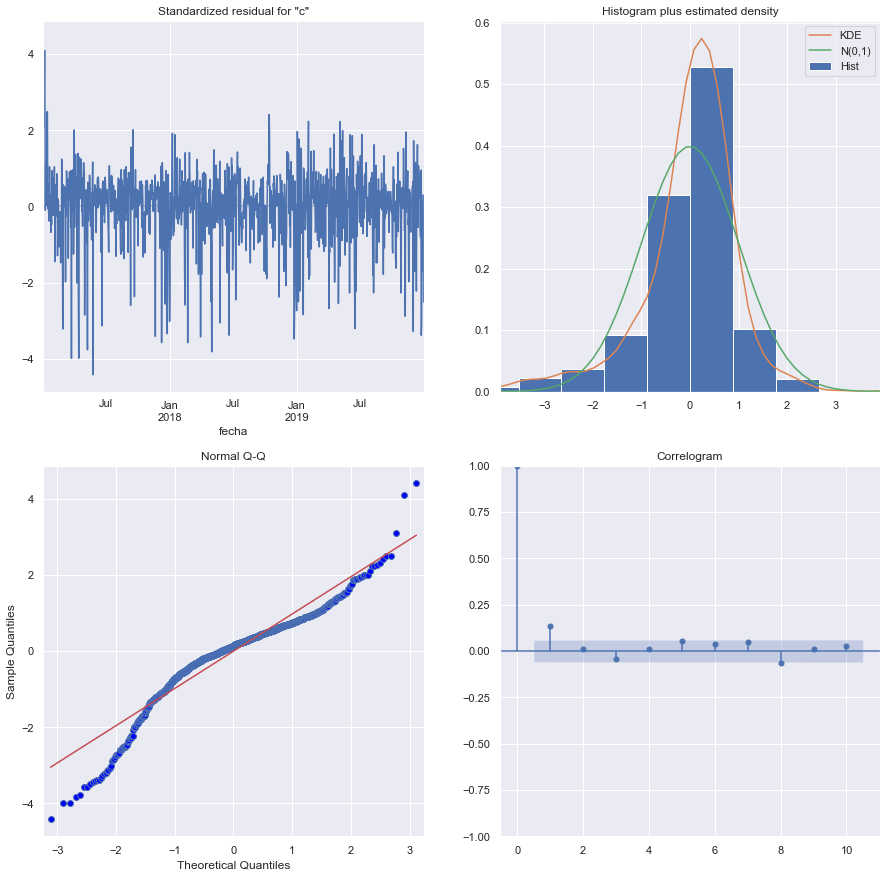

In [137]:
model_fitd.plot_diagnostics(figsize=(15, 15))
plt.show()

NO ES RUIDO BLANCO PORQUE NO CUMPLE CON LAS CARACTERISTICAS

La autocorrelación en la serie original y el la transformación logaritmica, baja lentamente pero no llega a tocar el intervalo de confianza por lo que no es posible concluir si no hay proceso estacional con esta forma. 
Si es estacional, las transformación logaritmica y la serie original no ayudan a su interpretación ya que no hya proceso estacional. 

En el cuadro "Standardize residual for 'c'" la gráfica oscila en cero como se puede observar pero se nota que **la varianza no es constante** por lo que no tiende a cero; En el histograma, se puede ver que los errores no se distribuyen normal. Por lo tanto, en el gráfico Normal Q-Q, los errores no se ajustan a la recta y por otro lado, ninguno de los lags del correlogram de los residuos es relevante, ningún retardo se sale del intervalo de confianza.

Por lo tanto, los errores de este modelo no son buenos.

Modelo SARIMA

In [138]:
# Import the library 
from pmdarima import auto_arima 
  
# Ignore harmless warnings 
import warnings 
warnings.filterwarnings("ignore") 
  
# Fit auto_arima function   
stepwise_fit = auto_arima(diario.cantidad_pasos.dropna(inplace=False),start_p = 1, start_q = 1, 
                          max_p = 3, max_q = 3, m = 12, 
                          start_P = 0, seasonal = True, 
                          d = None, D = 1,  
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True) 

In [139]:
# To print the summary 
stepwise_fit.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                 1095
Model:             SARIMAX(3, 0, 0)x(2, 1, [1, 2], 12)   Log Likelihood              -11060.558
Date:                                 Wed, 23 Jun 2021   AIC                          22139.117
Time:                                         14:18:35   BIC                          22184.004
Sample:                                              0   HQIC                         22156.111
                                                - 1095                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     20.3562     51.754      0.393      0.694     -81.080     121.792
ar.L1          0.4944      0.045     11.017      0.000       0.406       0.582
ar.L2         -0.0543      0.056     -0.972      0.331      -0.164       0.055
ar.L3          0.1551      0.048      3.233      0.001       0.061       0.249
ar.S.L12      -0.2681      0.272     -0.986      0.324      -0.801       0.265
ar.S.L24      -0.1863      0.056     -3.318      0.001      -0.296      -0.076
ma.S.L12      -0.7445      0.278     -2.675      0.007      -1.290      -0.199
ma.S.L24      -0.1158      0.257     -0.450      0.652      -0.620       0.388
sigma2      6.344e+07      0.000   2.53e+11      0.000    6.34e+07    6.34e+07
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                31.02
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.52   Skew:                            -0.39
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.25e+26. Standard errors may be unstable.
"""

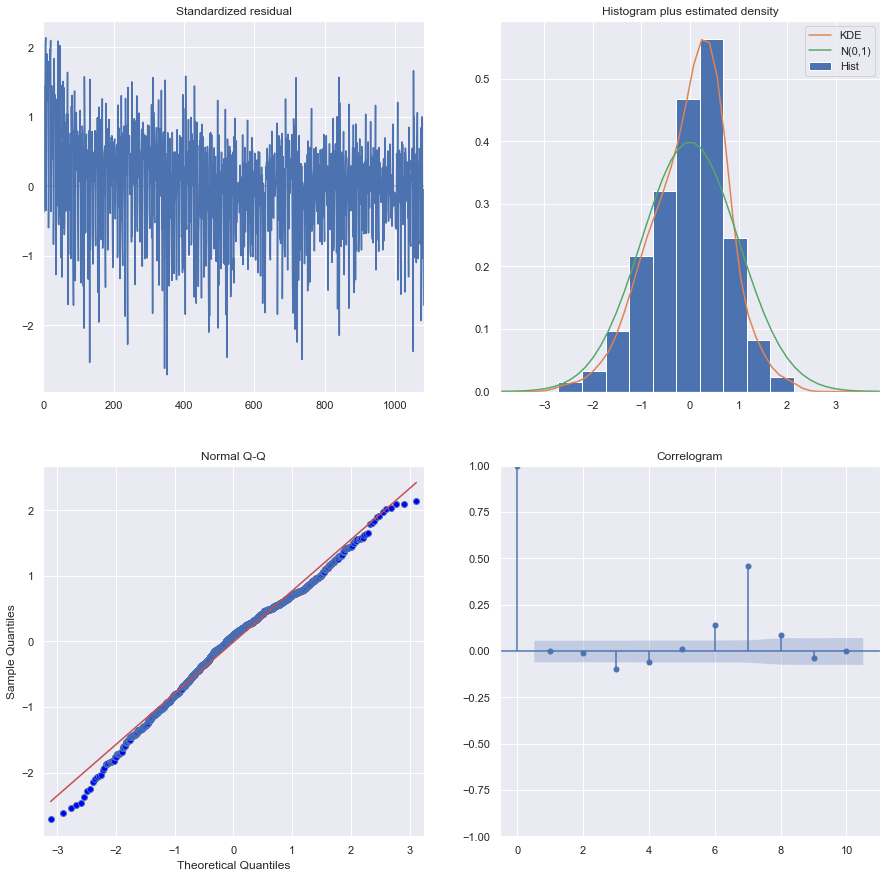

In [140]:
stepwise_fit.plot_diagnostics(figsize=(15, 15))
plt.show()

Apesar de que de que el residuo tiene media cero, la varianza nos es constante. Además, los residuos aunque se parecen a una distribución normal, se evidencia que no es igual a la ideal. Podemos ver que en el tercer cuadro, abajo a la izquierda, los puntos se ajustan levemente a la recta salvo la parte inferior  y finalmente, vemos que el retardo número 7 es significativo. Por lo tanto, los residuos no son enteramente ruido blanco y el modelo no es el ideal.


## Realizar pronostico

In [141]:
diario.shape

(1095, 1)

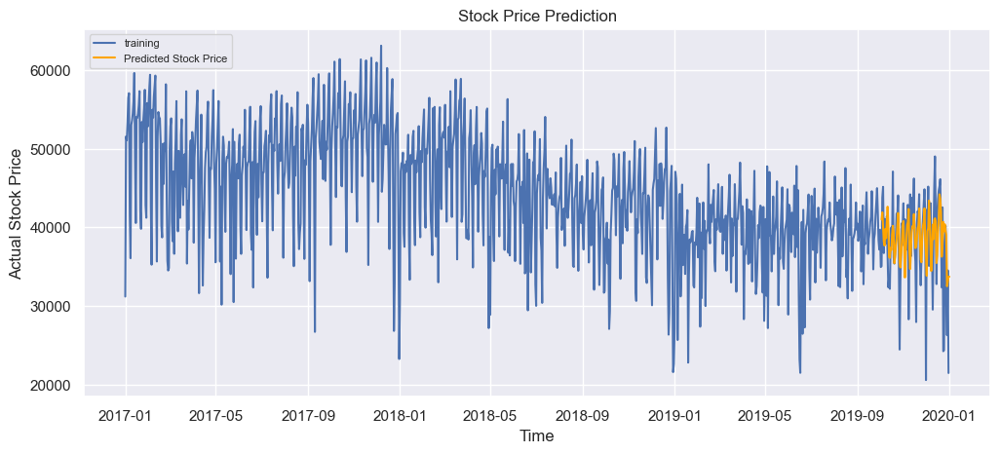

In [142]:
#model_fit.forecast(steps=100) OUTSAMPLE
fc = model_fitd.predict(start=1005,end=1095)  # 95% confidence INSAMPLE
fc_series = pd.Series(fc)
plt.figure(figsize=(12,5), dpi=100)
plt.plot(diario , label='training')
# plt.plot(test, color = 'blue', label='Actual Stock Price')
plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
# plt.fill_between(lower_series.index, lower_series, upper_series, 
#                  color='k', alpha=.10)
plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Actual Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [143]:
# report performance
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
test_data = diario.cantidad_pasos[1004:1095] 

mse = mean_squared_error(test_data, fc)
print('MSE: '+str(mse))
mae = mean_absolute_error(test_data, fc)
print('MAE: '+str(mae))
#rmse = math.sqrt(mean_squared_error(test_data, fc))
#print('RMSE: '+str(rmse))
mape = np.mean(np.abs(fc - test_data)/np.abs(test_data))
print('MAPE: '+str(mape))

MSE: 24601605.49695778
MAE: 3557.623656721714
MAPE: 0.11672246017795224


In [147]:
from sklearn import metrics

In [148]:
from sklearn.metrics import r2_score

print('RMSE:', np.sqrt(metrics.mean_squared_error(test_data, fc)))

RMSE: 4960.000554128777


In [149]:
from sklearn.metrics import r2_score
print('Arimax')
print('R2 :', r2_score(test_data, fc))

Arimax
R2 : 0.2677601975793169


**SARIMA**

In [150]:
# Ignore harmless warnings 
import warnings 
warnings.filterwarnings("ignore")

In [151]:
diario.dropna(inplace=True)

In [152]:
# Split data into train / test sets 
train = diario.iloc[:len(diario.cantidad_pasos)-90] 
test = diario.iloc[len(diario.cantidad_pasos)-90:] # 3 meses para el testeo 

from statsmodels.tsa.statespace.sarimax import SARIMAX 

modelS = SARIMAX(train['cantidad_pasos'], 
				order=(3,0,0), 
				seasonal_order=(2,1,[1,2],12),   
				trend='c'			
				) 

resultS = modelS.fit() 
resultS.summary() 
start = len(train) 
end = len(train) + len(test) - 1

# Predictions for one-year against the test set 
predictions = resultS.predict(start, end, 
							typ = 'levels').rename("Predictions") 


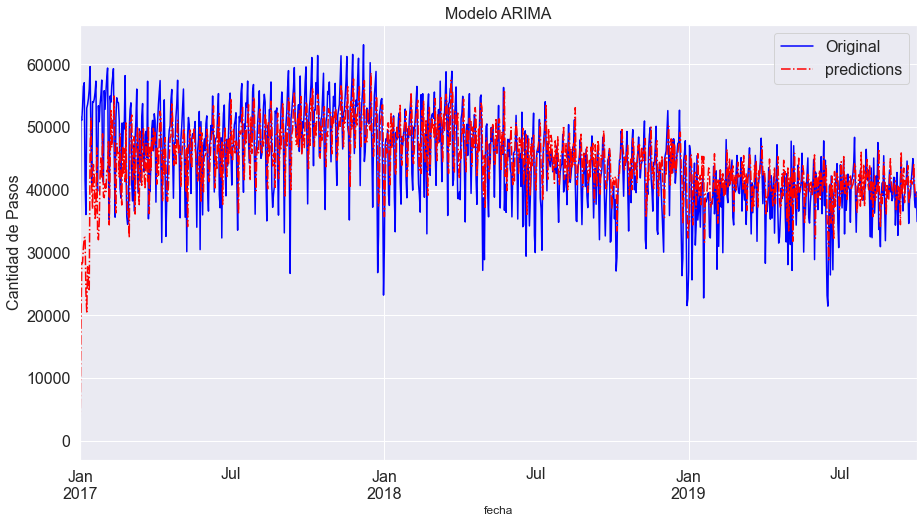

In [153]:
# plot predictions and actual values 
train['cantidad_pasos'].plot(label='Original', color='blue', fontsize=16) 
resultS.fittedvalues.plot( label='predictions', color='red', fontsize=16, ls='-.', figsize=(15,8))
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo ARIMA", fontsize=16)
plt.legend(loc=1, prop={'size': 16})
plt.show()

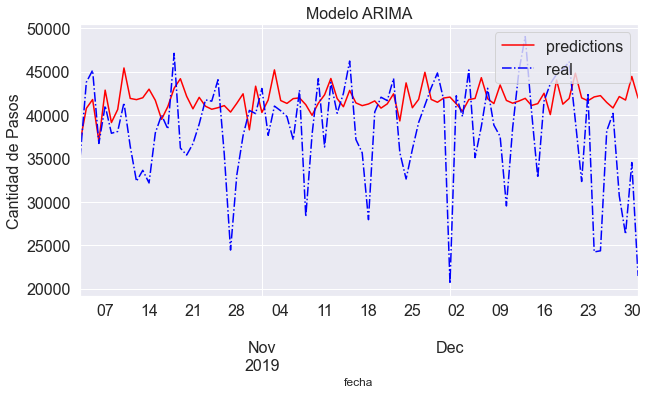

In [154]:
predictions.plot( color ='red', label='predictions', figsize = (10,5), fontsize=16) 
test['cantidad_pasos'].plot(color = 'blue', ls='-.', label='real',fontsize=16) 
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo ARIMA", fontsize=16)
plt.legend(loc=1, prop={'size': 16})
plt.show()

In [155]:
print('MAE:', metrics.mean_absolute_error(test['cantidad_pasos'], predictions))
print('MSE:', metrics.mean_squared_error(test['cantidad_pasos'], predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['cantidad_pasos'], predictions)))

MAE: 4981.545787396394
MSE: 47301263.380655125
RMSE: 6877.5913938424055


In [156]:
mape = np.mean(np.abs(predictions - test['cantidad_pasos'])/np.abs(test['cantidad_pasos']))
print('MAPE: '+str(mape))

MAPE: 0.15704420219133614


In [157]:
from sklearn.metrics import r2_score
print('Sarimax')
print('R2 :', r2_score(test['cantidad_pasos'],predictions))

Sarimax
R2 : -0.3972343914892469


## Resultados Modelos ARIMA y SARIMA

Podemos observar que ninguno de los dos modelos pudo ajustarse a la serie de tiempo, no pudo ajustarse a los picos y su predicción no es la mejor.

## Machine Learning

RESAMPLEO SUM

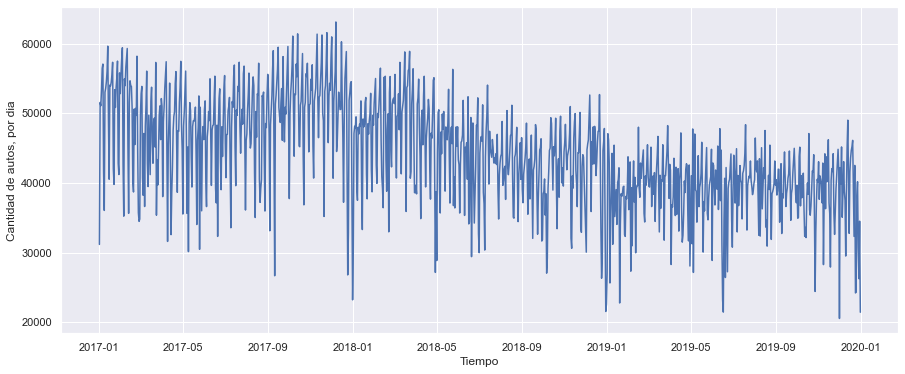

In [158]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [159]:
diario.head()

,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0
2017-01-03,51093.0
2017-01-04,53332.0
2017-01-05,56486.0


In [160]:
from statsmodels.tsa.stattools import acf

nlags =  1094
autocorr = acf(diario.cantidad_pasos, nlags = nlags)

In [161]:
autocorr.shape

(1095,)

Text(0.5, 0, 'lag')

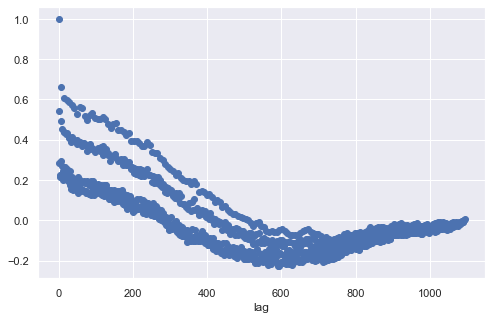

In [162]:
plt.figure(figsize = (8,5))
plt.scatter(np.arange(nlags+1), autocorr)
plt.xlabel('lag')

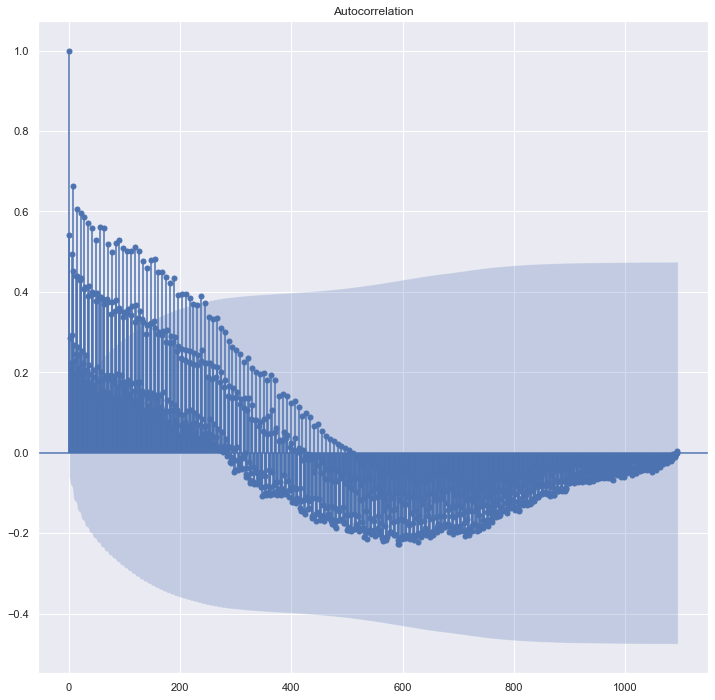

In [163]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(diario.cantidad_pasos, lags = 1094)
plt.show()

**ONE SEP PREDICTION**

In [164]:
senial = diario.cantidad_pasos
senial.head()

fecha
2017-01-01    31183.0
2017-01-02    51568.0
2017-01-03    51093.0
2017-01-04    53332.0
2017-01-05    56486.0
Freq: D, Name: cantidad_pasos, dtype: float64

In [165]:
G = senial.shape
print(G)

(1095,)


In [166]:
look_back = 100 #int(1095/3) # usamos 6 meses de datos para predecir el valor siguiente

In [167]:
N = senial.shape[0]
X = np.zeros((N - look_back - 1,look_back))
y = np.zeros(N - look_back - 1)
print(X.shape, y.shape)

(994, 100) (994,)


In [168]:
for i in range(X.shape[0]):
#     X[i,:] = senial.values.iloc[i:i+look_back]
#     y[i] = senial.values.iloc[i+look_back]
    X[i,:] = senial.iloc[i:i+look_back]
    y[i] = senial.iloc[i+look_back]

In [169]:
print(X)

[[31183. 51568. 51093. ... 44409. 31615. 45346.]
 [51568. 51093. 53332. ... 31615. 45346. 49017.]
 [51093. 53332. 56486. ... 45346. 49017. 54351.]
 ...
 [41326. 44596. 40820. ... 24349. 38168. 40182.]
 [44596. 40820. 34646. ... 38168. 40182. 30681.]
 [40820. 34646. 38523. ... 40182. 30681. 26259.]]


In [170]:
print(y)

[49017.   54351.   42650.   32588.   38688.   42272.   47573.   49557.
 50244.   54288.   56002.   45893.   38668.   47529.   47420.   51580.
 53686.   57473.   48393.   44865.   35547.   48208.   50211.   53313.
 56077.   46876.   35643.   45178.   30152.   48562.   51543.   50388.
 43826.   39423.   48099.   48938.   48873.   49381.   50899.   44007.
 34043.   46186.   47902.   52506.   30479.   50885.   43087.   36009.
 46552.   48109.   46234.   50576.   51795.   40054.   36617.   46609.
 47788.   50266.   48962.   54965.   46901.   39656.   47622.   48274.
 48349.   52191.   55347.   39192.   37147.   48306.   32336.   48103.
 52155.   53526.   43183.   39042.   48073.   43811.   48559.   53626.
 55433.   45628.   40770.   46961.   47005.   50344.   51034.   52293.
 41944.   33578.   47989.   51702.   50870.   55361.   56947.   45283.
 39618.   50486.   49725.   53875.   53213.   57344.   48225.   44288.
 48188.   50589.   48454.   55684.   56792.   46408.   36125.   46097.
 47043

In [171]:
N_train = 1000 - look_back # cantidad de instancias que vamos a usar para entrenar. 
N_test = 90 #cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test] ############OJO RESTE -1!!!!!!!!!!
print(X_test.shape)
print('----------------------------')
print(y_test.shape)
print('----------------------------')
print(N_train, N_test)

(900, 100) (900,)
(90, 100)
----------------------------
(90,)
----------------------------
900 90


**Entrenamos**

In [183]:
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import scipy as sp 

#rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs = 4).fit(X_train,y_train)

In [184]:
rf = RandomForestRegressor()

In [185]:
rs_cv = RandomizedSearchCV(rf, cv=5, n_iter=10, 
                           param_distributions={'max_features': sp.stats.randint(1,50),
                                                'n_estimators': sp.stats.randint(1,50)})

In [186]:
rs_cv.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000014A228AE160>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000014A228AEFA0>})

In [187]:
print('Los mejores Parametros :'+str(rs_cv.best_params_))
print('El mejor Score :'+str(rs_cv.best_score_)+'n')

Los mejores Parametros :{'max_features': 19, 'n_estimators': 49}
El mejor Score :0.3585877042118687n


In [188]:
rf = RandomForestRegressor(n_estimators=38, max_features= 19 ,random_state=42, n_jobs = 4).fit(X_train,y_train)

In [189]:
#from sklearn.metrics import mean_squared_error
#from sklearn.ensemble import RandomForestRegressor

#rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs = 4).fit(X_train,y_train)

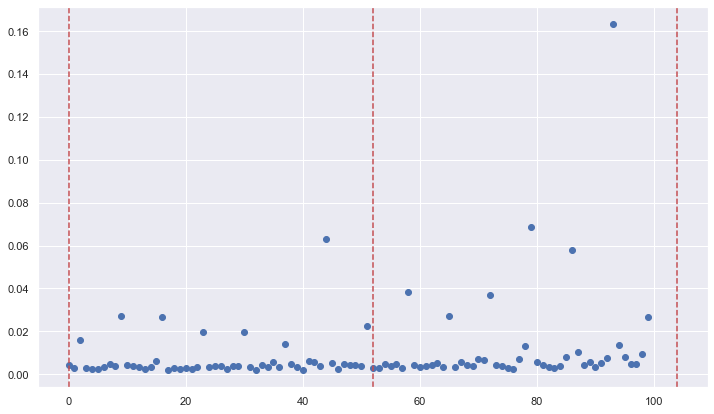

In [190]:
plt.figure(figsize = (12,7))
plt.scatter(np.arange(rf.feature_importances_.size),rf.feature_importances_)
for x in np.arange(3)*52:
         plt.axvline(x, linestyle ='--', color= 'r')
plt.show()

In [191]:
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

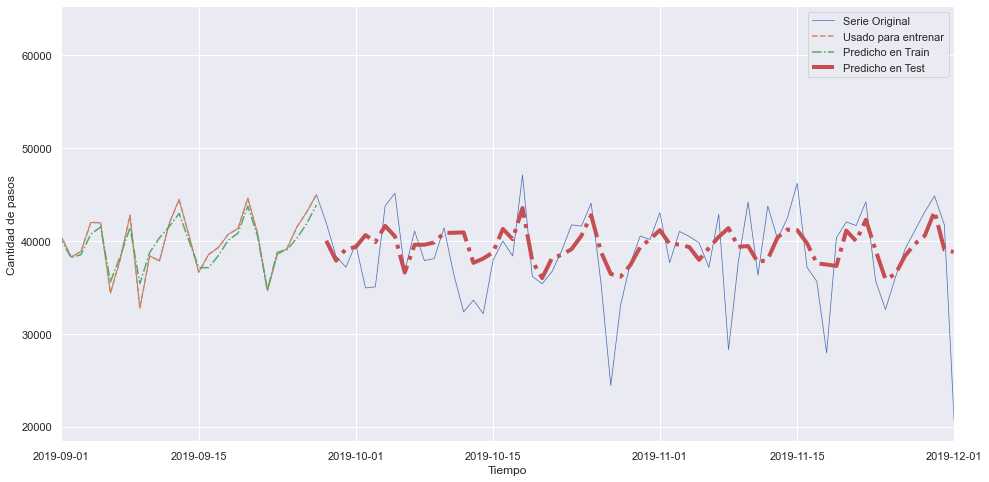

In [192]:

plt.figure(figsize=(16,8))

plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[:N_train + look_back], senial[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(senial.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(senial.index[N_train+look_back: length_total], y_test_pred,'-.', lw = 4, label = 'Predicho en Test')
plt.legend()
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de pasos')
plt.axis(xmax = '2019-12-01'  , xmin = '2019-09-01')
plt.show()

Grafico Zoom

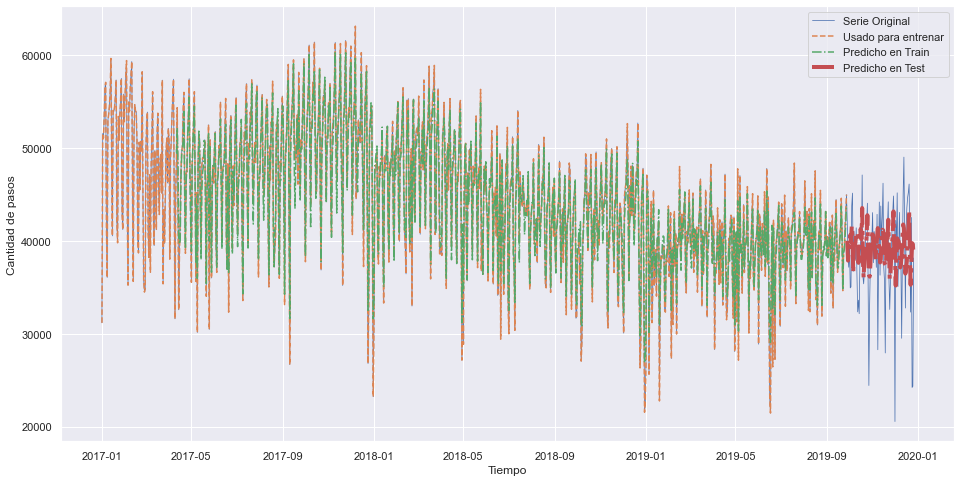

In [193]:
plt.figure(figsize=(16,8))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[:N_train + look_back], senial[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(senial.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(senial.index[N_train+look_back: length_total], y_test_pred,'-.', lw = 4, label = 'Predicho en Test')
plt.legend()
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de pasos')
plt.show()

In [194]:
MSE = mean_squared_error(y_train, y_train_pred)
print('Error en Train:',np.sqrt(MSE))

MSE = mean_squared_error(y_test, y_test_pred)
print('Error en Test:',np.sqrt(MSE))

Error en Train: 1815.845619144857
Error en Test: 4847.624247255251


In [195]:
print('MAE:', metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

MAE: 3364.2119152046785
MSE: 23499460.842577044
RMSE: 4847.624247255251


In [196]:
mape = np.mean(np.abs(y_test_pred - y_test)/np.abs(y_test))
print('MAPE: '+str(mape))

MAPE: 0.1009289134397147


In [197]:

print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_test_pred))

0.9374795356331946
0.17364133739564558


Los errores de entrenamiento y testeo se alejan considerablemente, por lo que se sugiere que el modelo entrenado tiene bajo rendimiento, el modelo no generaliza.

In [198]:
y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]

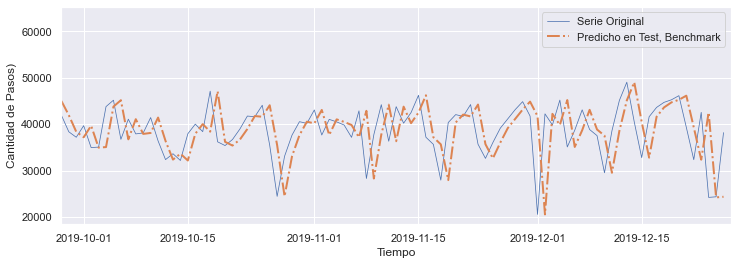

In [199]:
plt.figure(figsize=(12,4))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[N_train+look_back: length_total], y_test_pred_benchmark,'-.', lw = 2, label = 'Predicho en Test, Benchmark')
plt.xlim(senial.index[N_train+look_back], senial.index[length_total])
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de Pasos)')
plt.legend()
plt.show()

In [200]:
y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]
MSE = mean_squared_error(y_test, y[-1 + N_train:N_train+N_test - 1])
print(np.sqrt(MSE))

6755.675491351287




### 2.2. Multi-Step Prediction



In [201]:
y_ms_test_pred = []
x = X_test[0,:] # arrancamos con la primera instancias del conjunto de test
for i in range(y_test.size):
    y_os_pred = rf.predict(x.reshape(1,-1))
    y_ms_test_pred.append(y_os_pred)
    x = np.append(x[1:], y_os_pred)
y_ms_test_pred = np.array(y_ms_test_pred)

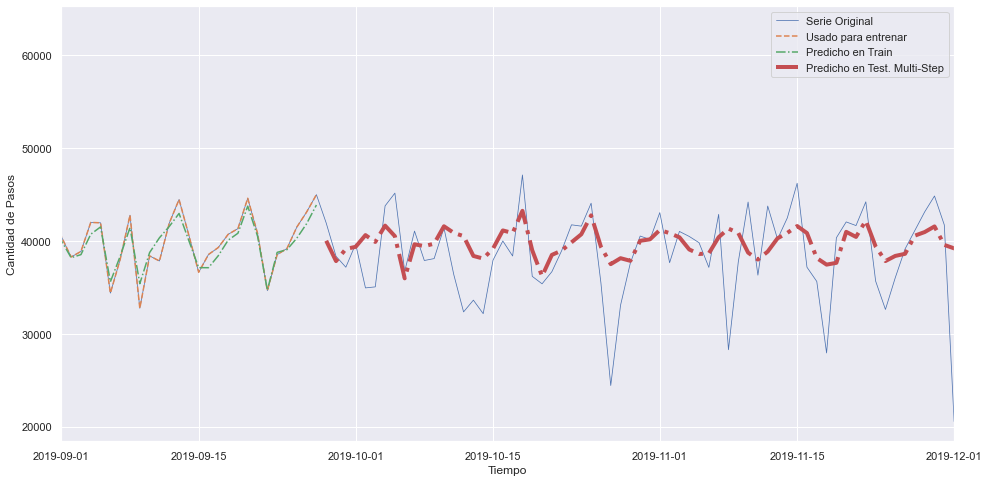

In [375]:
plt.figure(figsize=(16,8))
plt.plot(senial.index[:length_total], senial[:length_total],lw = 0.75, label = 'Serie Original')
plt.plot(senial.index[:N_train + look_back], senial[:N_train + look_back],'--', label = 'Usado para entrenar')
plt.plot(senial.index[look_back: look_back + N_train], y_train_pred,'-.',label = 'Predicho en Train')
plt.plot(senial.index[N_train+look_back: length_total], y_ms_test_pred,'-.', lw = 4, label = 'Predicho en Test. Multi-Step')
plt.legend()
plt.axis(xmax = '2019-12-01'  , xmin = '2019-09-01')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de Pasos')
plt.savefig('ModeloML.png')
plt.show()

In [203]:

print(r2_score(y_train,y_train_pred))
print(r2_score(y_test,y_ms_test_pred))

0.9374795356331946
0.11718861406350523


In [204]:
print('MAE:', metrics.mean_absolute_error(y_test,y_ms_test_pred))
print('MSE:', metrics.mean_squared_error(y_test,y_ms_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test,y_ms_test_pred)))

MAE: 3535.709429824562
MSE: 25104827.400022604
RMSE: 5010.471774196778


In [205]:
mape = np.mean(np.abs(y_ms_test_pred - y_test)/np.abs(y_test))
print('MAPE: '+str(mape))

MAPE: 0.12276251101407643


In [206]:
#y_test_pred_benchmark = y[-1 + N_train:N_train+N_test - 1]
MSE = mean_squared_error(y_ms_test_pred, y[-1 + N_train:N_train+N_test - 1])
print(np.sqrt(MSE))

5263.258242608392


## Modelo XGboost

In [207]:
import xgboost as xgb
import scipy as sp 
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor
model_boost = XGBRegressor()
param = {'n_estimators':sp.stats.randint(1, 15),'max_depth':sp.stats.randint(1, 15)}
xgboostre = RandomizedSearchCV(model_boost, param,n_iter=100, random_state=0, cv=5)
xgboostre.fit(X_train,y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          random_state=None, reg_alpha=None,
                                          reg_lambda=None,
                                          scale_pos_we

In [208]:
print("Mejores parametros: "+str(xgboostre.best_params_))
print("Mejor Score: "+str(xgboostre.best_score_)+'\n')

Mejores parametros: {'max_depth': 1, 'n_estimators': 11}
Mejor Score: 0.2719071553684892



**RESULTADOS DE MODELOR MACHINE LEARNING**
Como se pudo evidenciar, ninguna de las estrategias de los modelos con Machine learning pudo modelar correctamente la serie de tiempo, se puede observar a traves de los gráficos que la predicción no se acopla a la variación de los modelos. Y complementando con la metrica del R cuadrado, con Random Foreste el entrenamiento fue exitoso, con los datos de testeo le fue pesimo, por lo que se concluye que el modelo de Random Forest no generaliza bien para esta serie de tiempo.


## 3. Prophet


**Modelo con Festivos**

In [209]:
import logging
logging.getLogger('fbprophet').setLevel(logging.ERROR)

In [210]:
pip install pystan==2.19.1.1

Note: you may need to restart the kernel to use updated packages.


In [211]:
pip install prophet

Note: you may need to restart the kernel to use updated packages.


In [213]:
import pandas as pd
from prophet import Prophet
import fbprophet
import holidays
Prophet = fbprophet.Prophet

In [214]:
#Resampleamos SUMA nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


<Figure size 1080x720 with 0 Axes>

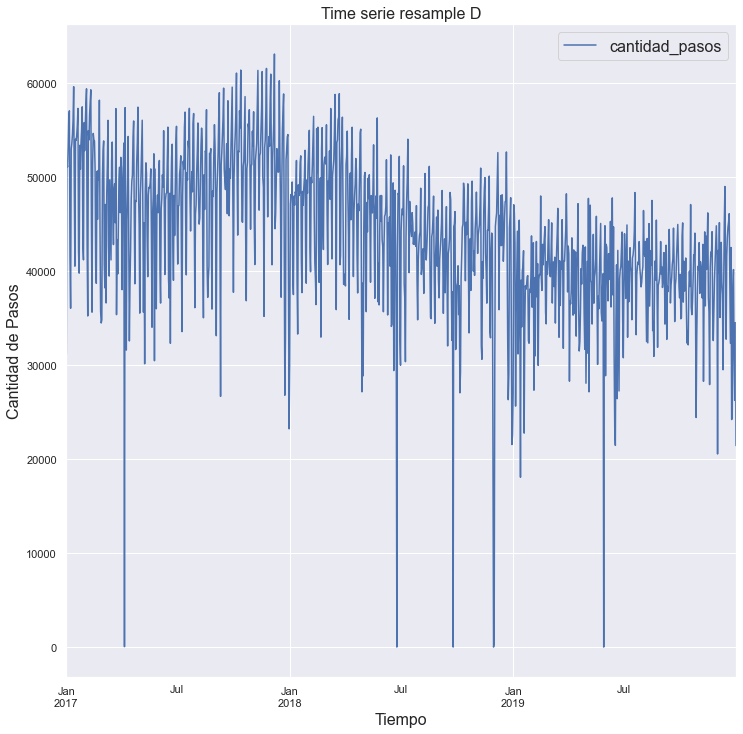

In [215]:
plt.figure(figsize=(15,10))
diario.plot()
plt.title('Time serie resample D',fontsize=16)
plt.xlabel('Tiempo',fontsize=16)
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.legend(loc=1, prop={'size': 16})
plt.show()

In [216]:
diario.head()

,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


In [217]:
senial.head()

fecha
2017-01-01    31183.0
2017-01-02    51568.0
2017-01-03    51093.0
2017-01-04    53332.0
2017-01-05    56486.0
Freq: D, Name: cantidad_pasos, dtype: float64

In [218]:
df = pd.DataFrame((senial.items()), columns = ["ds","y"])
df.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


In [219]:
holidays_df = pd.DataFrame([], columns = ['ds','holiday'])

In [220]:
ldates = []
lnames = []
for date, name in sorted(holidays.AR( years=np.arange(2017, 2019 + 1)).items()):
    ldates.append(date)
    lnames.append(name)

In [221]:
ldates = np.array(ldates)
lnames = np.array(lnames)

In [222]:
holidays_df.loc[:,'ds'] = ldates

In [223]:
holidays_df.loc[:,'holiday'] = lnames

In [224]:
holidays_df.holiday.unique()

array(["Año Nuevo [New Year's Day]", "Día de Carnaval [Carnival's Day]",
       "Día Nacional de la Memoria por la Verdad y la Justicia [Memory's National Day for the Truth and Justice]",
       'Día del Veterano y de los Caidos en la Guerra de Malvinas [Veterans Day and the Fallen in the Malvinas War]',
       'Semana Santa (Jueves Santo)  [Holy day (Holy Thursday)]',
       'Semana Santa (Viernes Santo)  [Holy day (Holy Friday)]',
       'Día de Pascuas [Easter Day]', 'Día del Trabajo [Labour Day]',
       'Día de la Revolucion de Mayo [May Revolution Day]',
       'Día Pase a la Inmortalidad del General Martín Miguel de Güemes [Day Pass to the Immortality of General Martín Miguel de Güemes]',
       'Día Pase a la Inmortalidad del General D. Manuel Belgrano [Day Pass to the Immortality of General D. Manuel Belgrano]',
       'Día de la Independencia [Independence Day]',
       'Día Pase a la Inmortalidad del General D. José de San Martin [Day Pass to the Immortality of General D. Jo

In [225]:
holidays_df.loc[:,'holiday'] = holidays_df.loc[:,'holiday'].apply(lambda x : x.replace(' (Observed)',''))

In [226]:
holidays_df.holiday.unique()

array(["Año Nuevo [New Year's Day]", "Día de Carnaval [Carnival's Day]",
       "Día Nacional de la Memoria por la Verdad y la Justicia [Memory's National Day for the Truth and Justice]",
       'Día del Veterano y de los Caidos en la Guerra de Malvinas [Veterans Day and the Fallen in the Malvinas War]',
       'Semana Santa (Jueves Santo)  [Holy day (Holy Thursday)]',
       'Semana Santa (Viernes Santo)  [Holy day (Holy Friday)]',
       'Día de Pascuas [Easter Day]', 'Día del Trabajo [Labour Day]',
       'Día de la Revolucion de Mayo [May Revolution Day]',
       'Día Pase a la Inmortalidad del General Martín Miguel de Güemes [Day Pass to the Immortality of General Martín Miguel de Güemes]',
       'Día Pase a la Inmortalidad del General D. Manuel Belgrano [Day Pass to the Immortality of General D. Manuel Belgrano]',
       'Día de la Independencia [Independence Day]',
       'Día Pase a la Inmortalidad del General D. José de San Martin [Day Pass to the Immortality of General D. Jo

In [227]:
TEST_SIZE = 100
train, test = df.iloc[:-TEST_SIZE], df.iloc[-TEST_SIZE:]  

In [228]:
train

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0
...,...,...
990,2019-09-18,40707.0
991,2019-09-19,41326.0
992,2019-09-20,44596.0
993,2019-09-21,40820.0


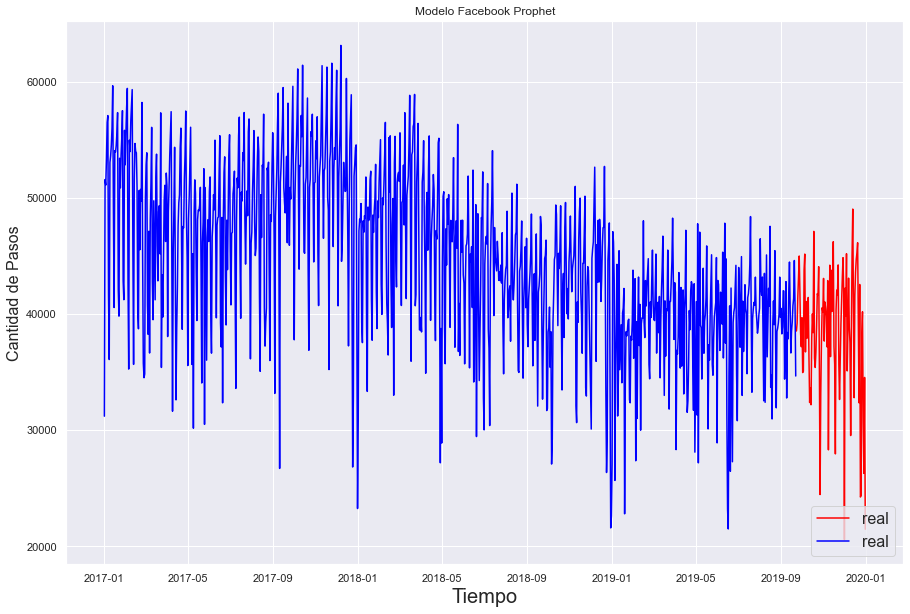

In [229]:
plt.figure(figsize=(15,10))
plt.plot(test.set_index('ds'), color = 'red',  label='real')
plt.plot(train.set_index('ds'), color = 'blue',  label='real')

#plt.plot(forecast[forecast['ds']>=pd.datetime(2018,7,1)].set_index('ds')['yhat'], ls='-.', label='Prophet predictions', color = 'red')
plt.legend(loc="lower right")
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet")
plt.xlabel('Tiempo' ,fontsize=20 )
plt.legend(loc=4, prop={'size': 16})
plt.show()

In [230]:
test

,ds,y
995,2019-09-23,38523.0
996,2019-09-24,39191.0
997,2019-09-25,41486.0
998,2019-09-26,43110.0
999,2019-09-27,44985.0
...,...,...
1090,2019-12-27,40182.0
1091,2019-12-28,30681.0
1092,2019-12-29,26259.0
1093,2019-12-30,34523.0


In [231]:
print(len(train), len(test))

995 100


In [232]:
m = Prophet(holidays=holidays_df, 
                        changepoint_prior_scale = 0.05,
                        n_changepoints = 200,
                         seasonality_mode =  'additive',
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         interval_width=0.95
            )  

In [233]:
m.fit(train)

In [234]:
# Python
future = m.make_future_dataframe(periods=100)
future.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


In [235]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1090,2019-12-27,45306.825233,37474.424222,53466.978356
1091,2019-12-28,36695.597913,28616.965322,44806.197256
1092,2019-12-29,31977.860299,23394.671485,39513.661162
1093,2019-12-30,38208.718913,30401.215222,45663.746173
1094,2019-12-31,39356.973842,31108.071613,47259.107836


En la tabla anterior podemos observar el valor futuro de cada día en la columna "yhat". Y También calcula un intervalo de confiaza con sus bordens en "yhat_lower" como limite inferiror y "yhat_upper" como límite superior.

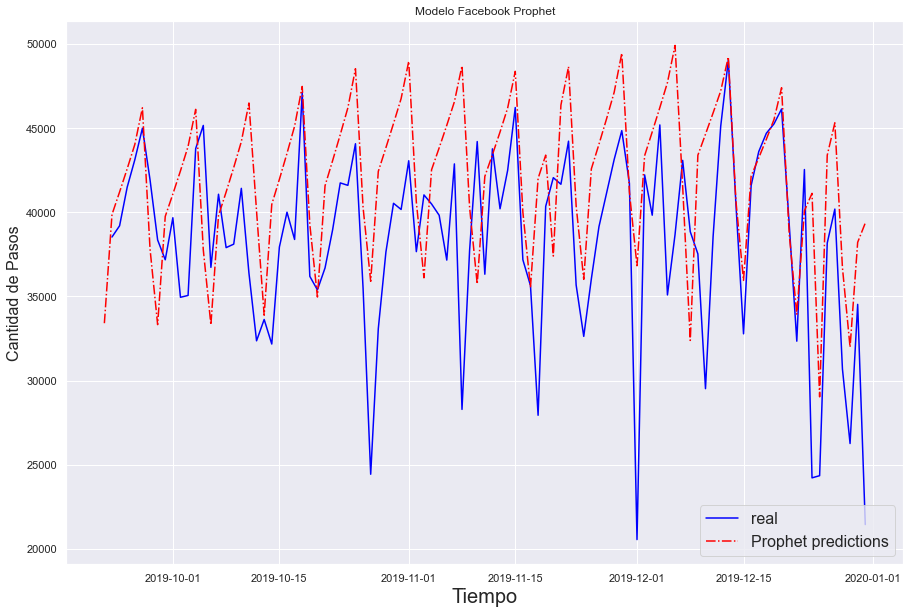

In [236]:
plt.figure(figsize=(15,10))
plt.plot(test.set_index('ds'), color = 'blue',  label='real')
plt.plot(forecast[forecast['ds']>=pd.datetime(2019,9,22)].set_index('ds')['yhat'], ls='-.', label='Prophet predictions', color = 'red')
plt.legend(loc="lower right")
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet")
plt.xlabel('Tiempo' ,fontsize=20 )
plt.legend(loc=4, prop={'size': 16})
plt.savefig('modeloprophet.png')
plt.show()

En la figura anterior se observa la predicción en linea roja punteada y se contrasta con las mediciones reales de la cantidad de pasos en lina azul constante. Se evidencia que la predicción sigue la tendencia pero los valores se alejan de la realidad porque no es capaz de modelar los picos hacia abajo.

In [237]:
from prophet.plot import plot_plotly, plot_components_plotly

In [238]:
plot_plotly(m, forecast)

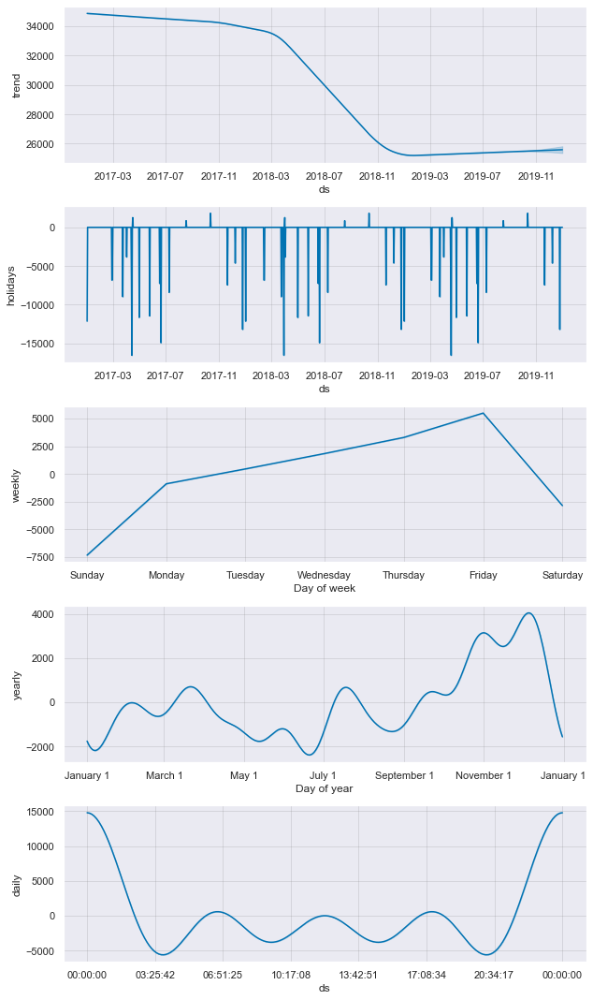

In [239]:
#fig2 = m.plot_components(forecast)
plt.rcParams.update({'font.size': 12})
f = m.plot_components(forecast)
#plt.savefig('forecast.png')
plt.show()

Según la gráfica anterior, los días viernes es donde hay más cantidad de pasos que cualquier otro día de la semana, esto se puede explicar por ser el comienzo del fin de semana. En cuanto a los meses, el mes de diciembre es en donde más cantidad de pasos hay, esto se puede explicar por la temporada de vacaciones en esta temporada y el comienzo del Verano en Argentina.

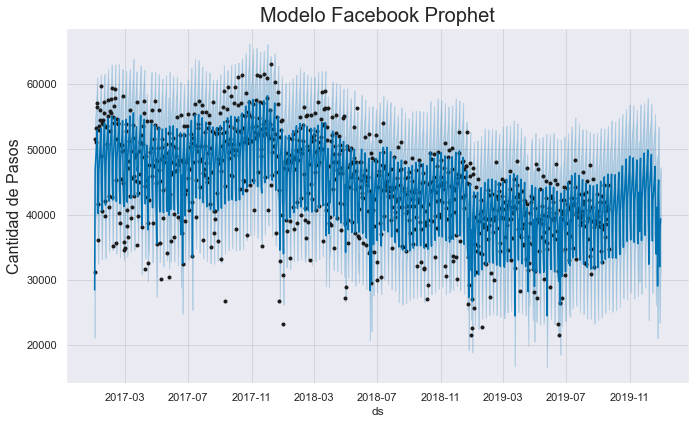

In [240]:
plt.rcParams.update({'font.size': 20})
m.plot(forecast);
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet", fontsize=20)
#plt.savefig('fbpf.png')
plt.show()



In [241]:
#plot_components_plotly(m, forecast)

**Puntos de Inflexión**

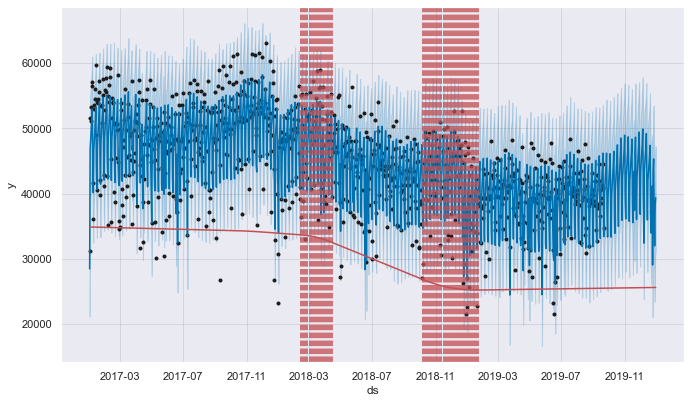

In [242]:
from prophet.plot import add_changepoints_to_plot
fig1 = m.plot(forecast)
a = add_changepoints_to_plot(fig1.gca(), m, forecast)

Punto de inflexión entre marzo del 2018 y nociembre del 2018. ¿Causa?

In [243]:
strt='2019-09-22'
end='2019-12-31'

predic = forecast[(forecast['ds']>strt) & (forecast['ds']<=end)]
print('MAE:', metrics.mean_absolute_error(test['y'],abs(predic ['yhat'])))
print('MSE:', metrics.mean_squared_error(test['y'],abs(predic ['yhat'])))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['y'],abs(predic ['yhat']))))

MAE: 4777.6706577419545
MSE: 39524932.83574247
RMSE: 6286.885781986378


In [244]:
mape = np.mean(np.abs(predic ['yhat'] - test['y'])/np.abs(test['y']))
print('MAPE: '+str(mape))

MAPE: 0.1422501985178837


In [245]:
from sklearn.metrics import r2_score
print('Prophet')
print('R2 :', r2_score(test['y'],abs(predic ['yhat'])))

Prophet
R2 : -0.25351482978519746


In [246]:
from chart_studio.plotly import iplot

In [248]:
import plotly.plotly as py
import plotly.graph_objs as go

ImportError: 
The plotly.plotly module is deprecated,
please install the chart-studio package and use the
chart_studio.plotly module instead. 


In [249]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()


In [250]:
#from _plotly_future_ import v4_subplots NO DA!!!!!

## validación

In [251]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='350 days', period='10 days', horizon = '100 days')

INFO:prophet:Making 55 forecasts with cutoffs between 2017-12-21 00:00:00 and 2019-06-14 00:00:00


In [252]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2017-12-22,59090.225009,52753.647365,64941.471403,58878.0,2017-12-21
1,2017-12-23,48599.271182,42742.079374,54592.001617,43724.0,2017-12-21
2,2017-12-24,42806.101269,36856.379227,48394.619312,26805.0,2017-12-21
3,2017-12-25,52381.064452,46734.645153,57783.092091,32852.0,2017-12-21
4,2017-12-26,52937.686263,46922.217991,59170.572942,51865.0,2017-12-21


In [253]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,10 days,3.012850e+07,5488.943331,3981.993233,0.101995,0.066205,0.101548,0.821818
1,11 days,3.119858e+07,5585.569284,4084.813797,0.104653,0.067825,0.103992,0.818182
2,12 days,3.175992e+07,5635.594216,4150.243260,0.106024,0.070094,0.105416,0.809091
3,13 days,3.202561e+07,5659.117004,4202.600390,0.106703,0.074100,0.106411,0.807273
4,14 days,3.209599e+07,5665.332363,4249.525792,0.107326,0.076513,0.107359,0.803636


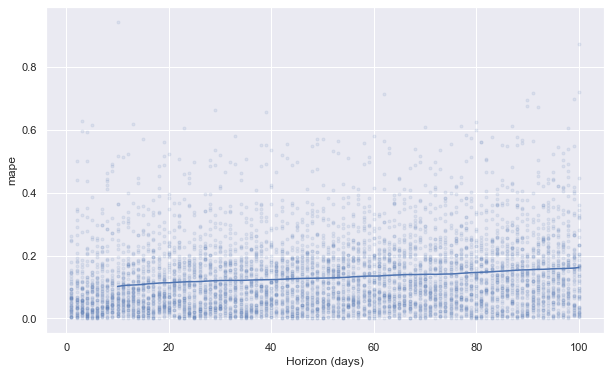

In [254]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [255]:
from sklearn.metrics import r2_score
print('Prophet')
print('R2 :', r2_score(df_cv["y"],df_cv["yhat"]))


Prophet
R2 : -0.15923655202488396


**MODELO SIN FESTIVOS**

In [256]:
modelo = Prophet( 
                        changepoint_prior_scale = 0.05,
                        n_changepoints = 200,
                         seasonality_mode =  'additive',
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         interval_width=0.95)

In [257]:
modelo.fit(train)

In [258]:
futuref = modelo.make_future_dataframe(periods=100)

In [259]:
forecastf = modelo.predict(futuref)
forecastf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1090,2019-12-27,43428.966482,34226.342955,52810.814147
1091,2019-12-28,35095.894030,26466.356109,43655.530902
1092,2019-12-29,30357.578642,21573.078891,39528.612628
1093,2019-12-30,36274.028216,27854.759994,45218.629204
1094,2019-12-31,37402.819265,29050.330956,46535.013275


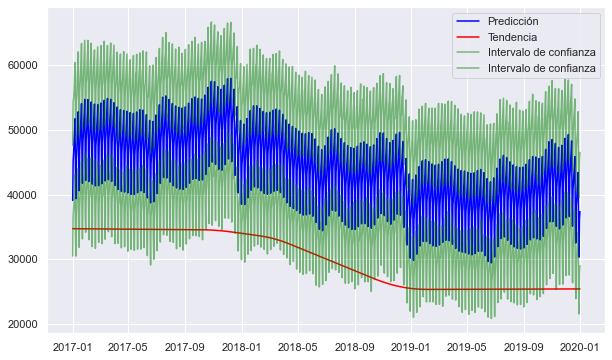

In [260]:
plt.figure(figsize=(10,6))
plt.plot(forecastf.ds,forecastf.yhat, color = 'blue',label = 'Predicción')
plt.plot(forecastf.ds,forecastf.trend, color = 'red', label = 'Tendencia')
plt.plot(forecastf.ds,forecastf.yhat_lower,color = 'green',alpha = 0.5,label = 'Intervalo de confianza')
plt.plot(forecastf.ds,forecastf.yhat_upper, color = 'green',alpha = 0.5, label = 'Intervalo de confianza')
plt.legend()
plt.show()

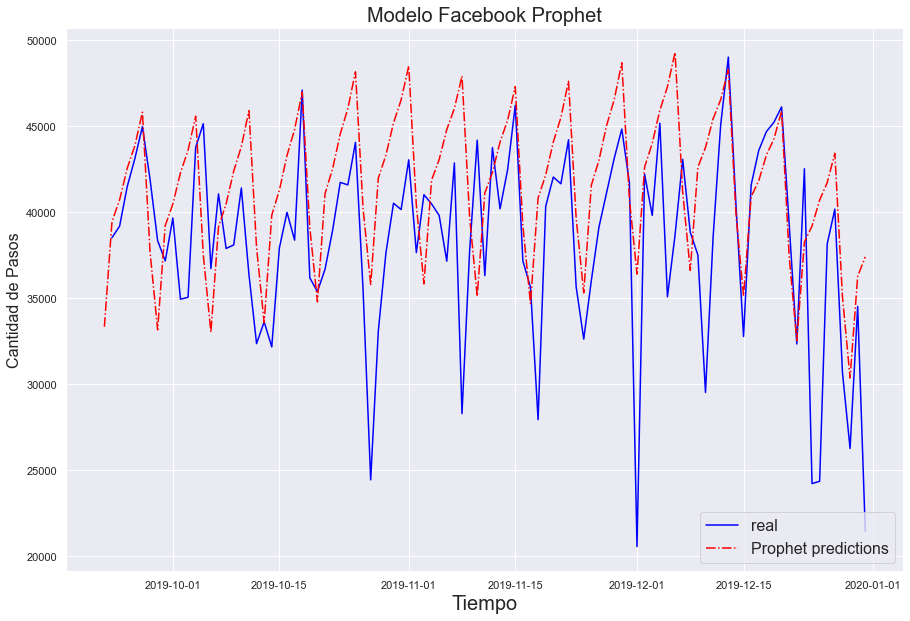

In [261]:
plt.figure(figsize=(15,10))
plt.plot(test.set_index('ds'), color = 'blue',  label='real')
plt.plot(forecastf[forecastf['ds']>=pd.datetime(2019,9,22)].set_index('ds')['yhat'], ls='-.', label='Prophet predictions', color = 'red')
plt.legend(loc="lower right")
plt.xlabel('Tiempo' ,fontsize=20 )
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet", fontsize=20)
plt.xlabel('Tiempo' ,fontsize=20 )
plt.legend(loc=4, prop={'size': 16})
plt.show()

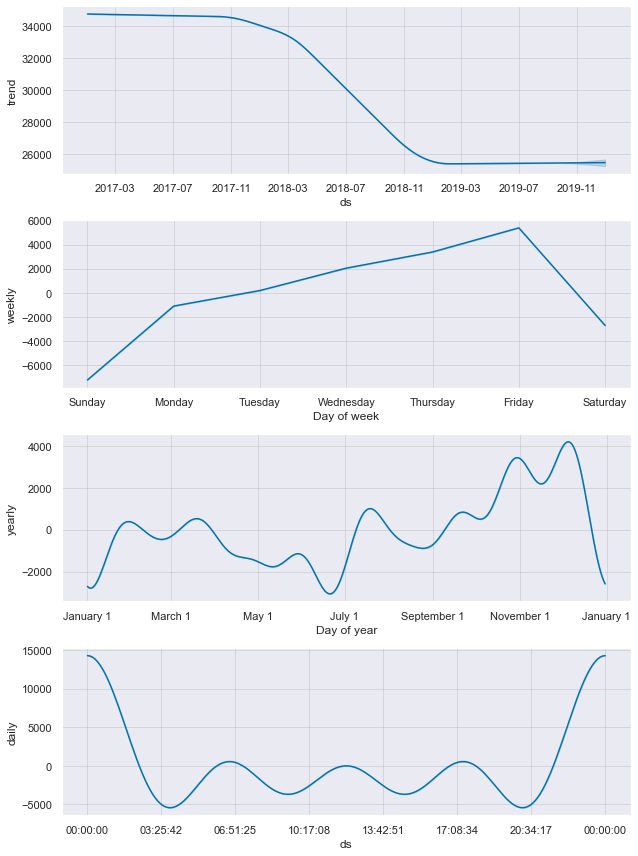

In [262]:
plt.rcParams.update({'font.size': 10})
f = modelo.plot_components(forecastf)
plt.savefig('forecast2.png')
plt.show()

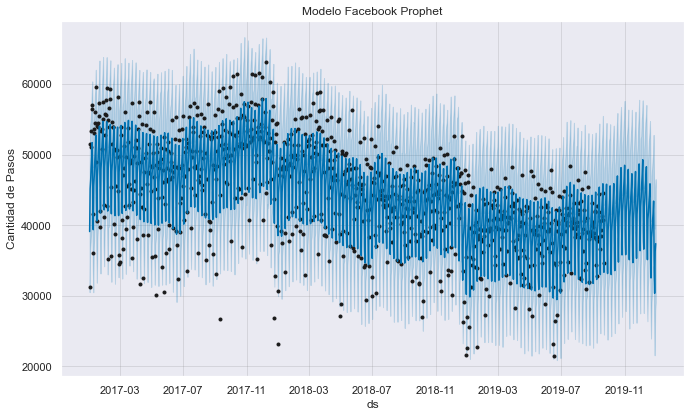

In [263]:
plt.rcParams.update({'font.size': 20})
modelo.plot(forecastf);
plt.ylabel("Cantidad de Pasos")
plt.title("Modelo Facebook Prophet")
plt.savefig('fbpf2.png')
plt.show()

In [264]:
strt='2019-09-22'
end='2019-12-31'

predic = forecastf[(forecastf['ds']>strt) & (forecastf['ds']<=end)]
print('MAE:', metrics.mean_absolute_error(test['y'],abs(predic ['yhat'])))
print('MSE:', metrics.mean_squared_error(test['y'],abs(predic ['yhat'])))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['y'],abs(predic ['yhat']))))

MAE: 4424.105831190032
MSE: 35947219.54075041
RMSE: 5995.600015073588


In [265]:
mape = np.mean(np.abs(predic ['yhat'] - test['y'])/np.abs(test['y']))
print('MAPE: '+str(mape))

MAPE: 0.1332190752006135


In [266]:
from sklearn.metrics import r2_score
print('Prophet')
print('R2 :', r2_score(test['y'],abs(predic ['yhat'])))

Prophet
R2 : -0.14004931953044797


Tabla A: **Cuadro de Resultados de Metricas MSE, MAE Y MAPE**

|Modelo         |   MSE    |  MAE   | MAPE   |  R2  | RMSE |
|:--------------|:--------:|:------:|:------:|:----:|-----:|
|ARIMA(6,1,7)   |23547549.9|3523.99 |0.122116|0.2991|4852.5|
|ARIMA(5,1,5)   |19145490.1|3196.01 |0.116974|0.4301|**4375.5**|
|SARIMA         |34493076.8|4601.94 |0.116974|-0.018|5873.0|
|RandomForest-os|21942432.2|3324.81 |0.098590|0.2283|4684.2|
|RandomForest-ms|23786710.5|3407.70 |0.123032|0.1635|4877.1|  
|Prophet con Fes|39524932.8|4777.67 |0.133219|-0.253|6286.8| 
|Prophet sin Fes|35947219.5|4424.10 |0.101140|-0.140|5995.6| 





Los resultados aquí mostrados no fueron los mejores, quizás con información exógena y agregado otros atributos según el modelo, quizás las evaluaciones habrían mejorado. El mejor modelo según las metricas aquí mostradas ha de ser el modelo ARIMA(5,1,5), además tiene el mejor R cuadrado entre todos los modelos.
Sin duda, la serie de tiempo tiene bastante variabilidad que los modelos aquí propuestos no lograron interpretar. Gráficamente los modelos prophet los picos de la serie, sin embargo, se desfasan con los picos de la parte inferior, por lo que el modelo a la hora de evaluarlo, se castiga de manera considerable por estos datos.

**Preguntas finales**
Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

In [267]:
data_2020 = pd.read_csv('../Proyecto 3/flujo-vehicular-2020.csv', sep =',')
data_2019 = pd.read_csv('../Proyecto 3/flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('../Proyecto 3/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('../Proyecto 3/flujo-vehicular-2017.csv', sep =',')
data_2016 = pd.read_csv('../Proyecto 3/flujo-vehicular-2016.csv', sep =',')
data_2015 = pd.read_csv('../Proyecto 3/flujo-vehicular-2015.csv', sep =',')
data_2014 = pd.read_csv('../Proyecto 3/flujo-vehicular-2014.csv', sep =',')
data_2013 = pd.read_csv('../Proyecto 3/flujo-vehicular-2013.csv', sep =',')
data_2012 = pd.read_csv('../Proyecto 3/flujo-vehicular-2012.csv', sep =',')
data_2011 = pd.read_csv('../Proyecto 3/flujo-vehicular-2011.csv', sep =',')
data_2010 = pd.read_csv('../Proyecto 3/flujo-vehicular-2010.csv', sep =',')
data_2009 = pd.read_csv('../Proyecto 3/flujo-vehicular-2009.csv', sep =',')
#data_2008 = pd.read_csv('../Proyecto 3/flujo-vehicular-2008.csv', sep =',')

In [268]:
data_2017.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


In [269]:
data_2009.head()

,periodo,fecha,hora,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos
0,2009,2009-01-01,6,Jueves,Alberdi,Liviano,NO COBRADO,2
1,2009,2009-01-01,6,Jueves,Alberdi,Liviano,EFECTIVO,21
2,2009,2009-01-01,6,Jueves,Alberdi,Liviano,AUPASS,1
3,2009,2009-01-01,6,Jueves,Alberdi,Pesado,EFECTIVO,1
4,2009,2009-01-01,7,Jueves,Alberdi,Liviano,EXENTO,2


In [270]:
data_2020.head()

,periodo,fecha,mes,dia,dia_fecha,hora_inicio,hora_fin,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos
0,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Centro,24.0
1,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Provincia,80.0
2,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en Infracción,Provincia,1.0
3,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Centro,1.0
4,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Provincia,1.0


Años 2020, desde 2019 al 2016, del 2015 al 2009

In [271]:
datasetW = pd.concat([data_2019, data_2018, data_2017, data_2016])

In [272]:
datasetW.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [273]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
datasetW['fecha2'] = pd.to_datetime(datasetW.fecha) + pd.to_timedelta(datasetW.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
datasetW.drop(columns=['fecha','hora_fin'], inplace = True)

datasetW.head()

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha2
0,2019,0,Martes,Alberti,Centro,Liviano,NO COBRADO,22,2019-01-01 01:00:00
1,2019,0,Martes,Alberti,Centro,Liviano,TELEPASE,6,2019-01-01 01:00:00
2,2019,0,Martes,Alberti,Provincia,Liviano,NO COBRADO,53,2019-01-01 01:00:00
3,2019,0,Martes,Alberti,Provincia,Liviano,TELEPASE,18,2019-01-01 01:00:00
4,2019,0,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16,2019-01-01 01:00:00


In [274]:
#Corregimos el nombre de fecha2 a fecha
datasetW.rename(columns = {'fecha2':'fecha'}, inplace = True) 
datasetW.head()

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2019,0,Martes,Alberti,Centro,Liviano,NO COBRADO,22,2019-01-01 01:00:00
1,2019,0,Martes,Alberti,Centro,Liviano,TELEPASE,6,2019-01-01 01:00:00
2,2019,0,Martes,Alberti,Provincia,Liviano,NO COBRADO,53,2019-01-01 01:00:00
3,2019,0,Martes,Alberti,Provincia,Liviano,TELEPASE,18,2019-01-01 01:00:00
4,2019,0,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16,2019-01-01 01:00:00


In [275]:
#Reordenamos el dataset por fecha
datasetW.sort_values('fecha', inplace = True)
datasetW.reset_index(drop=True, inplace = True)
datasetW.head()

,periodo,hora_inicio,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2016,23,Viernes,Illia,Provincia,Pesado,EFECTIVO,1,2016-01-01
1,2016,23,Viernes,Illia,Centro,Pesado,EXENTO,4,2016-01-01
2,2016,23,Viernes,Illia,Centro,Liviano,AUPASS,195,2016-01-01
3,2016,23,Viernes,Illia,Centro,Liviano,INFRACCION,3,2016-01-01
4,2016,23,Viernes,Illia,Centro,Liviano,TARJETA DISCAPACIDAD,7,2016-01-01


In [276]:
datasetW.drop(columns = ['periodo','hora_inicio'], inplace = True)

In [277]:
datasetW.head()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Viernes,Illia,Provincia,Pesado,EFECTIVO,1,2016-01-01
1,Viernes,Illia,Centro,Pesado,EXENTO,4,2016-01-01
2,Viernes,Illia,Centro,Liviano,AUPASS,195,2016-01-01
3,Viernes,Illia,Centro,Liviano,INFRACCION,3,2016-01-01
4,Viernes,Illia,Centro,Liviano,TARJETA DISCAPACIDAD,7,2016-01-01


In [278]:
datasetW.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4940149 entries, 0 to 4940148
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   dia             object        
 1   estacion        object        
 2   sentido         object        
 3   tipo_vehiculo   object        
 4   forma_pago      object        
 5   cantidad_pasos  int64         
 6   fecha           datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 263.8+ MB


Dataset desde 2015 hasta el 2009

In [279]:
datasetZ = pd.concat([data_2015, data_2014, data_2013, data_2012, data_2011, data_2010, data_2009])

In [280]:
datasetZ.head()

,periodo,fecha,hora,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos
0,2015.0,2015-01-01,0.0,Jueves,Alberdi,Liviano,NO COBRADO,15.0
1,2015.0,2015-01-01,0.0,Jueves,Alberdi,Liviano,EFECTIVO,1.0
2,2015.0,2015-01-01,0.0,Jueves,Alberdi,Liviano,EXENTO,1.0
3,2015.0,2015-01-01,0.0,Jueves,Alberdi,Liviano,EFECTIVO,68.0
4,2015.0,2015-01-01,0.0,Jueves,Alberdi,Liviano,AUPASS,18.0


In [281]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
datasetZ['fecha2'] = pd.to_datetime(datasetZ.fecha) + pd.to_timedelta(datasetZ.hora, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
datasetZ.drop(columns=['fecha','hora'], inplace = True)

datasetZ.head()

,periodo,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha2
0,2015.0,Jueves,Alberdi,Liviano,NO COBRADO,15.0,2015-01-01
1,2015.0,Jueves,Alberdi,Liviano,EFECTIVO,1.0,2015-01-01
2,2015.0,Jueves,Alberdi,Liviano,EXENTO,1.0,2015-01-01
3,2015.0,Jueves,Alberdi,Liviano,EFECTIVO,68.0,2015-01-01
4,2015.0,Jueves,Alberdi,Liviano,AUPASS,18.0,2015-01-01


In [282]:
#Corregimos el nombre de fecha2 a fecha
datasetZ.rename(columns = {'fecha2':'fecha'}, inplace = True) 
datasetZ.head()

,periodo,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2015.0,Jueves,Alberdi,Liviano,NO COBRADO,15.0,2015-01-01
1,2015.0,Jueves,Alberdi,Liviano,EFECTIVO,1.0,2015-01-01
2,2015.0,Jueves,Alberdi,Liviano,EXENTO,1.0,2015-01-01
3,2015.0,Jueves,Alberdi,Liviano,EFECTIVO,68.0,2015-01-01
4,2015.0,Jueves,Alberdi,Liviano,AUPASS,18.0,2015-01-01


In [283]:
#Reordenamos el dataset por fecha
datasetZ.sort_values('fecha', inplace = True)
datasetZ.reset_index(drop=True, inplace = True)
datasetZ

,periodo,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,2009.0,Jueves,Avellaneda,Pesado,AUPASS,2.0,2009-01-01 00:00:00
1,2009.0,Jueves,Illia,Pesado,EFECTIVO,4.0,2009-01-01 00:00:00
2,2009.0,Jueves,Illia,Liviano,MONEDERO,2.0,2009-01-01 00:00:00
3,2009.0,Jueves,Avellaneda,Liviano,NO COBRADO,183.0,2009-01-01 00:00:00
4,2009.0,Jueves,Avellaneda,Liviano,EFECTIVO,6.0,2009-01-01 00:00:00
...,...,...,...,...,...,...,...
5064971,2015.0,Jueves,Dellepiane Centro,Liviano,NO COBRADO,220.0,2015-12-31 23:00:00
5064972,2015.0,Jueves,Retiro,Liviano,NO COBRADO,12.0,2015-12-31 23:00:00
5064973,2015.0,Jueves,Alberdi,Liviano,NO COBRADO,51.0,2015-12-31 23:00:00
5064974,NaN,NaN,NaN,NaN,NaN,NaN,NaT


In [284]:
datasetZ.drop(columns = ['periodo'], inplace = True)

In [285]:
datasetZ.head()

,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Jueves,Avellaneda,Pesado,AUPASS,2.0,2009-01-01
1,Jueves,Illia,Pesado,EFECTIVO,4.0,2009-01-01
2,Jueves,Illia,Liviano,MONEDERO,2.0,2009-01-01
3,Jueves,Avellaneda,Liviano,NO COBRADO,183.0,2009-01-01
4,Jueves,Avellaneda,Liviano,EFECTIVO,6.0,2009-01-01


In [286]:
datasetZ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5064976 entries, 0 to 5064975
Data columns (total 6 columns):
 #   Column          Dtype         
---  ------          -----         
 0   dia             object        
 1   estacion        object        
 2   tipo_vehiculo   object        
 3   forma_pago      object        
 4   cantidad_pasos  float64       
 5   fecha           datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(4)
memory usage: 231.9+ MB


In [287]:
datasetZ.head()

,dia,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Jueves,Avellaneda,Pesado,AUPASS,2.0,2009-01-01
1,Jueves,Illia,Pesado,EFECTIVO,4.0,2009-01-01
2,Jueves,Illia,Liviano,MONEDERO,2.0,2009-01-01
3,Jueves,Avellaneda,Liviano,NO COBRADO,183.0,2009-01-01
4,Jueves,Avellaneda,Liviano,EFECTIVO,6.0,2009-01-01


In [288]:
data_2020.head()

,periodo,fecha,mes,dia,dia_fecha,hora_inicio,hora_fin,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos
0,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Centro,24.0
1,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Efectivo,Efectivo,Provincia,80.0
2,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en Infracción,Provincia,1.0
3,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Centro,1.0
4,2020.0,2020-01-01 00:00:00,enero,Miércoles,1.0,0.0,1.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Provincia,1.0


In [289]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
data_2020['fecha2'] = pd.to_datetime(data_2020.fecha) + pd.to_timedelta(data_2020.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
data_2020.drop(columns=['fecha','hora_fin'], inplace = True)

data_2020.head()

,periodo,mes,dia,dia_fecha,hora_inicio,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos,fecha2
0,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Efectivo,Efectivo,Centro,24.0,2020-01-01 01:00:00
1,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Efectivo,Efectivo,Provincia,80.0,2020-01-01 01:00:00
2,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en Infracción,Provincia,1.0,2020-01-01 01:00:00
3,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Centro,1.0,2020-01-01 01:00:00
4,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Provincia,1.0,2020-01-01 01:00:00


In [290]:
#Corregimos el nombre de fecha2 a fecha
data_2020.rename(columns = {'fecha2':'fecha'}, inplace = True) 
data_2020.head()

,periodo,mes,dia,dia_fecha,hora_inicio,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos,fecha
0,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Efectivo,Efectivo,Centro,24.0,2020-01-01 01:00:00
1,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Efectivo,Efectivo,Provincia,80.0,2020-01-01 01:00:00
2,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en Infracción,Provincia,1.0,2020-01-01 01:00:00
3,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Centro,1.0,2020-01-01 01:00:00
4,2020.0,enero,Miércoles,1.0,0.0,ALBERDI,Auto,Rec.Deuda,Paso en infracción con Multa LPR,Provincia,1.0,2020-01-01 01:00:00


In [291]:
#Reordenamos el dataset por fecha
data_2020.sort_values('fecha', inplace = True)
data_2020.reset_index(drop=True, inplace = True)
data_2020

,periodo,mes,dia,dia_fecha,hora_inicio,estacion,tipo_vehiculo,forma_pago,observacion,sentido,cantidad_pasos,fecha
0,2020.0,enero,Miércoles,1.0,23.0,PB1,Pesados 4 Ejes,Tag,Tag - PosPago,Provincia,3.000000,2020-01-01 00:00:00
1,2020.0,enero,Miércoles,1.0,23.0,DELLEPIANE LINIERS,Auto,Exento,Exento - Reglamento,Provincia,6.000000,2020-01-01 00:00:00
2,2020.0,enero,Miércoles,1.0,23.0,DELLEPIANE LINIERS,Auto,Efectivo,Efectivo,Provincia,443.000000,2020-01-01 00:00:00
3,2020.0,enero,Miércoles,1.0,23.0,DELLEPIANE LINIERSLEPIANE CENTRO,Auto,Tag,Tag - PrePago OCR,Centro,2.000000,2020-01-01 00:00:00
4,2020.0,enero,Miércoles,1.0,23.0,DELLEPIANE LINIERSLEPIANE CENTRO,Auto,Tag,Tag - PrePago,Centro,7.000000,2020-01-01 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
2533738,2020.0,diciembre,Jueves,31.0,22.0,ALBERDI,Auto,Tag,Tag - PosPago,Centro,18.000000,2020-12-31 23:00:00
2533739,2020.0,diciembre,Jueves,31.0,22.0,ALBERDI,Auto,Mercado Pago,Mercado Pago OCR,Centro,2.000000,2020-12-31 23:00:00
2533740,2020.0,diciembre,Jueves,31.0,22.0,ALBERDI,Auto,Mercado Pago,Mercado Pago,Provincia,1.000000,2020-12-31 23:00:00
2533741,2020.0,diciembre,Jueves,31.0,22.0,AVELLANEDA,Auto,Tag,Tag - PrePago,Provincia,5.949473,2020-12-31 23:00:00


In [292]:
data_2020.drop(columns = ['periodo','hora_inicio', 'observacion'], inplace = True)

In [293]:
data_2020.drop(columns = ['mes','dia_fecha'], inplace = True)

In [294]:
data_2020.head()

,dia,estacion,tipo_vehiculo,forma_pago,sentido,cantidad_pasos,fecha
0,Miércoles,PB1,Pesados 4 Ejes,Tag,Provincia,3.0,2020-01-01
1,Miércoles,DELLEPIANE LINIERS,Auto,Exento,Provincia,6.0,2020-01-01
2,Miércoles,DELLEPIANE LINIERS,Auto,Efectivo,Provincia,443.0,2020-01-01
3,Miércoles,DELLEPIANE LINIERSLEPIANE CENTRO,Auto,Tag,Centro,2.0,2020-01-01
4,Miércoles,DELLEPIANE LINIERSLEPIANE CENTRO,Auto,Tag,Centro,7.0,2020-01-01


In [295]:
data_2020.tail()

,dia,estacion,tipo_vehiculo,forma_pago,sentido,cantidad_pasos,fecha
2533738,Jueves,ALBERDI,Auto,Tag,Centro,18.000000,2020-12-31 23:00:00
2533739,Jueves,ALBERDI,Auto,Mercado Pago,Centro,2.000000,2020-12-31 23:00:00
2533740,Jueves,ALBERDI,Auto,Mercado Pago,Provincia,1.000000,2020-12-31 23:00:00
2533741,Jueves,AVELLANEDA,Auto,Tag,Provincia,5.949473,2020-12-31 23:00:00
2533742,Jueves,DELLEPIANE LINIERS,Auto,Mercado Pago,Provincia,6.000000,2020-12-31 23:00:00


In [296]:
data_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533743 entries, 0 to 2533742
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   dia             object        
 1   estacion        object        
 2   tipo_vehiculo   object        
 3   forma_pago      object        
 4   sentido         object        
 5   cantidad_pasos  float64       
 6   fecha           datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 135.3+ MB


In [297]:
datasetW.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4940149 entries, 0 to 4940148
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   dia             object        
 1   estacion        object        
 2   sentido         object        
 3   tipo_vehiculo   object        
 4   forma_pago      object        
 5   cantidad_pasos  int64         
 6   fecha           datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 263.8+ MB


In [298]:
datasetF = pd.concat([datasetW, datasetZ, data_2020])

In [299]:
#Reordenamos el dataset por fecha
datasetF.sort_values('fecha', inplace = True)
datasetF.reset_index(drop=True, inplace = True)
datasetF

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Jueves,Avellaneda,NaN,Liviano,AUPASS,4.900000e+01,2009-01-01 00:00:00
1,Jueves,Avellaneda,NaN,Liviano,EFECTIVO,5.850000e+02,2009-01-01 00:00:00
2,Jueves,Avellaneda,NaN,Pesado,EFECTIVO,1.000000e+00,2009-01-01 00:00:00
3,Jueves,Avellaneda,NaN,Pesado,EXENTO,2.000000e+00,2009-01-01 00:00:00
4,Jueves,Avellaneda,NaN,Liviano,MONEDERO,6.000000e+00,2009-01-01 00:00:00
...,...,...,...,...,...,...,...
12538863,Jueves,ILP,Centro,Auto,Tag,1.000000e+00,2020-12-31 23:00:00
12538864,Jueves,AVELLANEDA,Centro,Moto,Tag,1.983158e+00,2020-12-31 23:00:00
12538865,Jueves,DELLEPIANE LINIERS,Provincia,Auto,Mercado Pago,6.000000e+00,2020-12-31 23:00:00
12538866,NaN,NaN,NaN,NaN,NaN,NaN,NaT


In [300]:
datasetF.head()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Jueves,Avellaneda,NaN,Liviano,AUPASS,49.0,2009-01-01
1,Jueves,Avellaneda,NaN,Liviano,EFECTIVO,585.0,2009-01-01
2,Jueves,Avellaneda,NaN,Pesado,EFECTIVO,1.0,2009-01-01
3,Jueves,Avellaneda,NaN,Pesado,EXENTO,2.0,2009-01-01
4,Jueves,Avellaneda,NaN,Liviano,MONEDERO,6.0,2009-01-01


In [301]:
datasetF.tail()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
12538863,Jueves,ILP,Centro,Auto,Tag,1.000000e+00,2020-12-31 23:00:00
12538864,Jueves,AVELLANEDA,Centro,Moto,Tag,1.983158e+00,2020-12-31 23:00:00
12538865,Jueves,DELLEPIANE LINIERS,Provincia,Auto,Mercado Pago,6.000000e+00,2020-12-31 23:00:00
12538866,NaN,NaN,NaN,NaN,NaN,NaN,NaT
12538867,NaN,NaN,NaN,NaN,NaN,1.078827e+07,NaT


In [302]:
datasetF.count()

dia               12538866
estacion          12538866
sentido            7473892
tipo_vehiculo     12538865
forma_pago        12538866
cantidad_pasos    12538867
fecha             12538866
dtype: int64

In [303]:
datasetF.sample()
valores_faltantes = datasetF.isnull().sum() #na
valores_faltantes[0:19]
print(valores_faltantes)

dia                     2
estacion                2
sentido           5064976
tipo_vehiculo           3
forma_pago              2
cantidad_pasos          1
fecha                   2
dtype: int64


In [304]:
datasetF.shape

(12538868, 7)

In [305]:
datasetF.head(2)

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Jueves,Avellaneda,NaN,Liviano,AUPASS,49.0,2009-01-01
1,Jueves,Avellaneda,NaN,Liviano,EFECTIVO,585.0,2009-01-01


<AxesSubplot:xlabel='count', ylabel='forma_pago'>

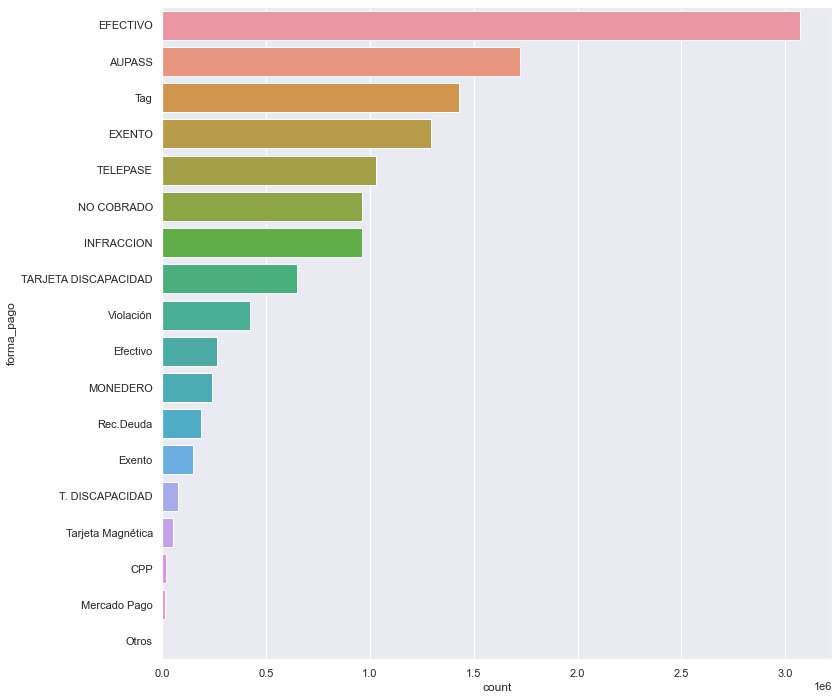

In [306]:
sns.countplot(data = datasetF, y = "forma_pago", order=datasetF['forma_pago'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='dia'>

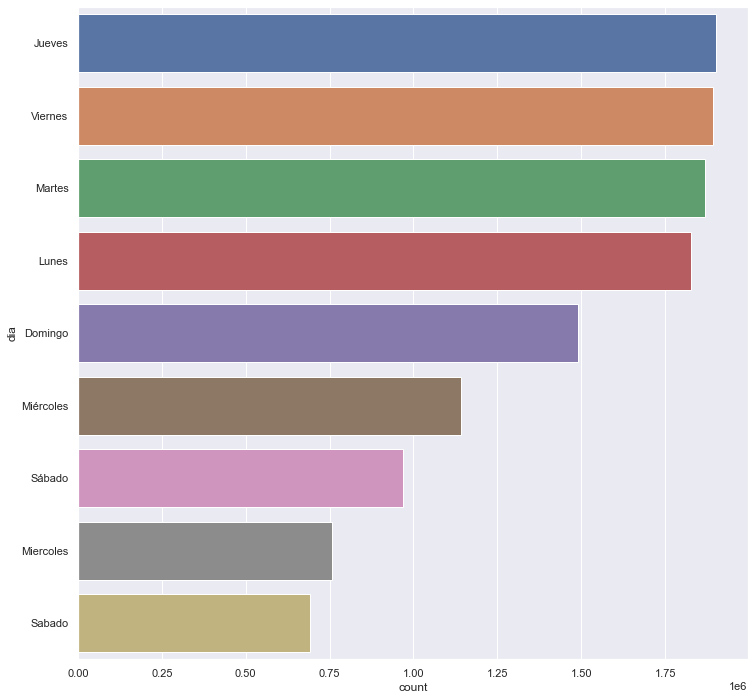

In [307]:

sns.countplot(data = datasetF, y = "dia", order=datasetF['dia'].value_counts().index)

Error en la toma de datos, los miercoles y los sabados con o sin tilde

In [308]:
datasetF.dia.value_counts()

Jueves       1900524
Viernes      1892810
Martes       1869867
Lunes        1828000
Domingo      1488856
Miércoles    1142885
Sábado        967675
Miercoles     756174
Sabado        692075
Name: dia, dtype: int64

Datos en estación

<AxesSubplot:xlabel='count', ylabel='estacion'>

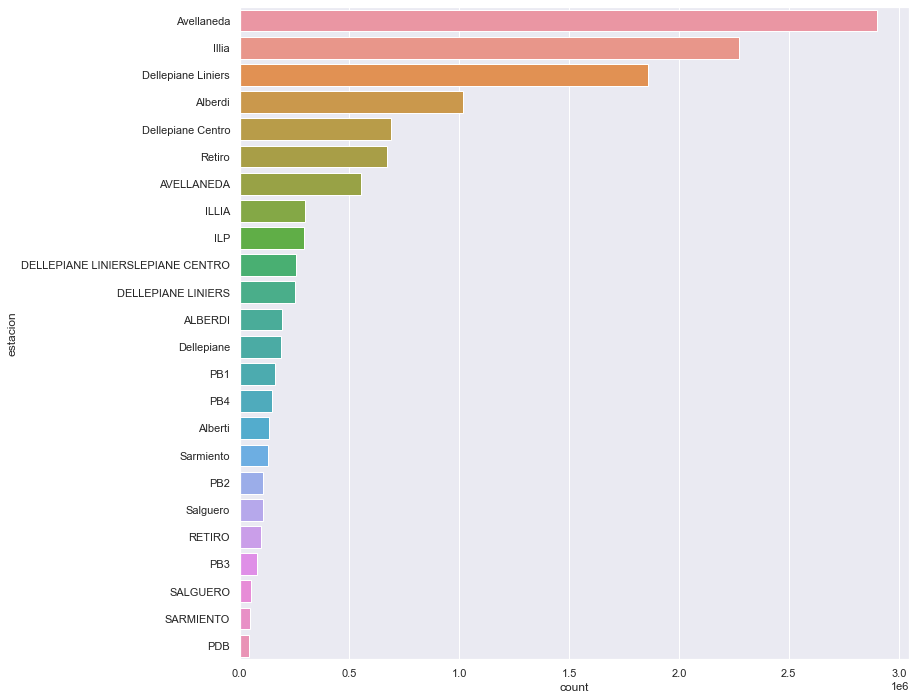

In [309]:
sns.countplot(data = datasetF, y = "estacion", order=datasetF['estacion'].value_counts().index)
plt.savefig('fbpf2.png')

In [310]:
#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(datasetF.estacion=='Illia', datasetF.forma_pago == 'EFECTIVO')
datasetF = datasetF[mask]

#Quitamos las columnas que no vamos a utilizar
datasetF.drop(columns = ['forma_pago', 'estacion'], inplace = True)

datasetF.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
10,Jueves,NaN,Liviano,176.0,2009-01-01 00:00:00
15,Jueves,NaN,Pesado,4.0,2009-01-01 00:00:00
24,Jueves,NaN,Liviano,1083.0,2009-01-01 01:00:00
25,Jueves,NaN,Liviano,5.0,2009-01-01 01:00:00
35,Jueves,NaN,Pesado,12.0,2009-01-01 01:00:00


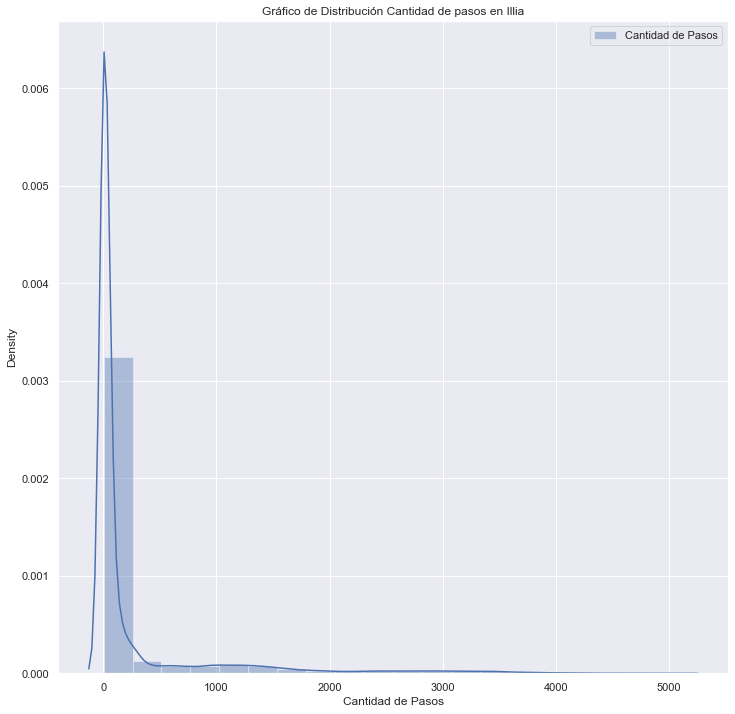

In [311]:
#Distribución de los pasos en la estación Illia

sns.distplot(datasetF.cantidad_pasos, bins = 20, label = 'Cantidad de Pasos')
plt.title('Gráfico de Distribución Cantidad de pasos en Illia')
plt.xlabel('Cantidad de Pasos')
plt.legend()

<AxesSubplot:xlabel='cantidad_pasos'>

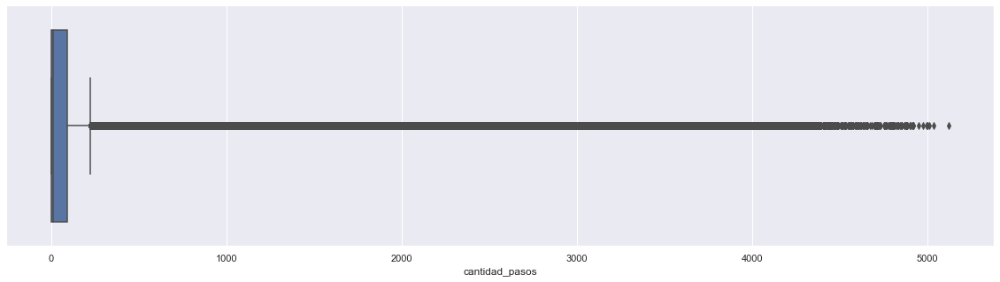

In [312]:
#Encontrando valores atípicos en la columna cantidad de pasos
plt.figure(figsize=(20,5))
sns.boxplot(data = datasetF, x = "cantidad_pasos")

Se observan claramente los valores atípicos.

In [313]:
datasetF.describe()

,cantidad_pasos
count,754669.000000
mean,258.652494
std,651.456740
min,1.000000
25%,3.000000
50%,13.000000
75%,92.000000
max,5125.000000


In [314]:
datasetF.shape

(754669, 5)

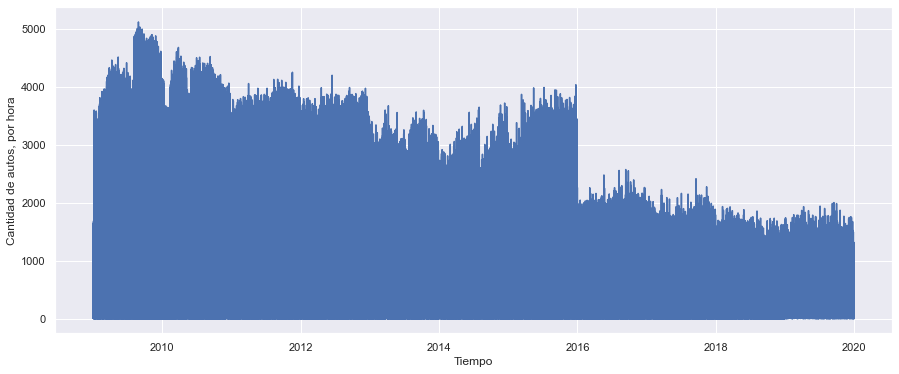

In [315]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(datasetF.fecha, datasetF.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

No se evidencia un patrón en los datos para poder hayar un modelo a implementar y una autocorrelación.

In [316]:
datasetF.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
10,Jueves,NaN,Liviano,176.0,2009-01-01 00:00:00
15,Jueves,NaN,Pesado,4.0,2009-01-01 00:00:00
24,Jueves,NaN,Liviano,1083.0,2009-01-01 01:00:00
25,Jueves,NaN,Liviano,5.0,2009-01-01 01:00:00
35,Jueves,NaN,Pesado,12.0,2009-01-01 01:00:00


In [317]:
datasetF.tail()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
10004973,Martes,Provincia,Liviano,556.0,2019-12-31 22:00:00
10005003,Martes,Provincia,Pesado,1.0,2019-12-31 22:00:00
10005023,Martes,Centro,Liviano,580.0,2019-12-31 22:00:00
10005079,Martes,Centro,Liviano,214.0,2019-12-31 23:00:00
10005087,Martes,Provincia,Liviano,190.0,2019-12-31 23:00:00


## Resampleo

**¿Sumamos (.sum()) la cantidad de pasos o hacemos el promedio(.mean()), mediana?**

RESAMPLEO DIARIO

In [318]:
#Resampleamos SUMA nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diarioR = datasetF.resample('D', on = 'fecha').sum()
print(diarioR.shape)
diarioR.head()

(4017, 1)


,cantidad_pasos
fecha,
2009-01-01,23250.0
2009-01-02,28239.0
2009-01-03,27148.0
2009-01-04,29781.0
2009-01-05,48577.0


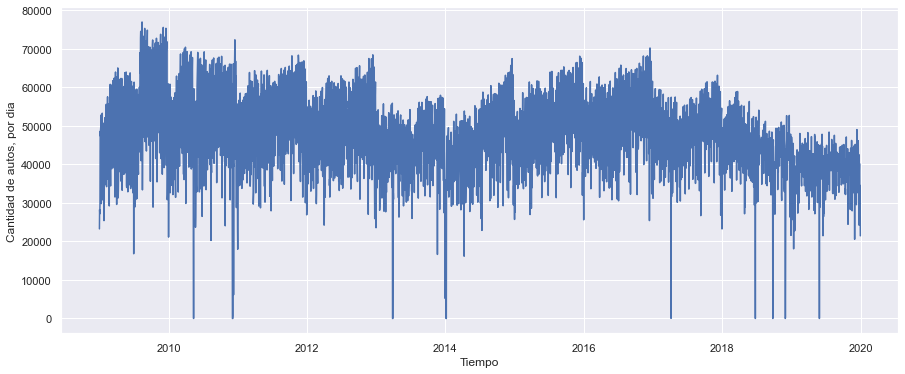

In [319]:
plt.figure(figsize = (15,6))
plt.plot(diarioR.index, diarioR.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

In [320]:
diarioR.cantidad_pasos[diarioR.cantidad_pasos < 20000] = np.nan

In [321]:
diarioR.isna().sum()

cantidad_pasos    29
dtype: int64

In [322]:
print(diarioR.isna().sum())
diarioR = diarioR.interpolate()
print(diarioR.isna().sum())

cantidad_pasos    29
dtype: int64
cantidad_pasos    0
dtype: int64


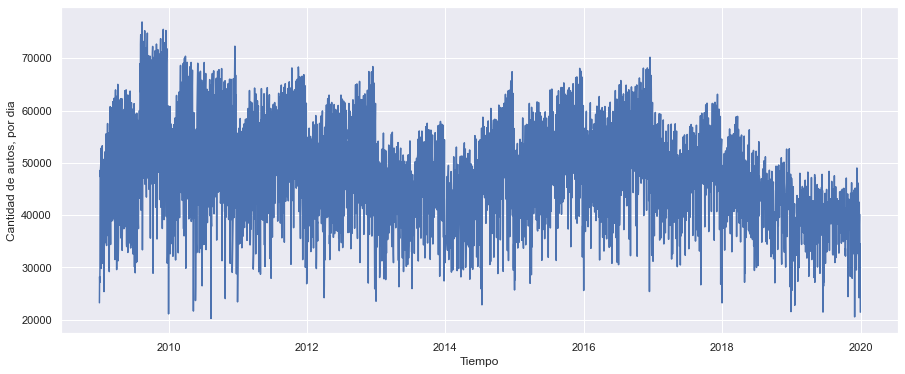

In [323]:
plt.figure(figsize = (15,6))
plt.plot(diarioR.index, diarioR.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

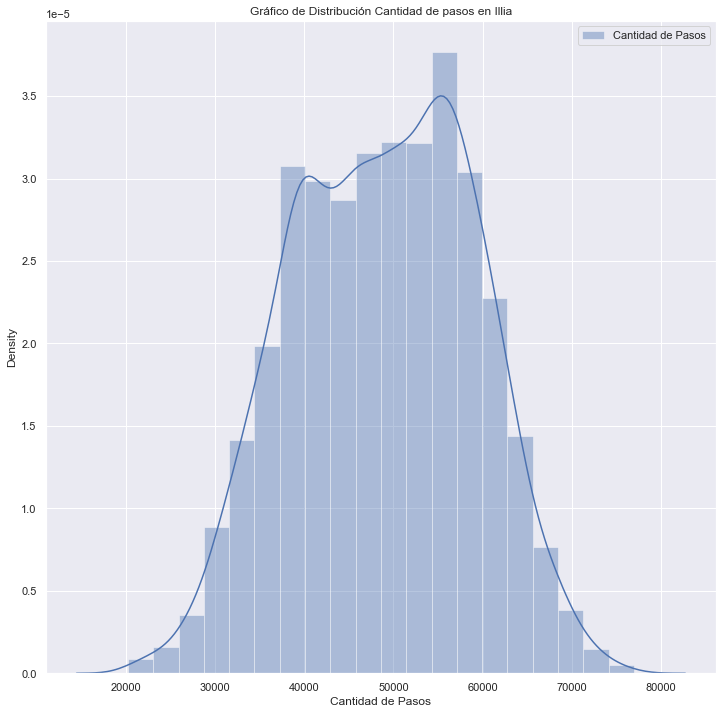

In [324]:
#Distribución de los pasos en la estación Illia

sns.distplot(diarioR.cantidad_pasos, bins = 20, label = 'Cantidad de Pasos')
plt.title('Gráfico de Distribución Cantidad de pasos en Illia')
plt.xlabel('Cantidad de Pasos')
plt.legend()

**VENTANA DE TIEMPO**

In [325]:
ventana = int(365*1/7) #Esto es una ventana 
#ventana= 7
diario_promedio_tendencia = diarioR.cantidad_pasos.rolling(window=ventana, center = False).mean()


In [326]:
diario_promedio_tendencia.isna().sum()

51

¿Por qué aparecen tanto valores faltantes?¿Cuántos son?¿A qué corresponde?

Grafiquemos

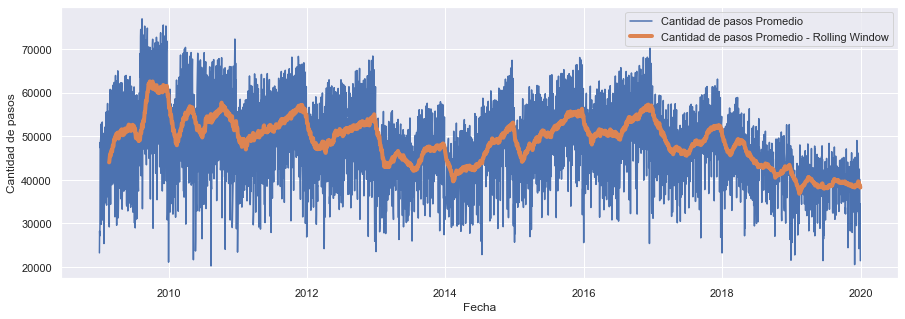

In [327]:
plt.figure(figsize = (15,5))
plt.plot(diarioR.index, diarioR.cantidad_pasos, label = 'Cantidad de pasos Promedio')
plt.plot(diario_promedio_tendencia, lw = 4, label = 'Cantidad de pasos Promedio - Rolling Window')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Regresión Lineal para la linea de tendencia

In [328]:
diarioR['fecha_numeros']=diarioR.index.map(datetime.datetime.toordinal)
diarioR.head()

,cantidad_pasos,fecha_numeros
fecha,,
2009-01-01,23250.0,733408
2009-01-02,28239.0,733409
2009-01-03,27148.0,733410
2009-01-04,29781.0,733411
2009-01-05,48577.0,733412


In [329]:
from sklearn.linear_model import LinearRegression
lR = LinearRegression()
lR.fit(diarioR.fecha_numeros.values.reshape(-1, 1), diarioR.cantidad_pasos)

LinearRegression()

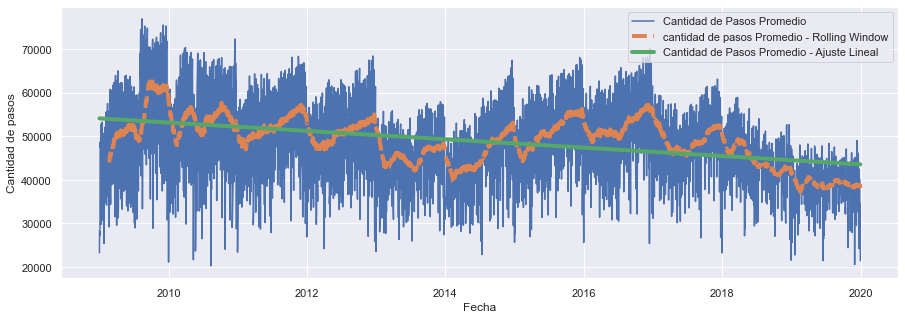

In [330]:
plt.figure(figsize = (15,5))
plt.plot(diarioR.index, diarioR.cantidad_pasos, label = 'Cantidad de Pasos Promedio')
plt.plot(diario_promedio_tendencia, ls = '--', lw = 4, label = 'cantidad de pasos Promedio - Rolling Window')
plt.plot(diarioR.index, lR.predict(diarioR.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de Pasos Promedio - Ajuste Lineal')
# plt.xlim(datetime.date(1985,1,1), datetime.date(2018,1,1))
# plt.ylim([0,30])
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.legend()
plt.show()

Como se observo anteriormente, la tendencia es a la baja a medida que se avanza en el tiempo. Sin embargo, no se ve tan inclinada a traves de los años.

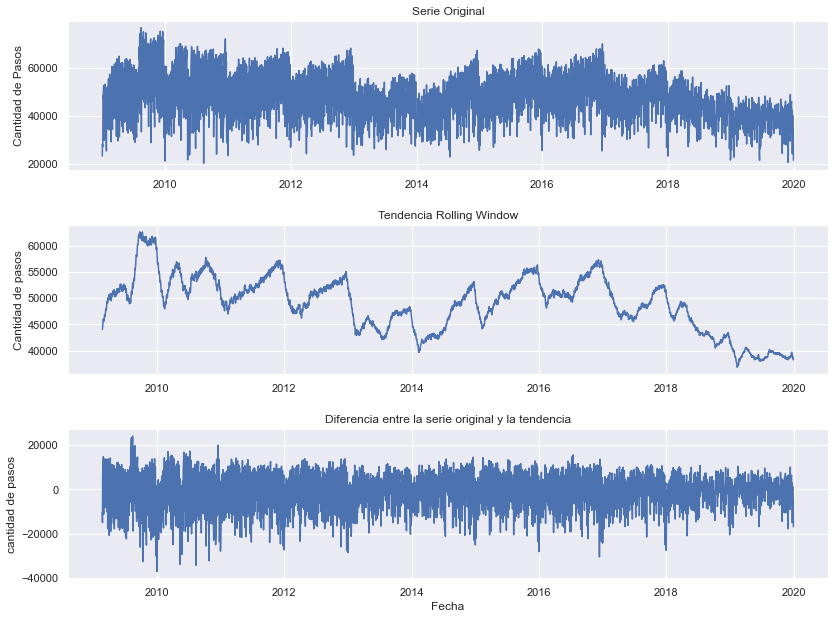

In [331]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diarioR.index, diarioR.cantidad_pasos)
plt.ylabel('Cantidad de Pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(diario_promedio_tendencia)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(diarioR.index, diarioR.cantidad_pasos - diario_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('cantidad de pasos')

plt.tight_layout()
plt.show()


En este gráfico, en donde vemos 3 gráficas, la primera es la serie original, la segunda es como se comporta la tendencia y la tercer como el título lo dice, es la diferencia entre la serie original y la tendencia, lo que nos da como resultado el Ruido. Esta última gráfica tiene indicios de Ruido Blanco, ya que parece tener media cero y varianza constante, dos de varias condiciones para que el Ruido no tenga patrón.

**DESCOMPOSICÓN ESTACIONAL**

In [332]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(diarioR.cantidad_pasos, model='additive')
#result.plot()
#plt.show()

In [333]:
result.trend

fecha
2009-01-01             NaN
2009-01-02             NaN
2009-01-03             NaN
2009-01-04    36186.142857
2009-01-05    39951.285714
                  ...     
2019-12-27    31197.428571
2019-12-28    30801.285714
2019-12-29             NaN
2019-12-30             NaN
2019-12-31             NaN
Freq: D, Name: trend, Length: 4017, dtype: float64

In [334]:
result.seasonal

fecha
2009-01-01     4971.902833
2009-01-02     6577.136628
2009-01-03    -6588.215628
2009-01-04   -11225.041831
2009-01-05      348.866907
                  ...     
2019-12-27     6577.136628
2019-12-28    -6588.215628
2019-12-29   -11225.041831
2019-12-30      348.866907
2019-12-31     2110.189782
Freq: D, Name: seasonal, Length: 4017, dtype: float64

Grafiquemos.

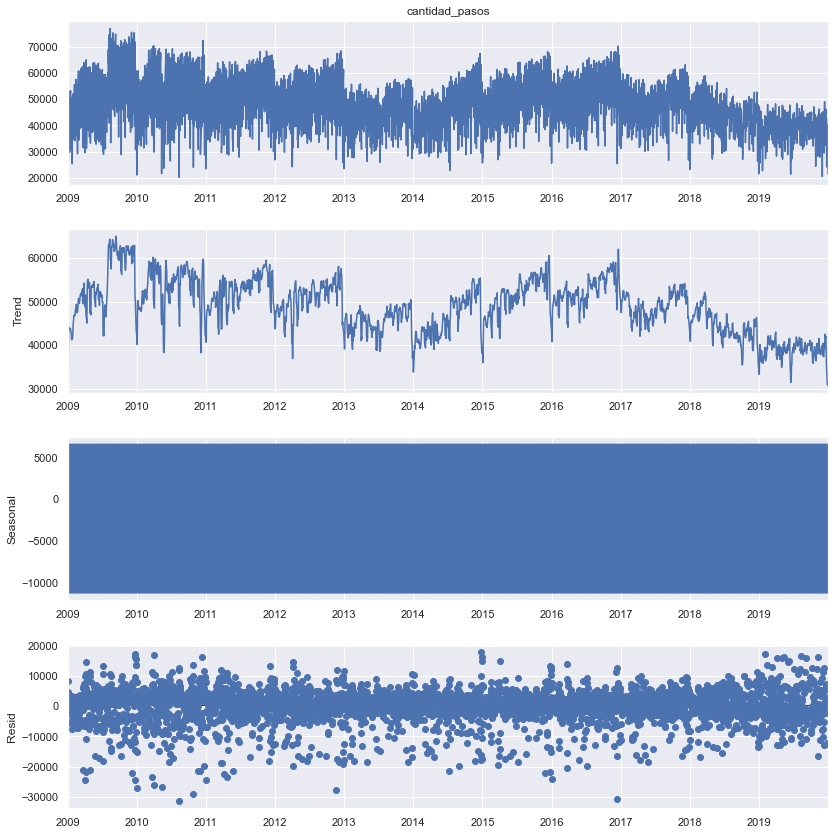

In [335]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = [12,12]
result.plot()
plt.show()

In [336]:
diarioR.head()

,cantidad_pasos,fecha_numeros
fecha,,
2009-01-01,23250.0,733408
2009-01-02,28239.0,733409
2009-01-03,27148.0,733410
2009-01-04,29781.0,733411
2009-01-05,48577.0,733412


In [337]:
diarioR.drop(columns = ['fecha_numeros'], inplace = True)

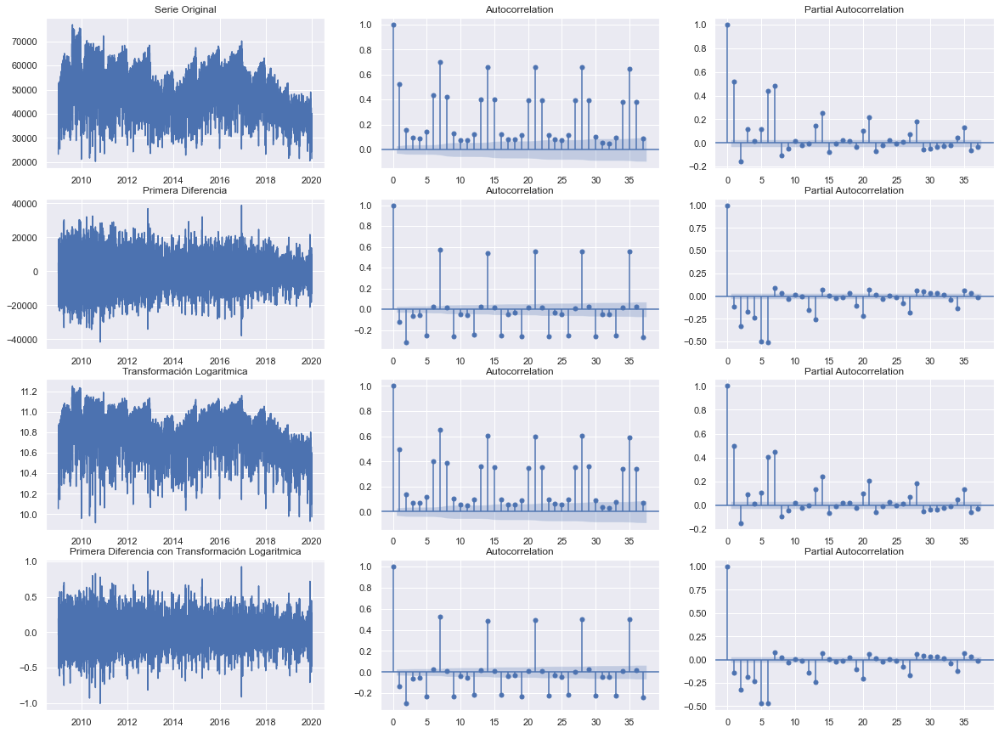

In [338]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, axes = plt.subplots(4,3, figsize=(20,15))
#fig, axes = plt.subplots(3,2, sharex=True)
axes[0, 0].plot(diarioR); axes[0, 0].set_title('Serie Original')
plot_acf(diarioR, ax=axes[0, 1])
plot_pacf(diarioR, ax=axes[0, 2])

axes[1, 0].plot(diarioR.diff()); axes[1, 0].set_title('Primera Diferencia')
plot_acf(diarioR.diff().dropna(), ax=axes[1, 1])
plot_pacf(diarioR.diff().dropna(), ax=axes[1, 2])

axes[2, 0].plot(np.log(diarioR)); axes[2, 0].set_title('Transformación Logaritmica')
plot_acf(np.log(diarioR).dropna(), ax=axes[2, 1])
plot_pacf(np.log(diarioR).dropna(), ax=axes[2, 2])

axes[3, 0].plot(np.log(diarioR).diff()); axes[3, 0].set_title('Primera Diferencia con Transformación Logaritmica')
plot_acf(np.log(diarioR).diff().dropna(), ax=axes[3, 1])
plot_pacf(np.log(diarioR).diff().dropna(), ax=axes[3, 2])

plt.show()

In [339]:
modelR = auto_arima(diarioR.cantidad_pasos, trace=True, error_action="ignore", suppress_warnings=True)
modelR.fit(diarioR.cantidad_pasos)

forecastR = modelR.predict(n_periods=len(diarioR.cantidad_pasos))
diarioR.cantidad_pasos["Forecast_ARIMAX"] = forecastR

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=83324.656, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=85269.777, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=85214.374, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=84339.270, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=85267.778, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=83588.714, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=83595.391, Time=0.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=83502.388, Time=1.16 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=83449.239, Time=1.48 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=83837.075, Time=1.07 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=83548.545, Time=1.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=83569.913, Time=0.70 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=2.94 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=83320.848, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0]  

In [340]:
#ARIMA(p,d,q)

from statsmodels.tsa.arima.model import ARIMA
modelR = ARIMA(diarioR, order=(2,1,2))
model_fitR = modelR.fit()

In [341]:
print(model_fitR.summary())

                               SARIMAX Results                                
Dep. Variable:         cantidad_pasos   No. Observations:                 4017
Model:                 ARIMA(2, 1, 2)   Log Likelihood              -41655.424
Date:                Wed, 23 Jun 2021   AIC                          83320.848
Time:                        14:39:49   BIC                          83352.338
Sample:                    01-01-2009   HQIC                         83332.008
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8922      0.023     38.911      0.000       0.847       0.937
ar.L2         -0.5041      0.013    -39.601      0.000      -0.529      -0.479
ma.L1         -1.4578      0.025    -57.689      0.0

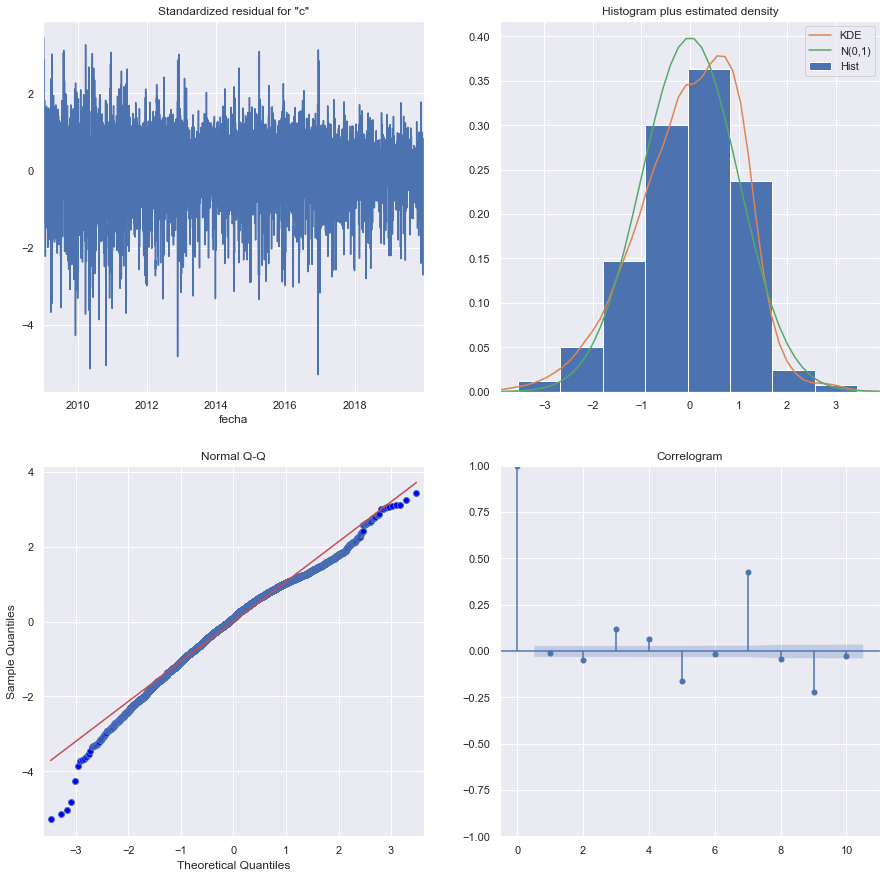

In [342]:
model_fitR.plot_diagnostics(figsize=(15, 15))
plt.savefig('RuidoBlancoARIMA212.png')
plt.show()

In [343]:
diarioR.shape

(4017, 1)

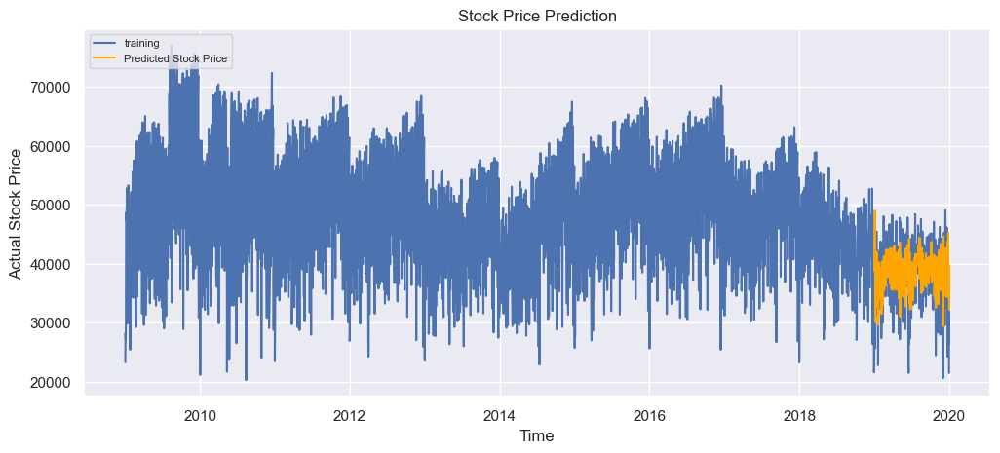

In [374]:
#model_fit.forecast(steps=100) OUTSAMPLE
fcR = model_fitR.predict(start=3652,end=4017)  # 95% confidence INSAMPLE
fc_seriesR = pd.Series(fcR)
plt.figure(figsize=(12,5), dpi=100)
plt.plot(diarioR , label='training')
# plt.plot(test, color = 'blue', label='Actual Stock Price')
plt.plot(fc_seriesR, color = 'orange',label='Predicted Stock Price')
# plt.fill_between(lower_series.index, lower_series, upper_series, 
#                  color='k', alpha=.10)
plt.title('Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('Actual Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.savefig('modeloArima212.png')
plt.show()

In [345]:
# report performance
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
test_dataR = diarioR.cantidad_pasos[3651:4017] 

mse = mean_squared_error(test_dataR, fcR)
print('MSE: '+str(mse))
mae = mean_absolute_error(test_dataR, fcR)
print('MAE: '+str(mae))
#rmse = math.sqrt(mean_squared_error(test_data, fc))
#print('RMSE: '+str(rmse))
mape = np.mean(np.abs(fcR - test_dataR)/np.abs(test_dataR))
print('MAPE: '+str(mape))

MSE: 12640386.612249916
MAE: 2608.2408461602727
MAPE: 0.1127493661215771


In [346]:
print('RMSE:', np.sqrt(metrics.mean_squared_error(test_dataR, fcR)))

RMSE: 3555.332138106075


In [347]:
from sklearn.metrics import r2_score
print('Arimax')
print('R2 :', r2_score(test_dataR, fcR))

Arimax
R2 : 0.5122788618935168


In [348]:
diarioR.tail()

,cantidad_pasos
fecha,
2019-12-27,40182.0
2019-12-28,30681.0
2019-12-29,26259.0
2019-12-30,34523.0
2019-12-31,21447.0


MODELO PROPHET

In [349]:
senialR = diarioR.cantidad_pasos
senialR.head()

fecha
2009-01-01    23250.0
2009-01-02    28239.0
2009-01-03    27148.0
2009-01-04    29781.0
2009-01-05    48577.0
Freq: D, Name: cantidad_pasos, dtype: float64

In [350]:
senialR.tail()

fecha
2019-12-27    40182.0
2019-12-28    30681.0
2019-12-29    26259.0
2019-12-30    34523.0
2019-12-31    21447.0
Freq: D, Name: cantidad_pasos, dtype: float64

In [351]:
dfR = pd.DataFrame((senialR.items()), columns = ["ds","y"])
dfR.head()

,ds,y
0,2009-01-01,23250.0
1,2009-01-02,28239.0
2,2009-01-03,27148.0
3,2009-01-04,29781.0
4,2009-01-05,48577.0


In [352]:
dfR.tail()

,ds,y
4012,2019-12-27,40182.0
4013,2019-12-28,30681.0
4014,2019-12-29,26259.0
4015,2019-12-30,34523.0
4016,2019-12-31,21447.0


In [353]:
# Split data into train / test sets 
# trainR = diarioR.iloc[:len(diarioR.cantidad_pasos)] 
# testR = diarioR.iloc[len(diarioR.cantidad_pasos)-365:] # 3 meses para el testeo 

In [354]:
TEST_SIZER = 365
trainR, testR = dfR.iloc[:-TEST_SIZER], dfR.iloc[-TEST_SIZER:]  

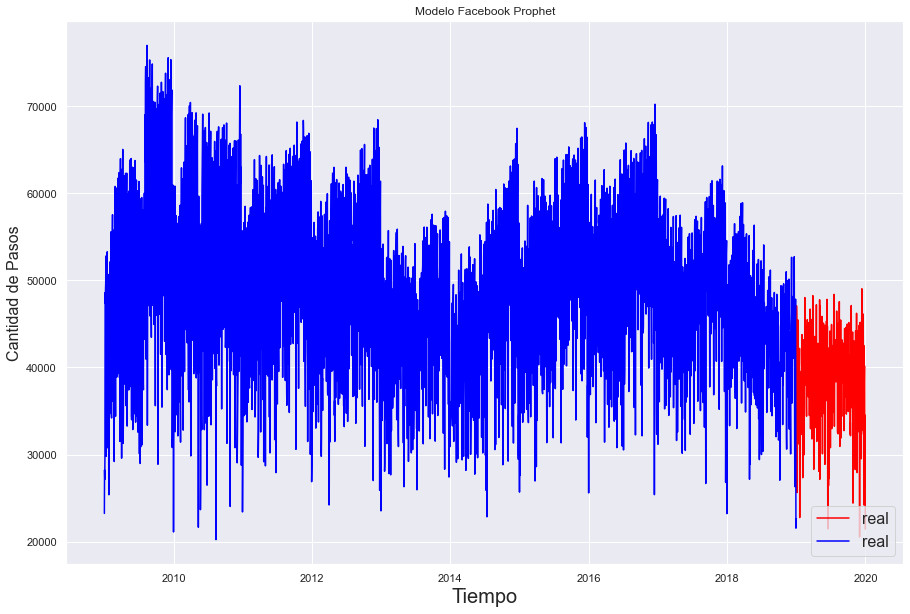

In [355]:
plt.figure(figsize=(15,10))
plt.plot(testR.set_index('ds'), color = 'red',  label='real')
plt.plot(trainR.set_index('ds'), color = 'blue',  label='real')

#plt.plot(forecast[forecast['ds']>=pd.datetime(2018,7,1)].set_index('ds')['yhat'], ls='-.', label='Prophet predictions', color = 'red')
plt.legend(loc="lower right")
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet")
plt.xlabel('Tiempo' ,fontsize=20 )
plt.legend(loc=4, prop={'size': 16})
plt.show()

In [356]:
testR

,ds,y
3652,2019-01-01,27038.0
3653,2019-01-02,47080.0
3654,2019-01-03,46194.0
3655,2019-01-04,42887.0
3656,2019-01-05,25650.0
...,...,...
4012,2019-12-27,40182.0
4013,2019-12-28,30681.0
4014,2019-12-29,26259.0
4015,2019-12-30,34523.0


In [357]:
trainR

,ds,y
0,2009-01-01,23250.0
1,2009-01-02,28239.0
2,2009-01-03,27148.0
3,2009-01-04,29781.0
4,2009-01-05,48577.0
...,...,...
3647,2018-12-27,45929.0
3648,2018-12-28,47832.0
3649,2018-12-29,35446.0
3650,2018-12-30,21559.0


In [358]:
print(len(trainR), len(testR))

3652 365


In [359]:
modeloR = Prophet( 
                        changepoint_prior_scale = 0.05,
                        n_changepoints = 200,
                         seasonality_mode =  'additive',
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         interval_width=0.95)

In [360]:
modeloR.fit(trainR)

In [361]:
futureR = modeloR.make_future_dataframe(periods=365)

In [362]:
forecastR = modeloR.predict(futureR)
forecastR[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4012,2019-12-27,39477.021450,27189.002168,51280.139021
4013,2019-12-28,24923.715836,12797.937701,37827.001273
4014,2019-12-29,19523.811193,7174.480247,30676.350260
4015,2019-12-30,31540.392073,19628.347914,43634.002450
4016,2019-12-31,32956.992782,21292.380879,45070.405699


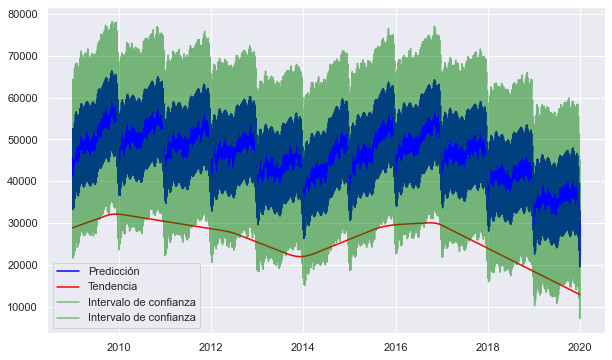

In [363]:
plt.figure(figsize=(10,6))
plt.plot(forecastR.ds,forecastR.yhat, color = 'blue',label = 'Predicción')
plt.plot(forecastR.ds,forecastR.trend, color = 'red', label = 'Tendencia')
plt.plot(forecastR.ds,forecastR.yhat_lower,color = 'green',alpha = 0.5,label = 'Intervalo de confianza')
plt.plot(forecastR.ds,forecastR.yhat_upper, color = 'green',alpha = 0.5, label = 'Intervalo de confianza')
plt.legend()
plt.show()

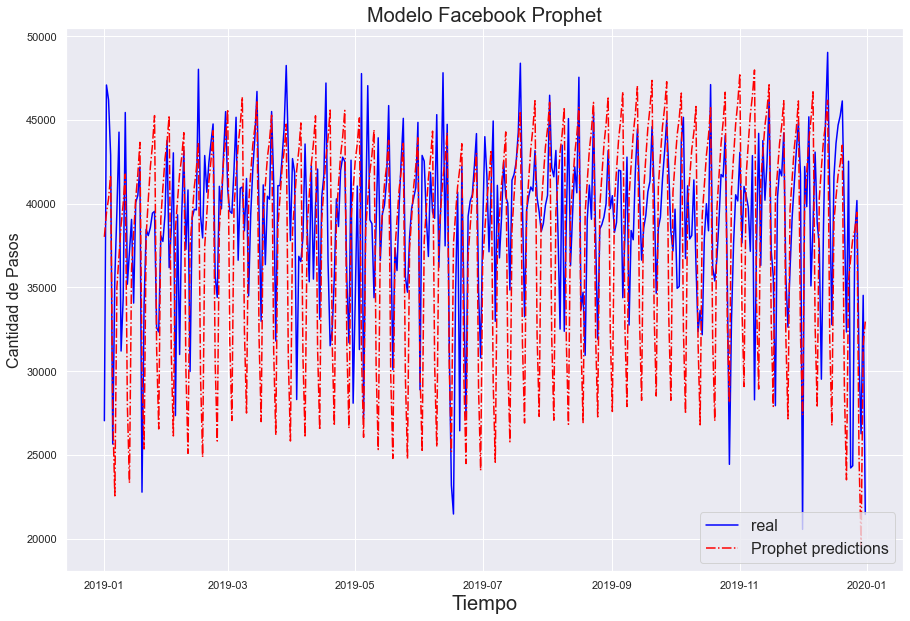

In [373]:
plt.figure(figsize=(15,10))
plt.plot(testR.set_index('ds'), color = 'blue',  label='real')
plt.plot(forecastR[forecastR['ds']>=pd.datetime(2019,1,1)].set_index('ds')['yhat'], ls='-.', label='Prophet predictions', color = 'red')
plt.legend(loc="lower right")
plt.xlabel('Tiempo' ,fontsize=20 )
plt.ylabel("Cantidad de Pasos", fontsize=16)
plt.title("Modelo Facebook Prophet", fontsize=20)
plt.xlabel('Tiempo' ,fontsize=20 )
plt.legend(loc=4, prop={'size': 16})
plt.savefig('modelofb.png')
plt.show()

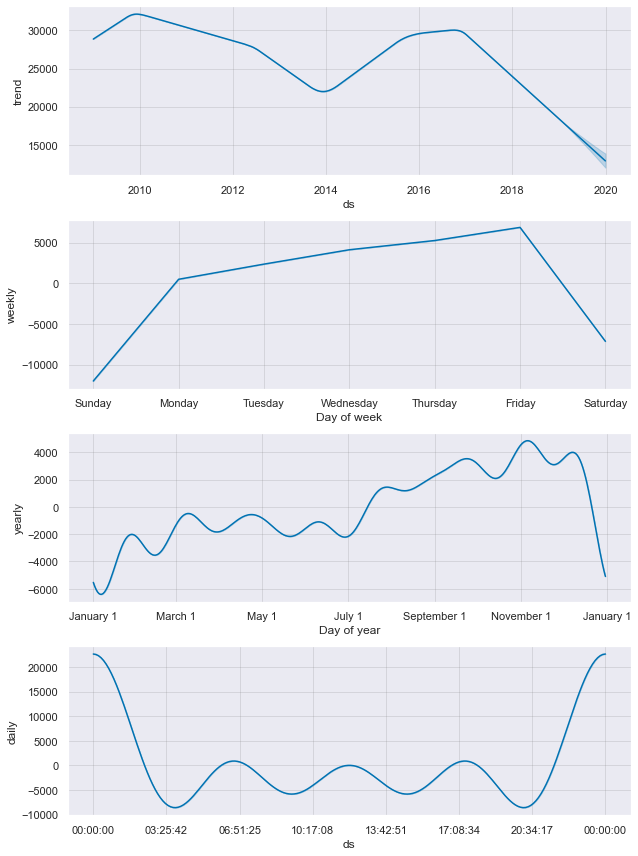

In [365]:
plt.rcParams.update({'font.size': 10})
fR = modeloR.plot_components(forecastR)
plt.savefig('forecastR.png')
plt.show()

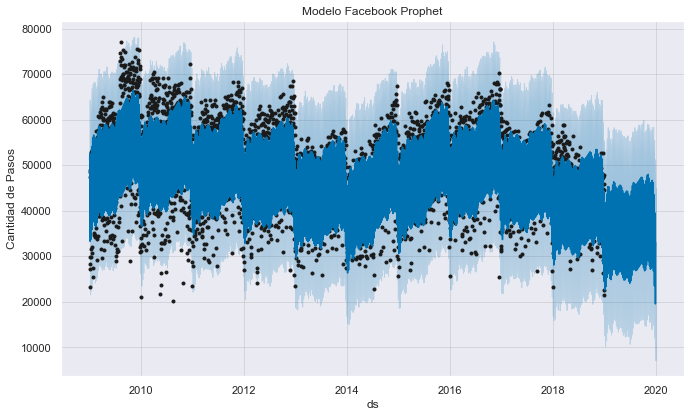

In [366]:
plt.rcParams.update({'font.size': 20})
modeloR.plot(forecastR);
plt.ylabel("Cantidad de Pasos")
plt.title("Modelo Facebook Prophet")
plt.savefig('fbpf2.png')
plt.show()

In [367]:
strt='2018-12-31'
end='2020-12-31'

predic = forecastR[(forecastR['ds']>strt) & (forecastR['ds']<=end)]
print('MAE:', metrics.mean_absolute_error(testR['y'],abs(predic ['yhat'])))
print('MSE:', metrics.mean_squared_error(testR['y'],abs(predic ['yhat'])))
print('RMSE:', np.sqrt(metrics.mean_squared_error(testR['y'],abs(predic ['yhat']))))

MAE: 5047.422154378662
MSE: 43559470.25030109
RMSE: 6599.959867325035


In [368]:
mape = np.mean(np.abs(predic ['yhat'] - testR['y'])/np.abs(testR['y']))
print('MAPE: '+str(mape))

MAPE: 0.13812862772997456


In [369]:
from sklearn.metrics import r2_score
print('Prophet')
print('R2 :', r2_score(testR['y'],abs(predic ['yhat'])))

Prophet
R2 : -0.7238939018179626


EFectivo y telepase, cantidad de pasos , explica la tendencia hacia abajo
Viernes

Tabla B: **Cuadro de Resultados de Metricas MSE, MAE, MAPE, R2 Y RMSE**

|Modelo         |   MSE    |  MAE   | MAPE   |  R2  | RMSE |
|:--------------|:--------:|:------:|:------:|:----:|-----:|
|ARIMA(6,1,7)   |23547549.9|3523.99 |0.122116|0.2991|4852.5|
|**ARIMA(5,1,5)**   |19145490.1|3196.01 |0.116974|0.4301|**4375.5**|
|SARIMA         |34493076.8|4601.94 |0.116974|-0.018|5873.0|
|RandomForest-os|21942432.2|3324.81 |0.098590|0.2283|4684.2|
|RandomForest-ms|23786710.5|3407.70 |0.123032|0.1635|4877.1|  
|Prophet con Fes|39524932.8|4777.67 |0.133219|-0.253|6286.8| 
|Prophet sin Fes|35947219.5|4424.10 |0.101140|-0.140|5995.6| 
|**ARIMA(2,1,2) +** |12640386.6|2608.24 |0.112749|0.5122|**3555.3**|
|Prophet +      |43559470.2|5047.42 |0.138128|-0.723|6599.9|

Agragandole datos desde el 2009, para el modelo ARIMA(2,1,2), las metricas mejoran relativamente con respecto al ARIMA(5,1,5). No es muy sustancial pero al parecer ayuda a que este modelo aumente su efectividad un poco más.

**Modelo Final :**  Como podemos observar en la Tabla B, el mejor modelo con el menor MSE, MAE y RMSE es el ARIMA. Aunque gráficamente se evidencia que trata de predecir la variabilidad de la serie, no alcanza a recorrer los valores más extremos. Este modelo se escoge a pesar de que los residuos no cumplen con ser Ruido Blanco. 
Por lo tanto, es una sugerencia utilizar este modelo con objetivos de mejora.

**Mejoras al Modelo**

Como mejoras al modelo, podemos implimentar variables exogenas del mismo dataset facilitado. Aplicar one-hot encoding a las features: tipo de vehiculo y sentido, además, aplicar label encoding a los días de la semana. Con esto podemos volver a probar los modelos de ARIMA, modelo de machine learning y Prophet para comparar si esta nueva información le ayudan a los modelos a aprender y predecir mejor.
Además, aplicar Redes Neuronales que son la última tecnología avanzada para mejores predicciones.

In [370]:
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01
1,Domingo,Provincia,Liviano,9,2017-01-01
2,Domingo,Provincia,Liviano,644,2017-01-01
3,Domingo,Provincia,Pesado,6,2017-01-01
4,Domingo,Provincia,Pesado,1,2017-01-01


In [371]:
dataset2.head()

,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Domingo,Dellepiane Centro,Centro,Liviano,NO COBRADO,6,2017-01-01
1,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01
2,Domingo,Illia,Provincia,Liviano,NO COBRADO,3,2017-01-01
3,Domingo,Dellepiane Liniers,Provincia,Liviano,INFRACCION,3,2017-01-01
4,Domingo,Avellaneda,Centro,Liviano,NO COBRADO,36,2017-01-01


In [372]:
datasetF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 754669 entries, 10 to 10005087
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   dia             754669 non-null  object        
 1   sentido         346566 non-null  object        
 2   tipo_vehiculo   754669 non-null  object        
 3   cantidad_pasos  754669 non-null  float64       
 4   fecha           754669 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 34.5+ MB


# Proximos pasos

Una serie de Tiempo, es un conjunto de muestras tomadas a intervalos de tiempos regulares [1]. Este tipo de información recolectada nos da la posibilidad de saber como se comporta a traves del tiempo patrones, estacionalidades y comportamientos que ocurren a lo largo de los años; y según como se comporten los datos poder hacer pronosticos y tratar de saber con un cierto interlavo de confianza, que puede pasar y en consecuencia poder planear y prevenir cualquier acontecimiento.

Como pudimos ver en este trabajo, se desarrollo algunos metodos para poder predicir y que tan bueno fueron estos modelos para predecir estas series de tiempo. Sin embargo, hay un conocimiento desarrollado que no se implemento en este proyecto y son las **Redes Neuronales**. Es un método que espero pueda superar con creces los modelos propuestos en este proyecto ya que su metodologías pertenece a la rama del Deep Learning.

Por ejemplo, las **Redes Feedforward**,se le llama así a las redes en que las salidas de una capa son utilizadas como entradas en la próxima capa [2], es decir que no hay devolución hacias atrás, y se pueden combinar con **Backpropagation** con este algoritmo se pudo entrenar a las redes neuronales de multiples capas de manera supervisada. Este último metodo calcula el error en la salida y lo propaga hacias las capas anteriores, dandele oportunidad a la red de que minimice el error y se ajuste mejor.

Por otro lado, las **Long short term memory** son un tipo de **Redes Neuronales Recurrentes**, este modelo permite conexiones hacia atrás entre las capas, esto las hace muy buenas para series de tiempo, ya que permite a la red recordar valores períodicos cortos o largos. Esto último me parece una muy buena caracteristica del modelo, para tener encuenta el comportamiento de la serie a lo largo del tiempo.

Con esta metodología espero que las metricas en cuanto a errores sean mucho menores, que pueda generalizar un poco más teniendo encuenta mas datos, y tener más confianza en la predicción. Sin embargo, se debe tener cuidado con el sobreajuste si no se tiene cuidado con los parametros o hiperparametros definidos.

# Referencias

[1] https://www.aprendemachinelearning.com/pronostico-de-series-temporales-con-redes-neuronales-en-python/

[2] https://www.aprendemachinelearning.com/breve-historia-de-las-redes-neuronales-artificiales/

[3] https://unipython.com/prediccion-con-series-temporales-con-lstm-redes-neuronales-recurrentes/